In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import RandomizedSearchCV
import umap

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

2026-03-21 17:13:07.902758: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774113188.136427      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1774113188.205417      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1774113188.713701      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774113188.713739      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774113188.713742      55 computation_placer.cc:177] computation placer alr

cuda


In [2]:
!pip install -q sentence-transformers

=== Missing Values per Column ===
id                         0
name                       3
album_name                20
artists                    0
danceability               0
energy                     0
key                        0
loudness                   0
mode                       0
speechiness                0
acousticness               0
instrumentalness           0
liveness                   0
valence                    0
tempo                      0
duration_ms                0
lyrics                     0
year                       0
genre                      0
popularity                 0
total_artist_followers     0
avg_artist_popularity      0
artist_ids                 0
niche_genres               0
dtype: int64
=== After Replacing Missing Values ===
name                      0
album_name                0
artists                   0
danceability              0
energy                    0
key                       0
loudness                  0
mode                  

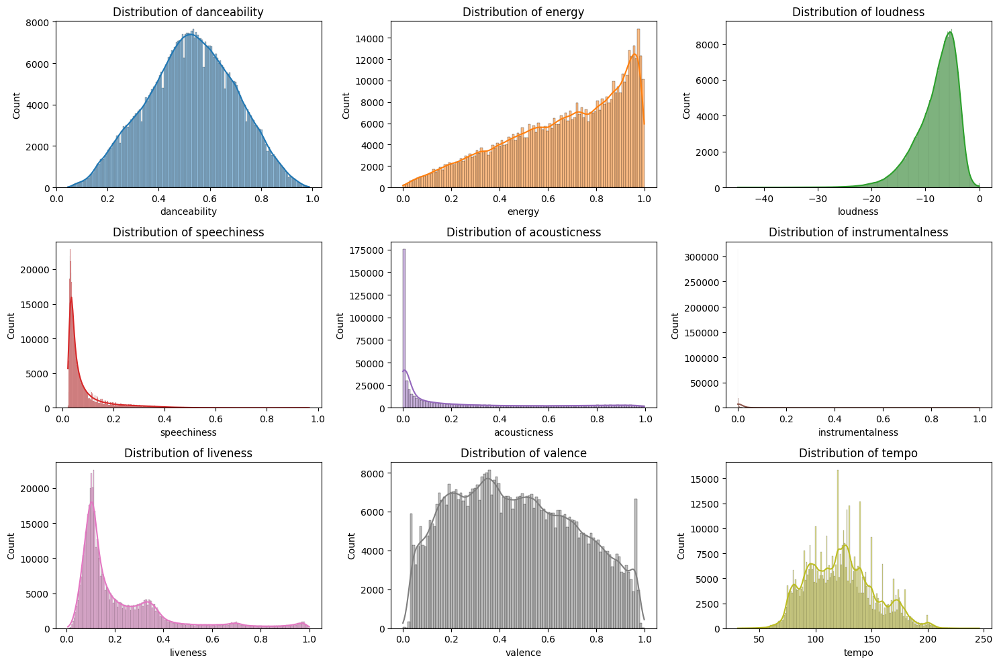

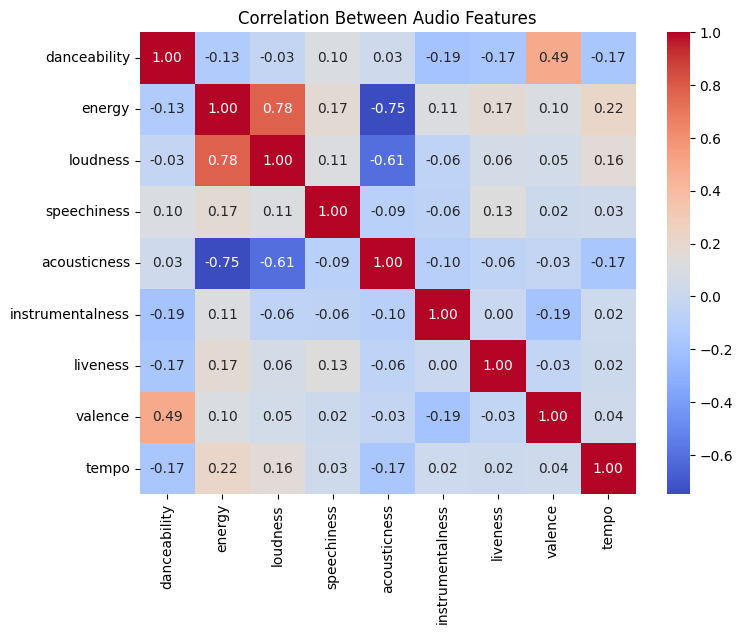

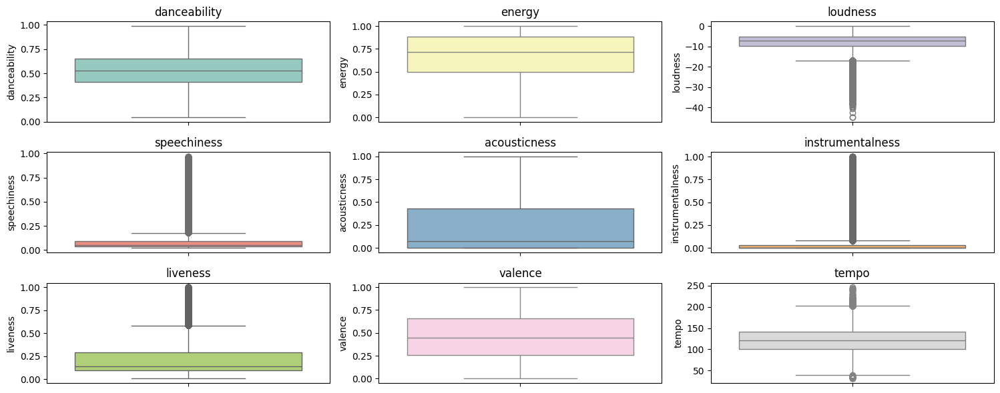

In [3]:
# Load Dataset
df = pd.read_csv("/kaggle/input/datasets/sabrina001/550k-music-dataset/songs.csv")  

# Keep only relevant numeric/audio features for this analysis and also they are the input dimension
audio_cols = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']

# Check for missing/null values
print("=== Missing Values per Column ===")
#print(df[audio_cols + ['lyrics','genre']].isnull().sum())
print(df.isnull().sum())
print("=== After Replacing Missing Values ===")

# Drop the 'id' column
df = df.drop(columns=['id'])

# Handling 'name' missing values (Replacing with "Unknown")
df['name'] = df['name'].fillna("Unknown Name")

# Handling 'album_name' missing values (Replacing with most common album)
df['album_name'] = df['album_name'].fillna(df['album_name'].mode()[0])

# Verify the results
print(df.isnull().sum())
print(df.head())

# Descriptive statistics
desc_stats = df[audio_cols].describe().T
print("=== Descriptive Statistics ===")
print(desc_stats)

# Add range (max - min) for each column
desc_stats['range'] = desc_stats['max'] - desc_stats['min']
print("\n=== Descriptive Stats with Range ===")
print(desc_stats)

# Feature Distribution Plots
plt.figure(figsize=(15,10))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Feature Distribution Plots (for all cols)
'''
cols = ['release_date','len']
plt.figure(figsize=(15,10))
for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()
'''

# Correlation Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df[audio_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Audio Features")
plt.show()

# Boxplots to check for outliers
plt.figure(figsize=(15,6))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df[col], color=sns.color_palette("Set3")[i])
    plt.title(col)
plt.tight_layout()
plt.show()


In [4]:
# Take small subset
df = df.sample(25000, random_state=42)

print(df.shape)
df.head

(25000, 23)


<bound method NDFrame.head of                             name  \
313554             Naive Monarch   
210119  I Can't Live Without You   
136837              Erase It All   
460801              The Majestic   
19995   Ain't What It Used To Be   
...                          ...   
425787          Stone Cold Fever   
385951                Satellites   
141658      Exhaustion & Disgust   
191135                      Heat   
54212                  Big Girls   

                                               album_name  \
313554                                           Versions   
210119                           I Can't Live Without You   
136837                                          Hail Mary   
460801                         Cup of Sand (2017 Reissue)   
19995                                    Billy Currington   
...                                                   ...   
425787  20th Century Masters:The Millennium Collection...   
385951                            Periphery IV: H

In [5]:
df = df.dropna(subset=audio_cols + ['lyrics', 'genre'])
df = df.reset_index(drop=True)

print("Dataset shape:", df.shape)

Dataset shape: (25000, 23)


In [6]:
scaler = StandardScaler()
X_audio = scaler.fit_transform(df[audio_cols])
X_audio = np.expand_dims(X_audio, axis=1)  # (N, 1, features)

print("Audio shape:", X_audio.shape)


Audio shape: (25000, 1, 9)


In [7]:
class ConvVAE(nn.Module):
    def __init__(self, input_dim, latent_dim=16):
        super(ConvVAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv1d(1, 16, 3, padding=1),
            nn.ReLU(),
            nn.Conv1d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.Flatten()
        )

        self.fc_mu = nn.Linear(32 * input_dim, latent_dim)
        self.fc_logvar = nn.Linear(32 * input_dim, latent_dim)

        self.fc_decode = nn.Linear(latent_dim, 32 * input_dim)

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (32, input_dim)),
            nn.ConvTranspose1d(32, 16, 3, padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(16, 1, 3, padding=1)
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        enc = self.encoder(x)
        mu = self.fc_mu(enc)
        logvar = self.fc_logvar(enc)
        z = self.reparameterize(mu, logvar)

        dec_input = self.fc_decode(z)
        recon = self.decoder(dec_input)

        return recon, mu, logvar, z


In [8]:
from sentence_transformers import SentenceTransformer
model_st = SentenceTransformer('all-MiniLM-L6-v2')

lyrics_list = df['lyrics'].tolist()

X_lyrics = model_st.encode(
    lyrics_list,
    batch_size=64,
    show_progress_bar=True,
    convert_to_numpy=True
)

print("Lyrics embedding shape:", X_lyrics.shape)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/391 [00:00<?, ?it/s]

Lyrics embedding shape: (25000, 384)


In [9]:
le = LabelEncoder()
true_labels = le.fit_transform(df['genre'])
print(df['genre'].unique())
print("Number of unique genres:", df['genre'].nunique())

['Rock' 'Pop' 'Country' 'Classical' 'Blues' 'Electronic' 'Folk' 'Jazz'
 'Hip-Hop' 'R&B']
Number of unique genres: 10


In [10]:
# VAE Loss
def vae_loss(recon_x, x, mu, logvar):
    recon_loss = nn.MSELoss()(recon_x, x)
    kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    total = recon_loss + kld
    return total, recon_loss, kld

# Silhouette scorer for Randomized Search
def silhouette_scorer(estimator, X, y=None):
    labels = estimator.fit_predict(X)
    if len(set(labels)) > 1:
        return silhouette_score(X, labels)
    else:
        return -1

# Hyperparamters
latent_dims = [5, 8, 12, 16]
learning_rates = [1e-3, 3e-3, 5e-3]
epochs = 50

best_results = {
    "KMeans": {"silhouette": -1},
    "Agglomerative": {"silhouette": -1},
    "DBSCAN": {"silhouette": -1}
}
all_runs = {
    "KMeans": [],
    "Agglomerative": [],
    "DBSCAN": []
}
for ld in latent_dims:
    for lr in learning_rates:

        print(f"\nTraining VAE -> latent_dim={ld}, lr={lr}")

        input_dim = X_audio.shape[2]
        model = ConvVAE(input_dim, ld).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        dataset = TensorDataset(torch.tensor(X_audio, dtype=torch.float32))
        loader = DataLoader(dataset, batch_size=256, shuffle=True)

        # Train VAE
        for epoch in range(epochs):
            epoch_total = 0
            epoch_mse = 0
            epoch_kld = 0
        
            for batch in loader:
                x = batch[0].to(device)
        
                optimizer.zero_grad()
        
                recon, mu, logvar, _ = model(x)
                total_loss, mse_loss, kld_loss = vae_loss(recon, x, mu, logvar)
        
                total_loss.backward()
                optimizer.step()
        
                epoch_total += total_loss.item()
                epoch_mse += mse_loss.item()
                epoch_kld += kld_loss.item()
        
            print(
                f"Epoch {epoch+1}/{epochs} | MSE: {epoch_mse:.4f} | KLD: {epoch_kld:.4f} | Total Loss: {epoch_total:.4f}")

        # Extract Latent Features
        model.eval()
        with torch.no_grad():
            X_tensor = torch.tensor(X_audio, dtype=torch.float32).to(device)
            recon, mu, logvar, z = model(X_tensor)
        z_audio = mu.cpu().numpy()

        # Hybrid Features
        X_hybrid = np.concatenate([z_audio, X_lyrics], axis=1)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_hybrid)
        X_pca = PCA(n_components=50, random_state=42).fit_transform(X_scaled)

        # Kmeans Randomized search
        param_dist_kmeans = {
            "n_clusters": [4, 5, 6, 8],
            "n_init": [10, 20, 30]
        }

        kmeans = KMeans(random_state=42)

        random_kmeans = RandomizedSearchCV(
            kmeans,
            param_distributions=param_dist_kmeans,
            n_iter=8,
            scoring=silhouette_scorer,
            cv=[(np.arange(X_pca.shape[0]), np.arange(X_pca.shape[0]))],
            random_state=42,
            n_jobs=-1
        )

        random_kmeans.fit(X_pca)
        best_km = random_kmeans.best_estimator_

        labels = best_km.fit_predict(X_pca)

        sil = silhouette_score(X_pca, labels)
        dbi = davies_bouldin_score(X_pca, labels)
        ari = adjusted_rand_score(true_labels, labels)

        print("Best KMeans:", random_kmeans.best_params_, "Sil:", sil, "Dbi:", dbi, "ARI:", ari)

        all_runs["KMeans"].append({
            "latent_dim": ld,
            "lr": lr,
            "params": random_kmeans.best_params_,
            "silhouette": sil,
            "ari": ari,
            "dbi": dbi
        })

        # Agglomerative Randomized Search
        param_dist_agg = {
            "n_clusters": [4, 5, 6, 8],
            "linkage": ['ward', 'average']
        }

        agg = AgglomerativeClustering()

        random_agg = RandomizedSearchCV(
            agg,
            param_distributions=param_dist_agg,
            n_iter=8,
            scoring=silhouette_scorer,
            cv=[(np.arange(X_pca.shape[0]), np.arange(X_pca.shape[0]))],
            random_state=42,
            n_jobs=-1
        )

        random_agg.fit(X_pca)
        best_agg = random_agg.best_estimator_

        labels = best_agg.fit_predict(X_pca)

        sil = silhouette_score(X_pca, labels)
        dbi = davies_bouldin_score(X_pca, labels)
        ari = adjusted_rand_score(true_labels, labels)

        print("Best Agglomerative:", random_agg.best_params_, "Sil:", sil, "Dbi:", dbi, "ARI:", ari)

        all_runs["Agglomerative"].append({
            "latent_dim": ld,
            "lr": lr,
            "params": random_agg.best_params_,
            "silhouette": sil,
            "ari": ari,
            "dbi": dbi
        })

        # DBSCAN Randomized search
        param_dist_db = {
            "eps": [1.5, 2, 2.5, 3],
            "min_samples": [3, 5]
        }

        dbscan = DBSCAN()

        random_db = RandomizedSearchCV(
            dbscan,
            param_distributions=param_dist_db,
            n_iter=8,
            scoring=silhouette_scorer,
            cv=[(np.arange(X_pca.shape[0]), np.arange(X_pca.shape[0]))],
            random_state=42,
            n_jobs=-1
        )

        random_db.fit(X_pca)
        best_db = random_db.best_estimator_

        labels = best_db.fit_predict(X_pca)
        mask = labels != -1

        if len(set(labels[mask])) > 1:
            sil = silhouette_score(X_pca[mask], labels[mask])
            dbi = davies_bouldin_score(X_pca[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = -1, 999, -1

        print("Best DBSCAN:", random_db.best_params_, "Sil:", sil, "Dbi:", dbi, "ARI:", ari)

        all_runs["DBSCAN"].append({
            "latent_dim": ld,
            "lr": lr,
            "params": random_db.best_params_,
            "silhouette": sil,
            "ari": ari,
            "dbi": dbi
        })

best_results = {}

for method, runs in all_runs.items():
    if len(runs) == 0:
        continue

    # Collect metric lists
    sil_vals = [r["silhouette"] for r in runs]
    ari_vals = [r["ari"] for r in runs]
    dbi_vals = [r["dbi"] for r in runs]
    
    sil_min, sil_max = min(sil_vals), max(sil_vals)
    ari_min, ari_max = min(ari_vals), max(ari_vals)
    dbi_min, dbi_max = min(dbi_vals), max(dbi_vals)

    best_score = -1
    best_config = None

    for r in runs:
        sil_norm = (r["silhouette"] - sil_min) / (sil_max - sil_min + 1e-8)
        ari_norm = (r["ari"] - ari_min) / (ari_max - ari_min + 1e-8)
        dbi_norm = (dbi_max - r["dbi"]) / (dbi_max - dbi_min + 1e-8)

        # Equal importance
        combined_score = (sil_norm + ari_norm + dbi_norm) / 3

        if combined_score > best_score:
            best_score = combined_score
            best_config = r

    best_results[method] = best_config
    
# Final Results
print("\n")
print("\nFINAL BEST CONFIGURATIONS (Balanced Metrics)")

for method, config in best_results.items():
    print(f"\n{method}")
    print("Latent Dim:", config["latent_dim"])
    print("Learning Rate:", config["lr"])
    print("Best Params:", config["params"])
    print("Silhouette:", config["silhouette"])
    print("ARI:", config["ari"])
    print("DBI:", config["dbi"])


Training VAE -> latent_dim=5, lr=0.001
Epoch 1/50 | MSE: 100.7213 | KLD: 10.6088 | Total Loss: 111.3302
Epoch 2/50 | MSE: 71.4231 | KLD: 16.6735 | Total Loss: 88.0966
Epoch 3/50 | MSE: 63.0653 | KLD: 22.0484 | Total Loss: 85.1137
Epoch 4/50 | MSE: 59.1707 | KLD: 24.6123 | Total Loss: 83.7830
Epoch 5/50 | MSE: 57.5290 | KLD: 25.5499 | Total Loss: 83.0789
Epoch 6/50 | MSE: 56.8465 | KLD: 25.9601 | Total Loss: 82.8066
Epoch 7/50 | MSE: 56.4815 | KLD: 25.9233 | Total Loss: 82.4048
Epoch 8/50 | MSE: 56.1052 | KLD: 26.2230 | Total Loss: 82.3282
Epoch 9/50 | MSE: 55.7642 | KLD: 26.1983 | Total Loss: 81.9625
Epoch 10/50 | MSE: 55.6807 | KLD: 26.3463 | Total Loss: 82.0270
Epoch 11/50 | MSE: 55.2501 | KLD: 26.2677 | Total Loss: 81.5178
Epoch 12/50 | MSE: 55.0412 | KLD: 26.8610 | Total Loss: 81.9022
Epoch 13/50 | MSE: 54.7698 | KLD: 26.9220 | Total Loss: 81.6919
Epoch 14/50 | MSE: 54.5208 | KLD: 26.8161 | Total Loss: 81.3369
Epoch 15/50 | MSE: 54.3327 | KLD: 27.0862 | Total Loss: 81.4189
Epoch 1

BEST CONFIGURATIONS USED

KMeans
Latent Dim: 8
Learning Rate: 0.005
Best Params: {'n_init': 10, 'n_clusters': 4}
Silhouette: 0.058998063
DBI: 3.5498945022282276
ARI: 0.06249884635615513

Agglomerative
Latent Dim: 5
Learning Rate: 0.003
Best Params: {'n_clusters': 4, 'linkage': 'average'}
Silhouette: 0.09043101
DBI: 1.904239177454648
ARI: 0.0018041238494466152

DBSCAN
Latent Dim: 12
Learning Rate: 0.003
Best Params: {'min_samples': 3, 'eps': 1.5}
Silhouette: 0.95927453
DBI: 0.06608436787194508
ARI: 0.1998810232004759

Using KMeans Params: {'n_init': 10, 'n_clusters': 4}

Using Agglomerative Params: {'n_clusters': 4, 'linkage': 'average'}

Using DBSCAN Params: {'min_samples': 3, 'eps': 1.5}


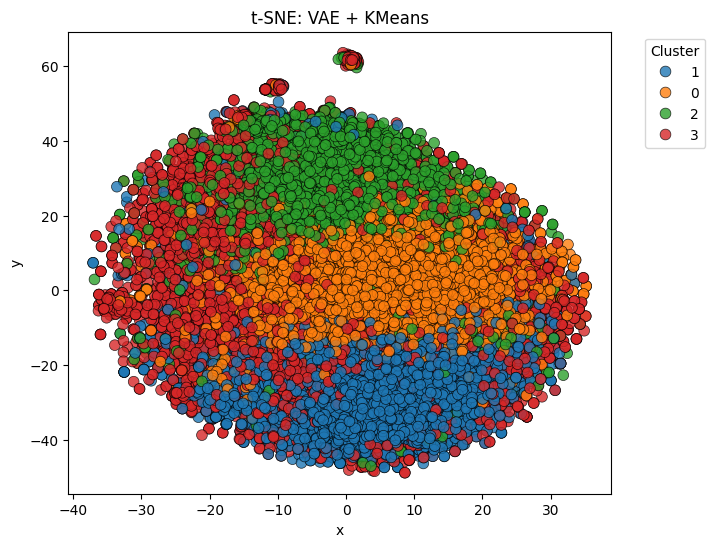

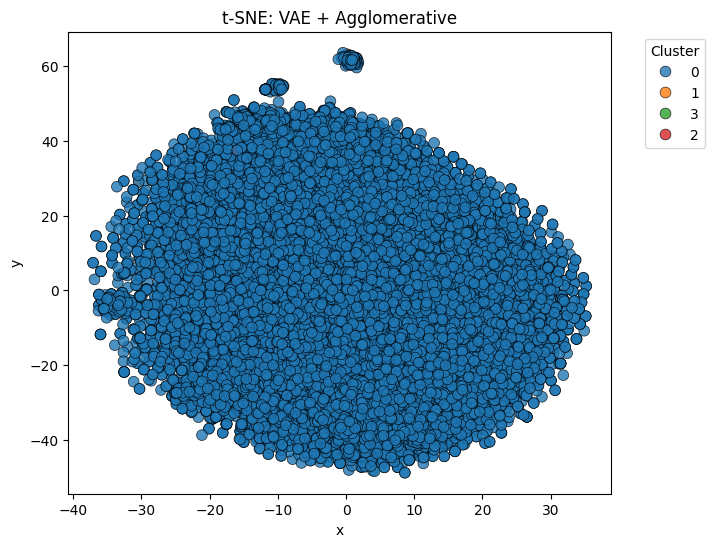

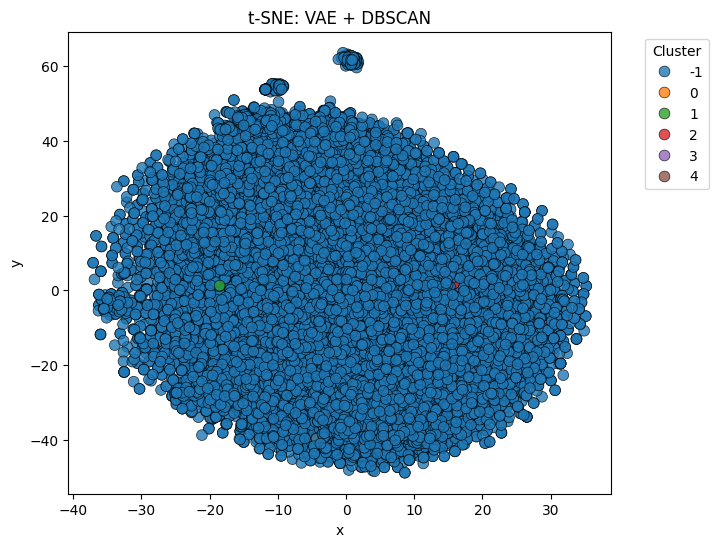

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


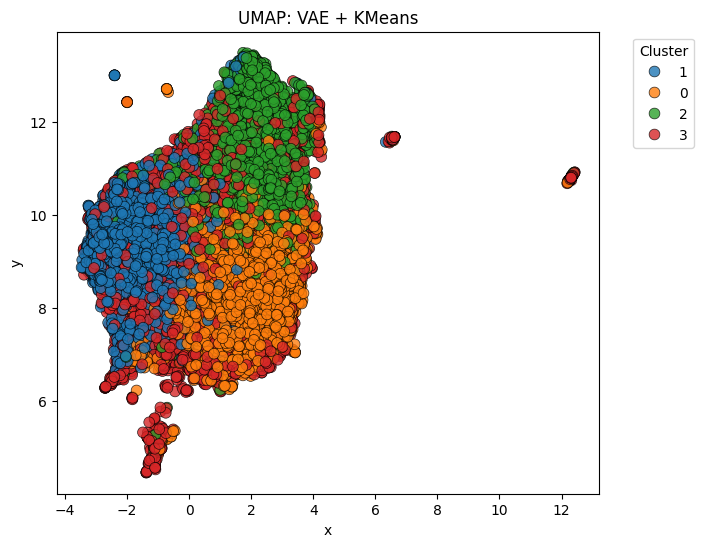

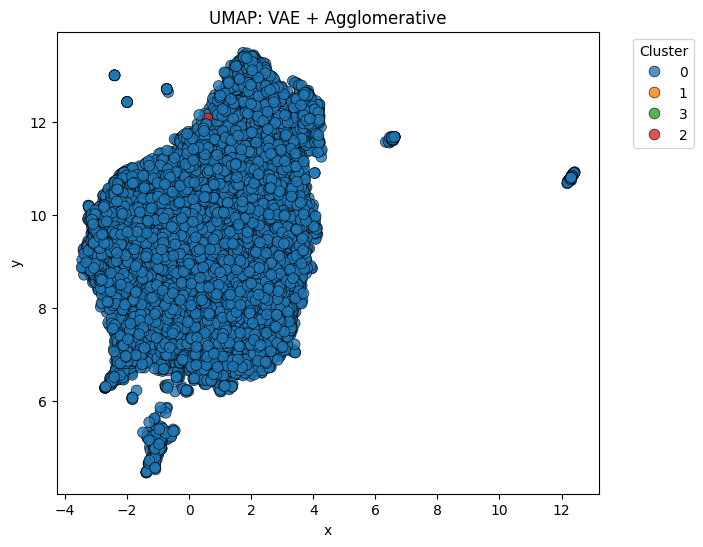

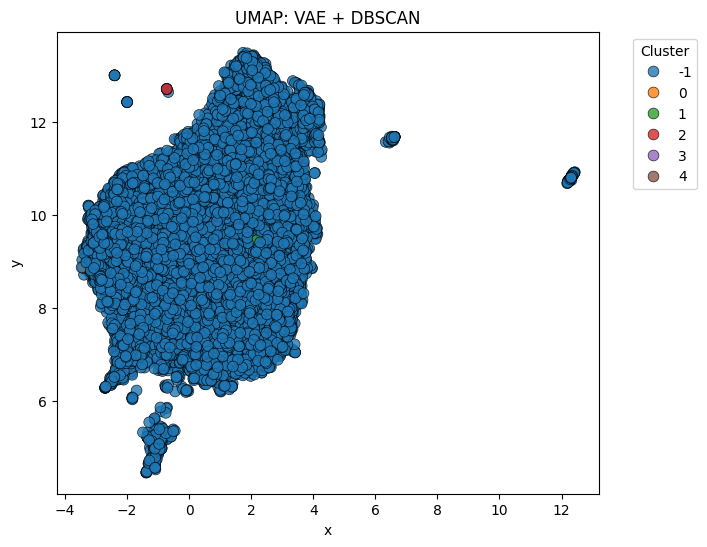

In [13]:
print("BEST CONFIGURATIONS USED")

for method, config in best_results.items():
    print(f"\n{method}")
    
    if config is not None and "params" in config:
        print("Latent Dim:", config["latent_dim"])
        print("Learning Rate:", config["lr"])
        print("Best Params:", config["params"])
        print("Silhouette:", config["silhouette"])
        print("DBI:", config["dbi"])
        print("ARI:", config["ari"])
    else:
        print("No valid clustering found during tuning.")
X_hybrid = np.concatenate([z_audio, X_lyrics], axis=1)
X_scaled = StandardScaler().fit_transform(X_hybrid)

cluster_results = {}

# KMeans
if 'KMeans' in best_results and best_results['KMeans'] is not None:
    if "params" in best_results['KMeans']:
        k = best_results['KMeans']['params']['n_clusters']
        n_init = best_results['KMeans']['params']['n_init']
        print("\nUsing KMeans Params:", best_results['KMeans']['params'])
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=n_init)
        labels_kmeans = kmeans.fit_predict(X_scaled)
        cluster_results['KMeans'] = labels_kmeans

# Agglomerative
if 'Agglomerative' in best_results and best_results['Agglomerative'] is not None:
    if "params" in best_results['Agglomerative']:
        k = best_results['Agglomerative']['params']['n_clusters']
        link = best_results['Agglomerative']['params']['linkage']
        print("\nUsing Agglomerative Params:", best_results['Agglomerative']['params'])
        agg = AgglomerativeClustering(n_clusters=k, linkage=link)
        labels_agg = agg.fit_predict(X_scaled)
        cluster_results['Agglomerative'] = labels_agg

# DBSCAN
if 'DBSCAN' in best_results and best_results['DBSCAN'] is not None:
    dbscan_params = best_results['DBSCAN'].get('params', None)
else:
    dbscan_params = None
    
if dbscan_params is not None:
    print("\nUsing DBSCAN Params:", dbscan_params)
    eps = dbscan_params['eps']
    min_samples = dbscan_params['min_samples']
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
else:
    print("\nDBSCAN did not find any valid clustering. Using default eps=1.5, min_samples=5")
    dbscan = DBSCAN(eps=1.5, min_samples=5)

labels_dbscan = dbscan.fit_predict(X_scaled)
cluster_results['DBSCAN'] = labels_dbscan
'''
eps = best_results['DBSCAN']['params']['eps']
min_samples = best_results['DBSCAN']['params']['min_samples']
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels_dbscan = dbscan.fit_predict(X_scaled)
cluster_results['DBSCAN'] = labels_dbscan
'''
def plot_embedding(X_emb, labels, title):
    df = pd.DataFrame({
        'x': X_emb[:,0],
        'y': X_emb[:,1],
        'cluster': labels.astype(str)  # categorical coloring
    })
    plt.figure(figsize=(7,6))
    sns.scatterplot(
        data=df,
        x='x',
        y='y',
        hue='cluster',
        palette='tab10',
        s=60,
        alpha=0.8,
        edgecolor='black',
        linewidth=0.5
    )
    plt.title(title)
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# t-SNE
X_tsne = TSNE(n_components=2, random_state=42, perplexity=80).fit_transform(X_scaled)

for method, labels in cluster_results.items():
    plot_embedding(X_tsne, labels, f"t-SNE: VAE + {method}")

# UMAP
X_umap = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1).fit_transform(X_scaled)

for method, labels in cluster_results.items():
    plot_embedding(X_umap, labels, f"UMAP: VAE + {method}")

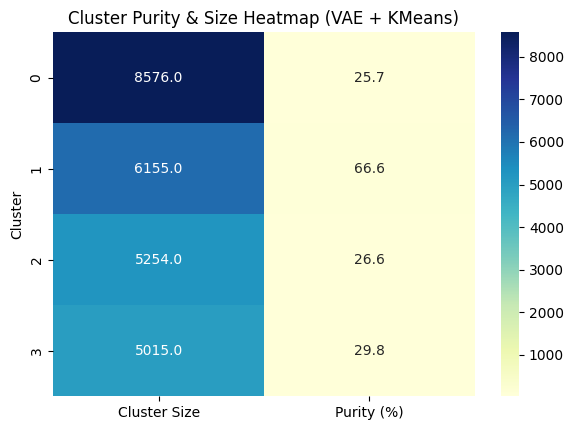


Cluster Purity & Size (VAE + KMeans):
         Cluster Size  Purity (%)
Cluster                          
0                8576   25.652985
1                6155   66.580016
2                5254   26.627332
3                5015   29.830508


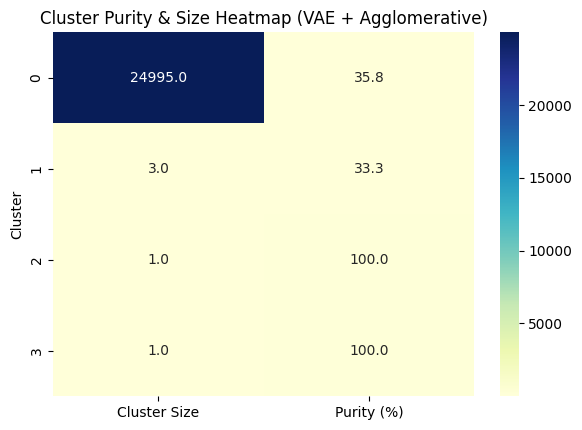


Cluster Purity & Size (VAE + Agglomerative):
         Cluster Size  Purity (%)
Cluster                          
0               24995   35.847169
1                   3   33.333333
2                   1  100.000000
3                   1  100.000000


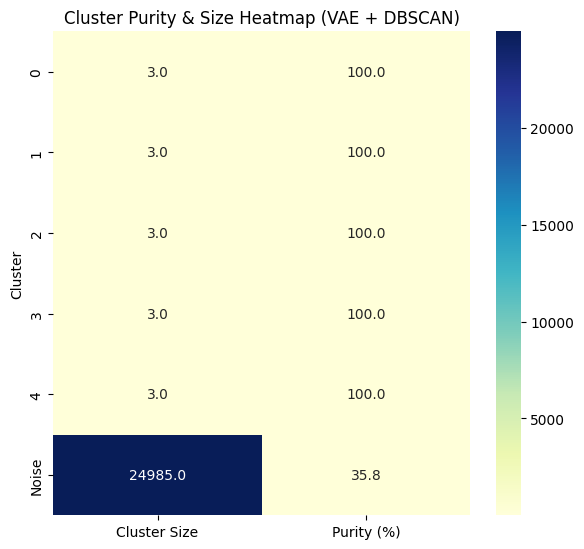


Cluster Purity & Size (VAE + DBSCAN):
         Cluster Size  Purity (%)
Cluster                          
0                   3  100.000000
1                   3  100.000000
2                   3  100.000000
3                   3  100.000000
4                   3  100.000000
Noise           24985   35.813488


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def cluster_purity_heatmap(clusters, true_labels, method_name="Clustering"):

    # Convert clusters to string to handle DBSCAN noise (-1)
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Create DataFrame
    df = pd.DataFrame({"Cluster": clusters_str, "Label": true_labels})
    
    # Cluster size
    cluster_size = df.groupby("Cluster").size()
    
    # Purity per cluster (% of majority class)
    cluster_purity = df.groupby("Cluster")['Label'].apply(lambda x: x.value_counts().max() / len(x) * 100)
    
    # Combine into one DataFrame
    metrics_df = pd.DataFrame({
        "Cluster Size": cluster_size,
        "Purity (%)": cluster_purity
    }).sort_index()
    
    # Plot heatmap
    plt.figure(figsize=(6, len(metrics_df)*0.6 + 2))
    sns.heatmap(metrics_df, annot=True, fmt=".1f", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster Purity & Size Heatmap ({method_name})")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Purity & Size ({method_name}):")
    print(metrics_df)

# Compute purity for each method
for method, labels in cluster_results.items():
    cluster_purity_heatmap(labels, true_labels, method_name=f"VAE + {method}")

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


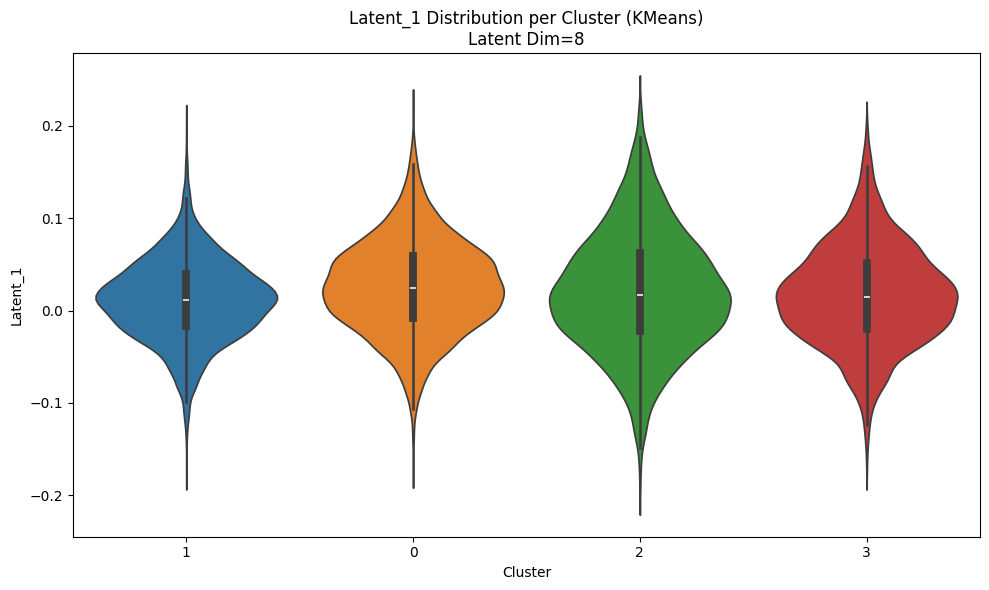

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


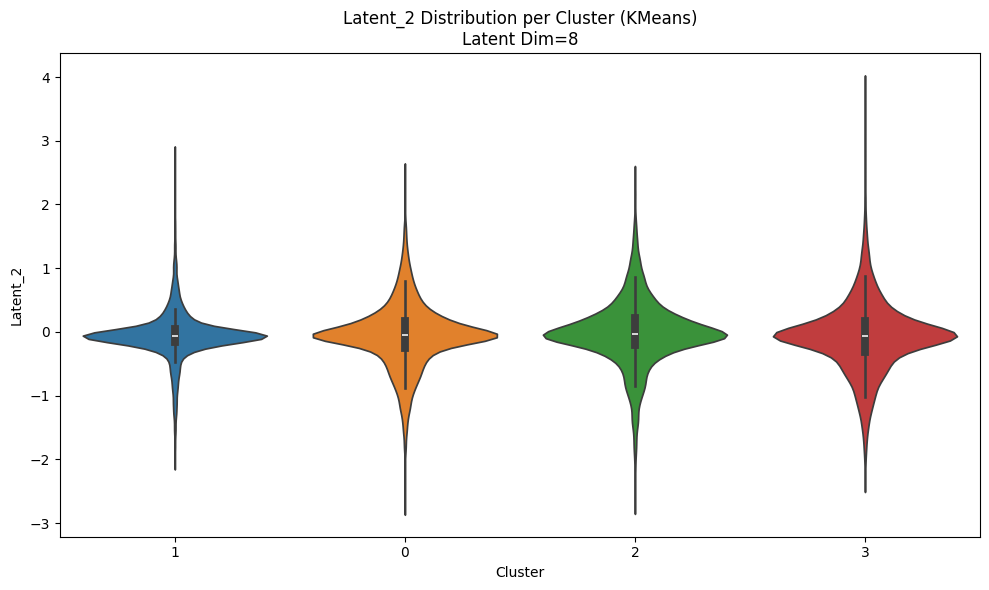

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


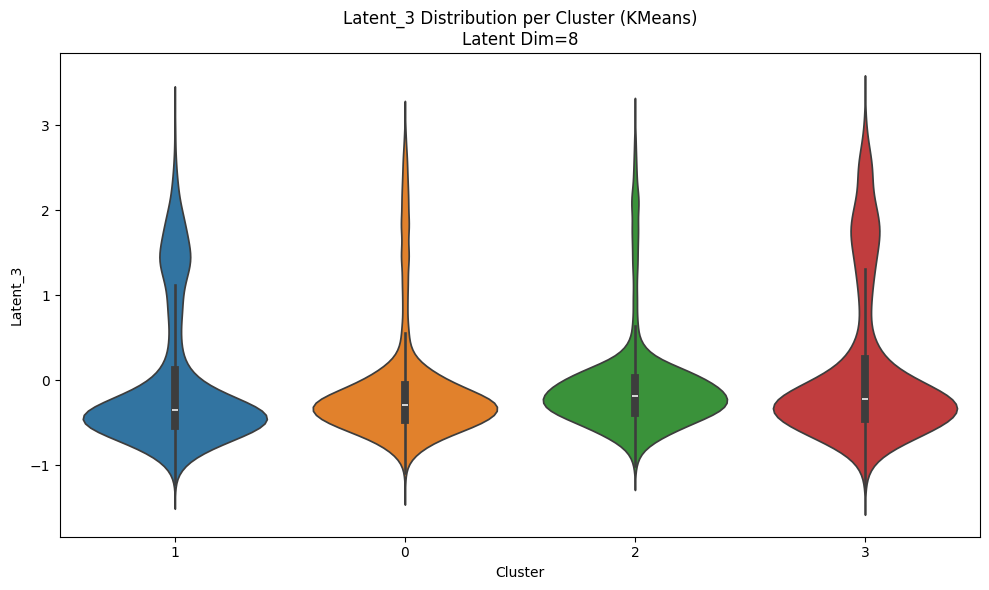

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


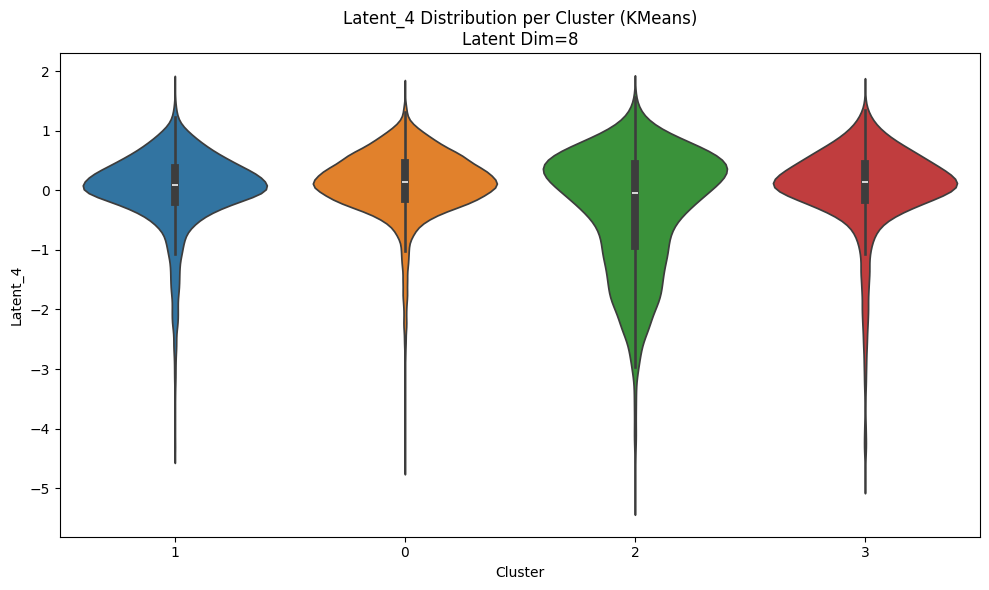

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


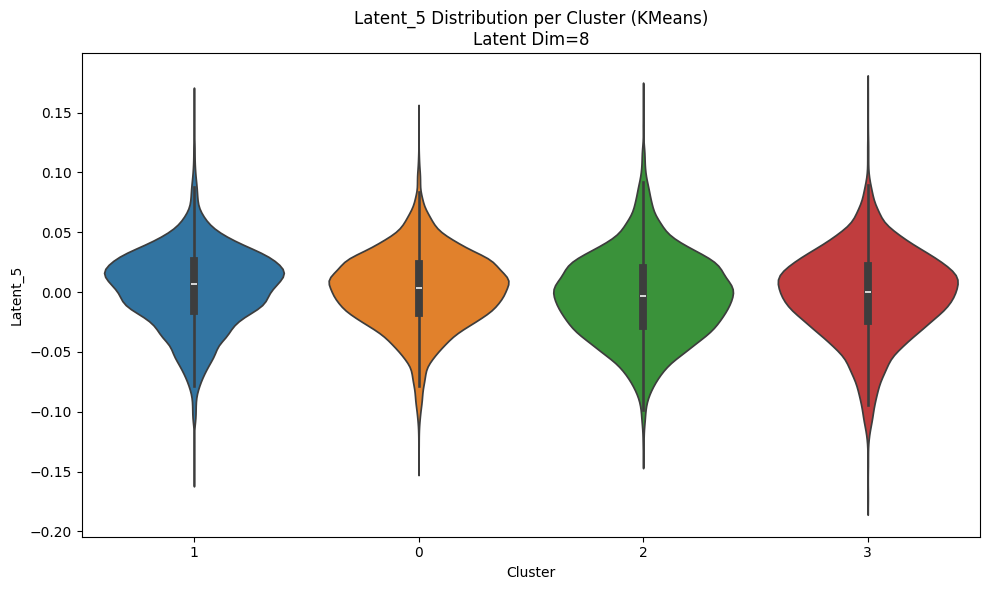

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


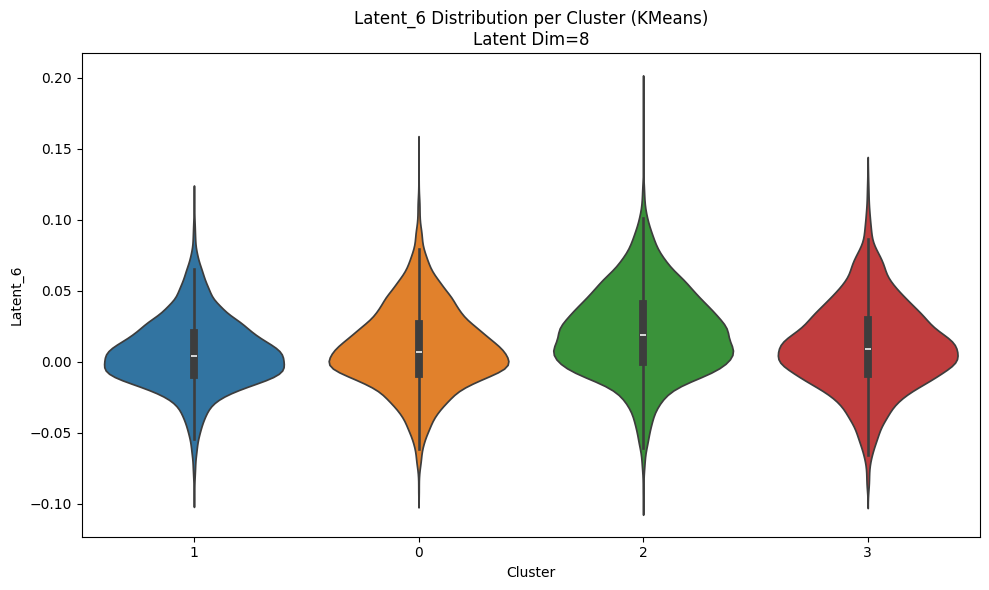

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


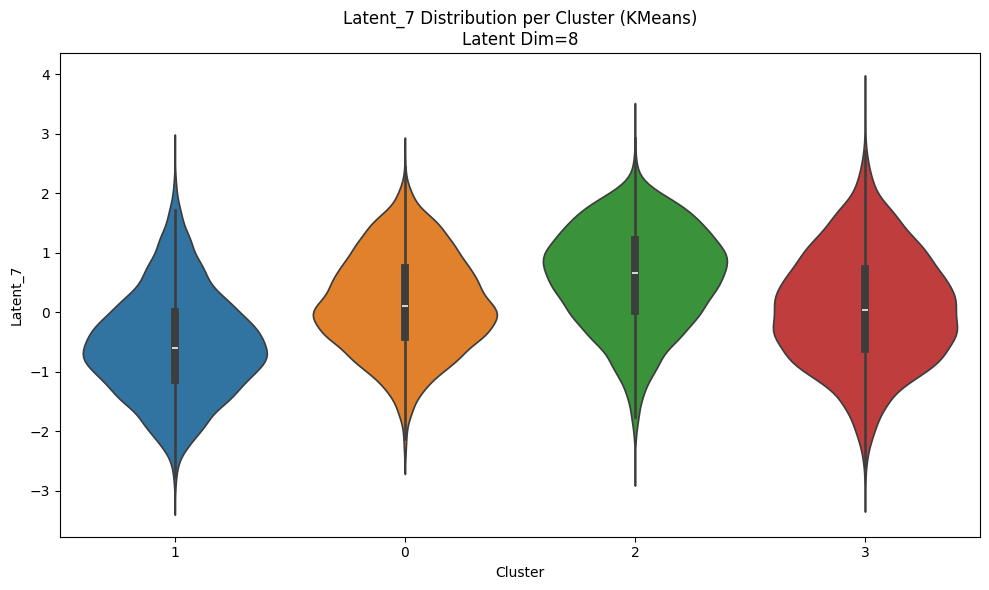

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


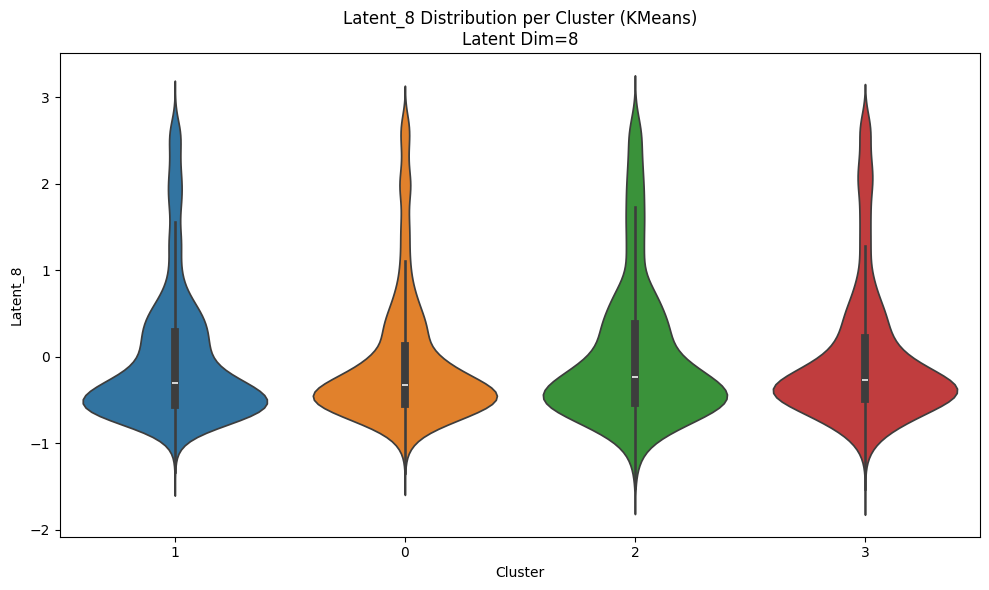

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


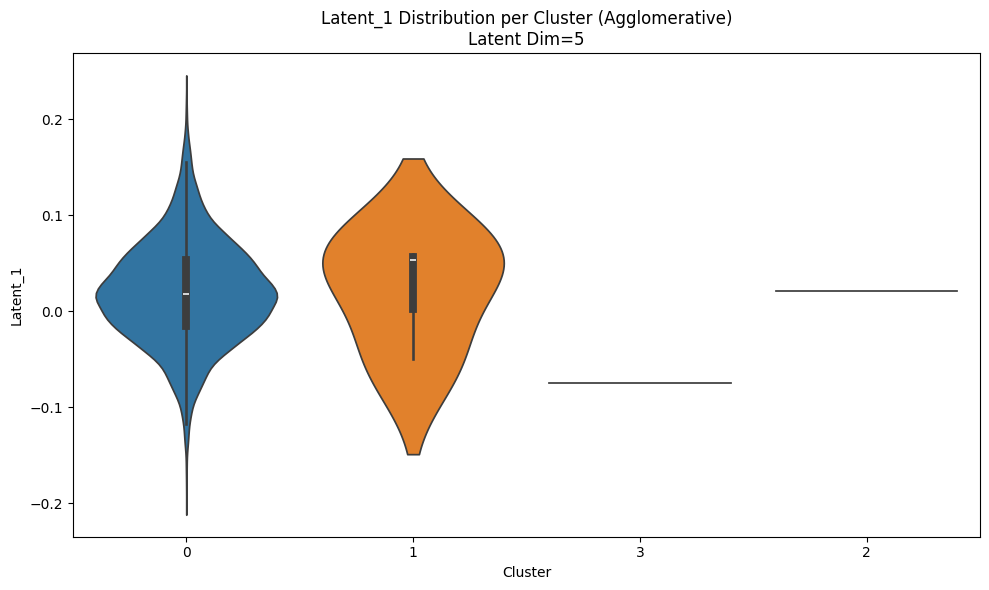

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


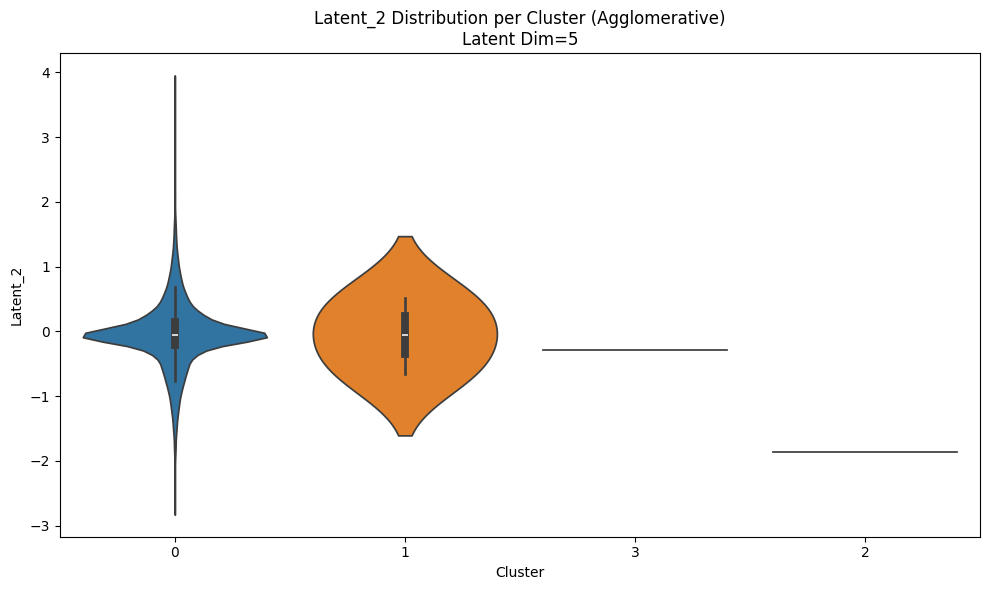

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


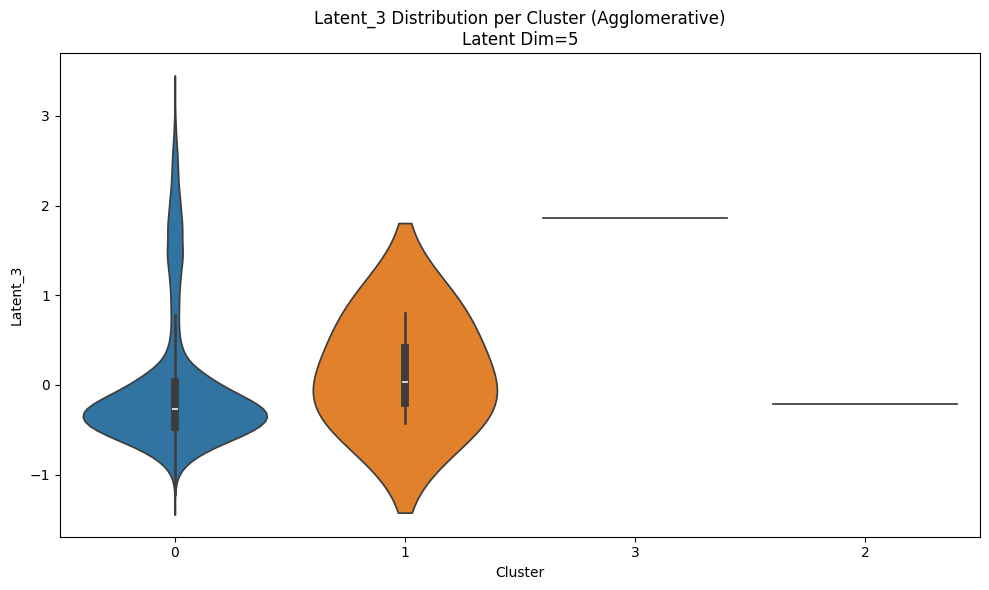

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


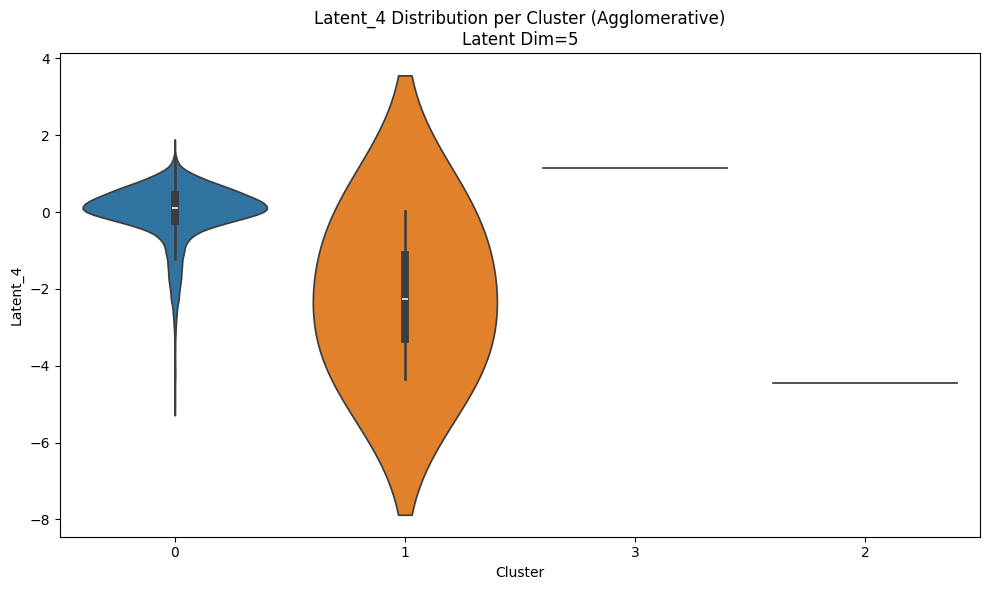

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


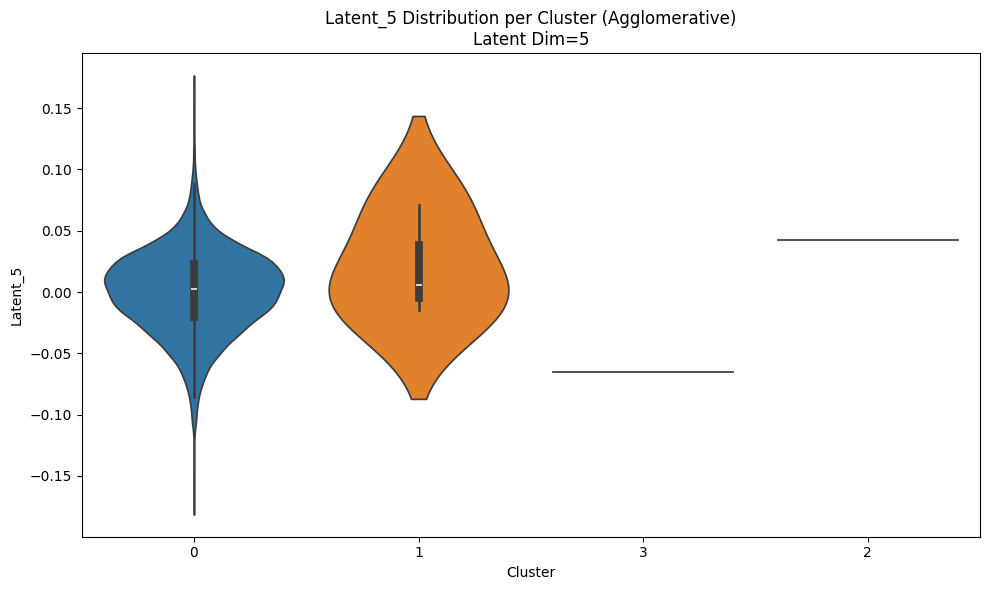

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


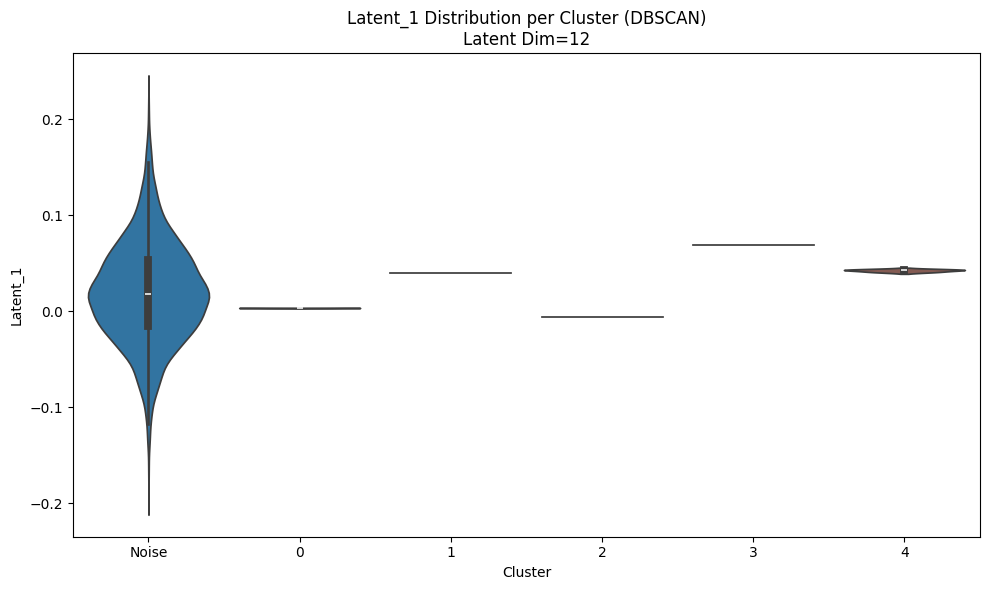

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


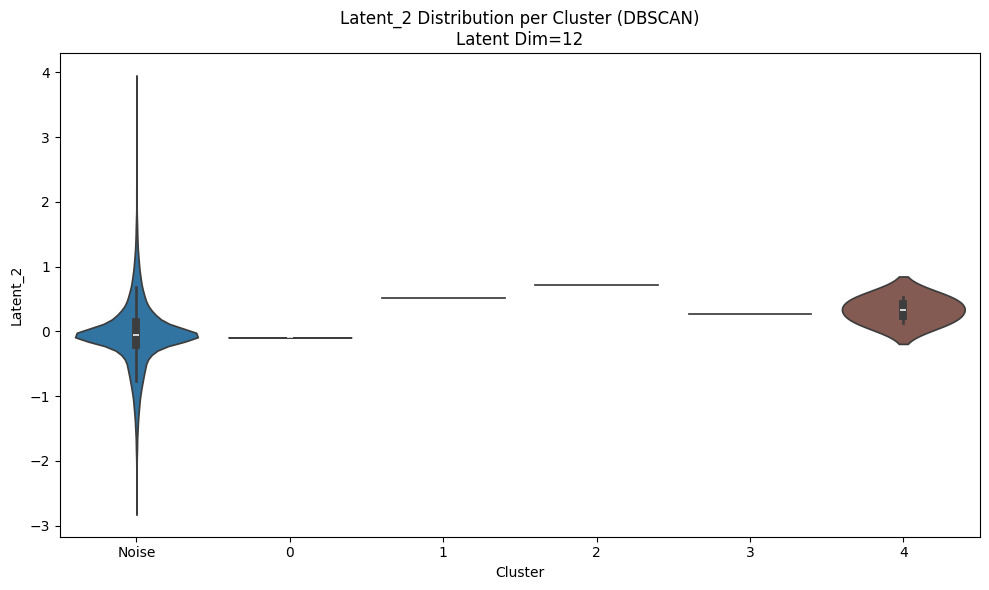

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


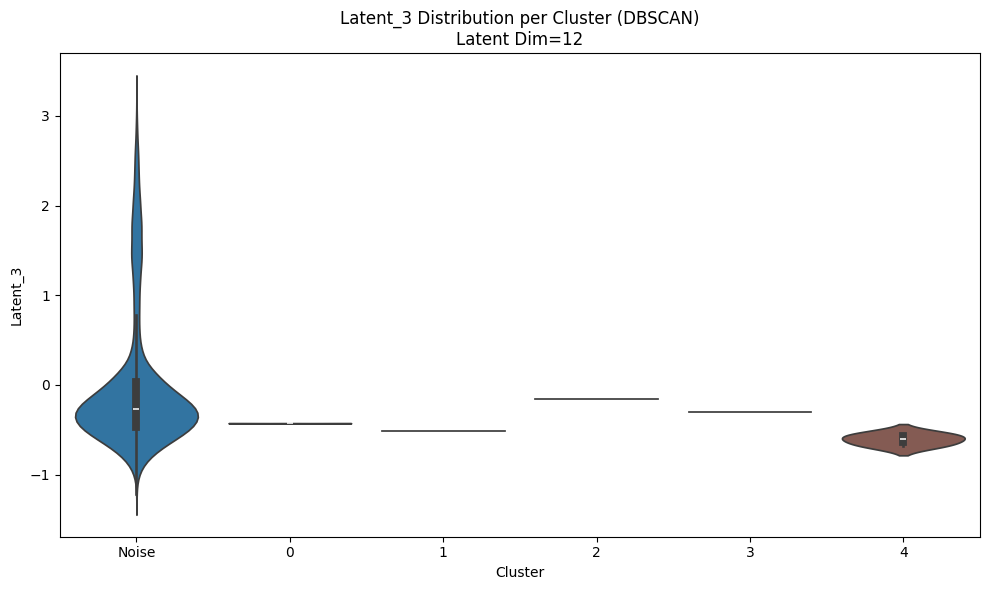

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


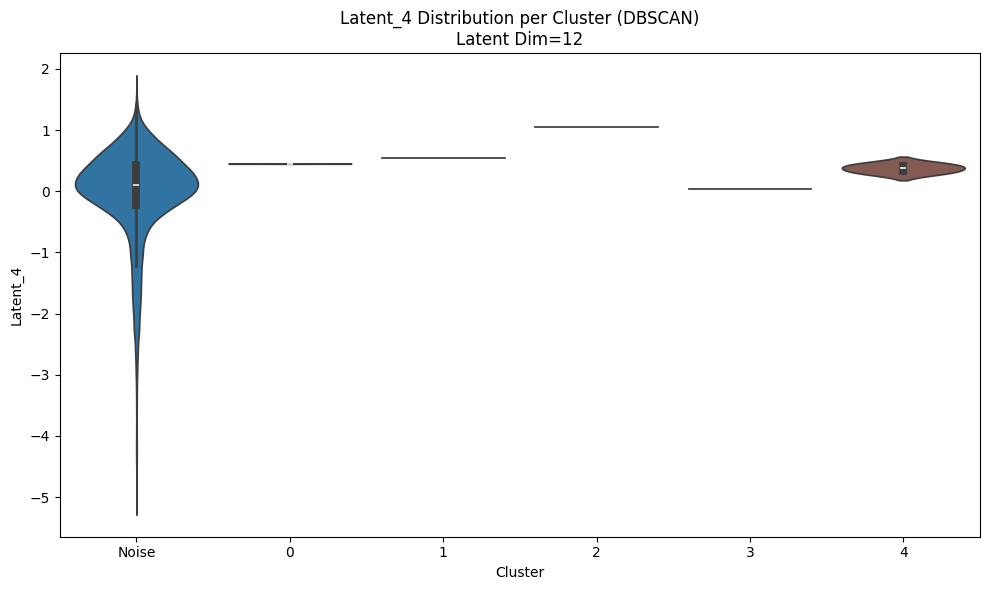

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


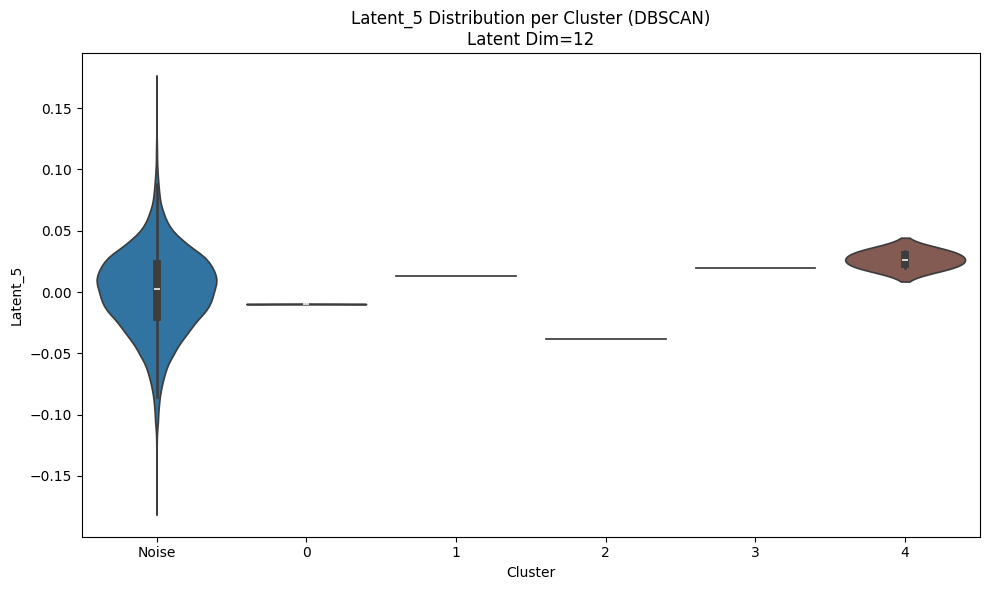

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


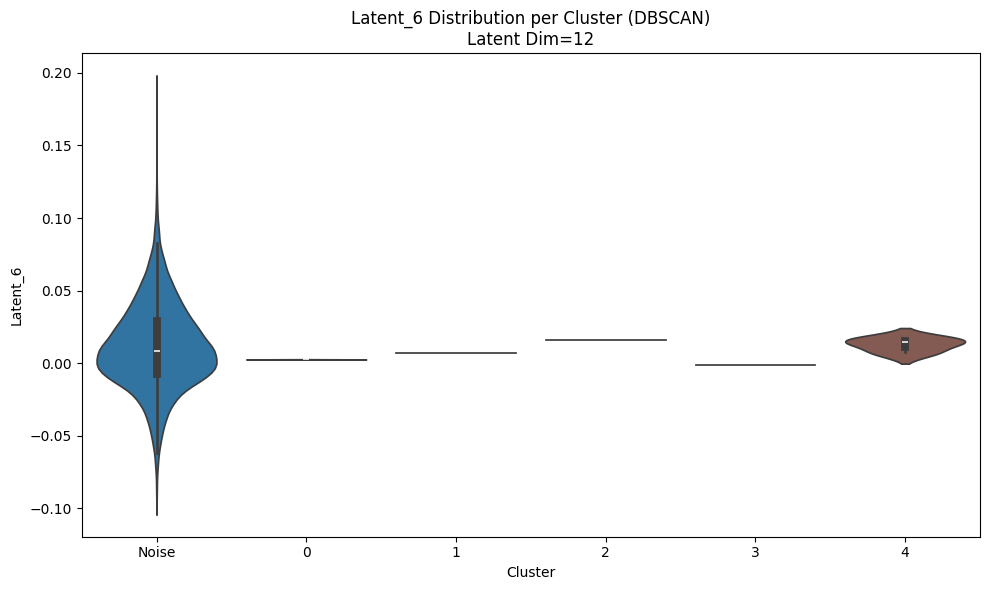

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


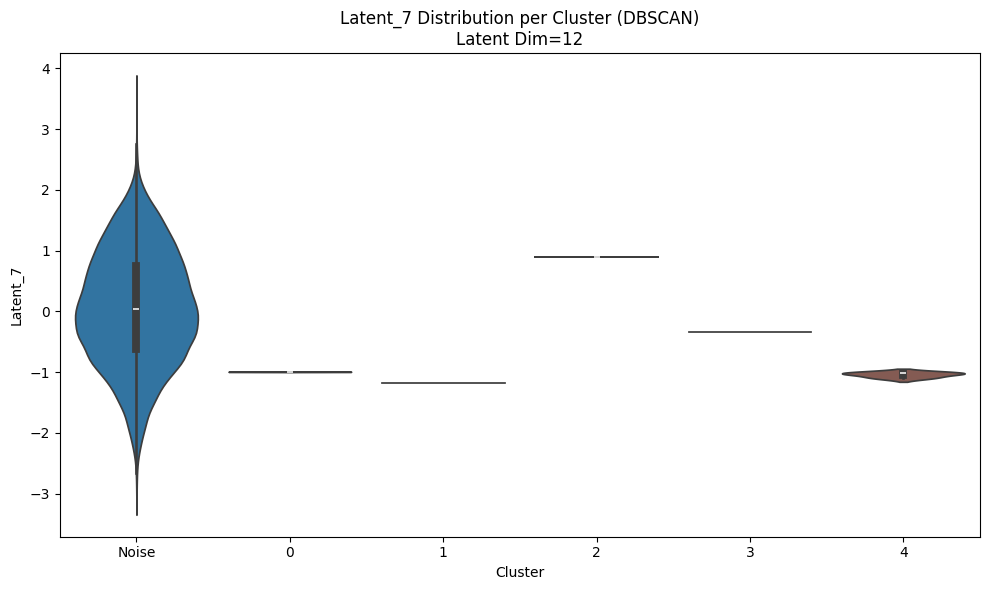

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


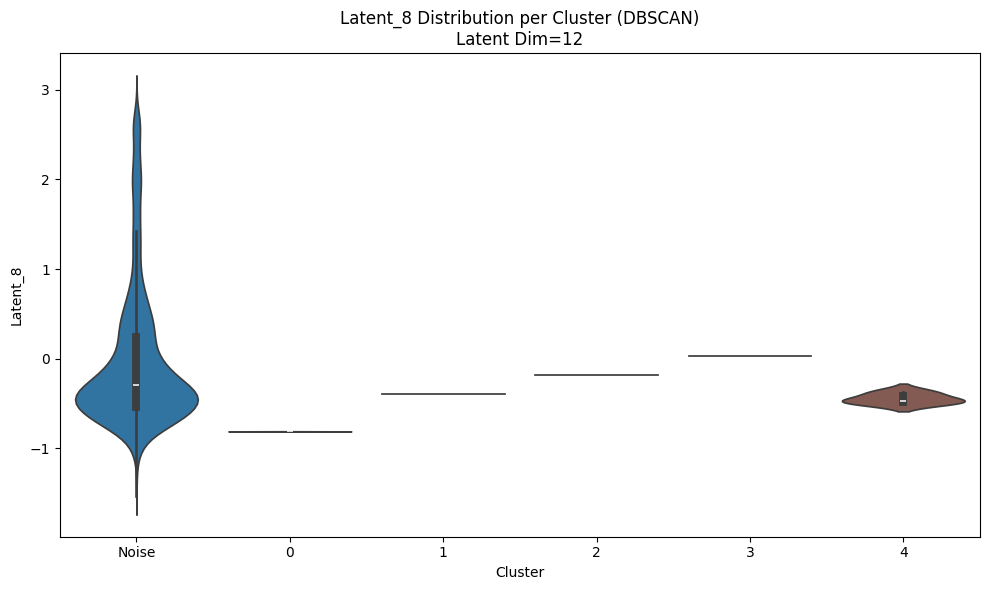

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


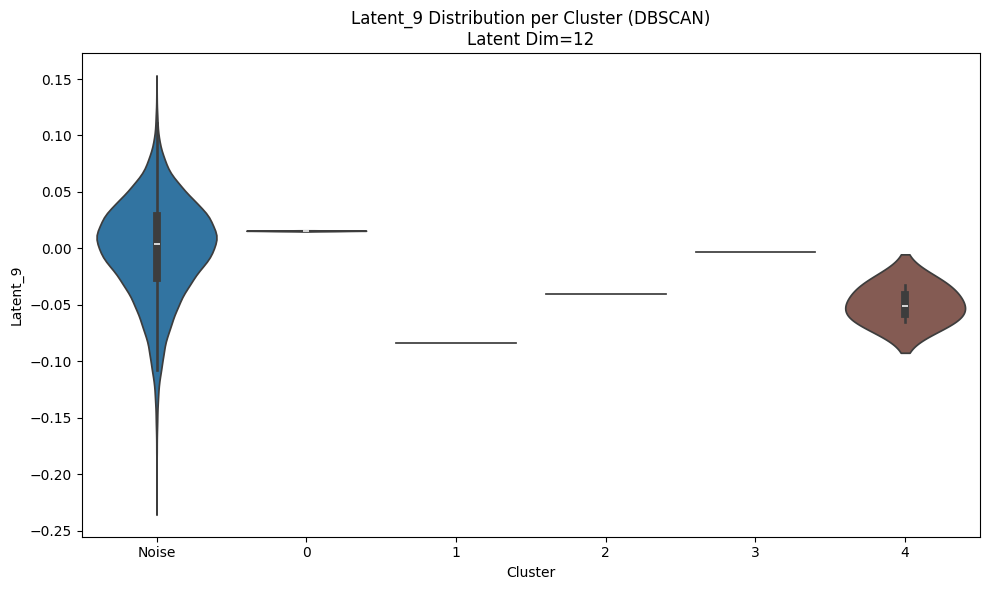

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


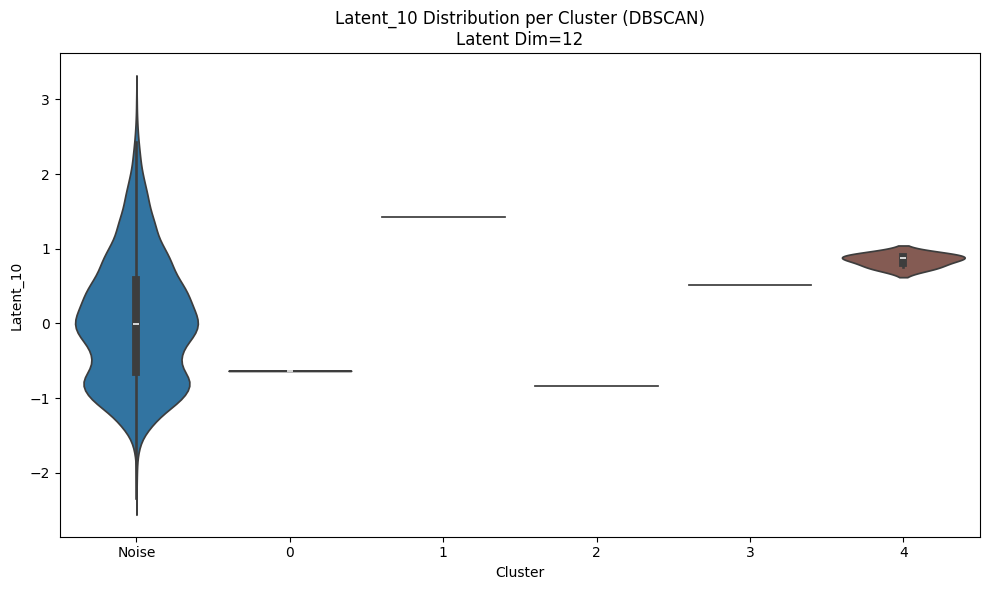

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


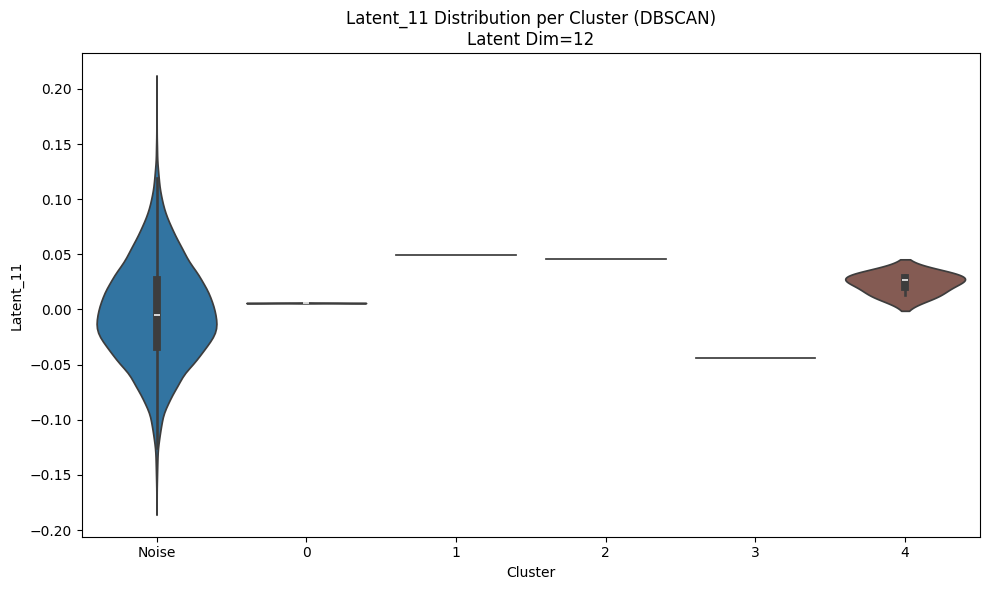

/tmp/ipykernel_55/3854878569.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")


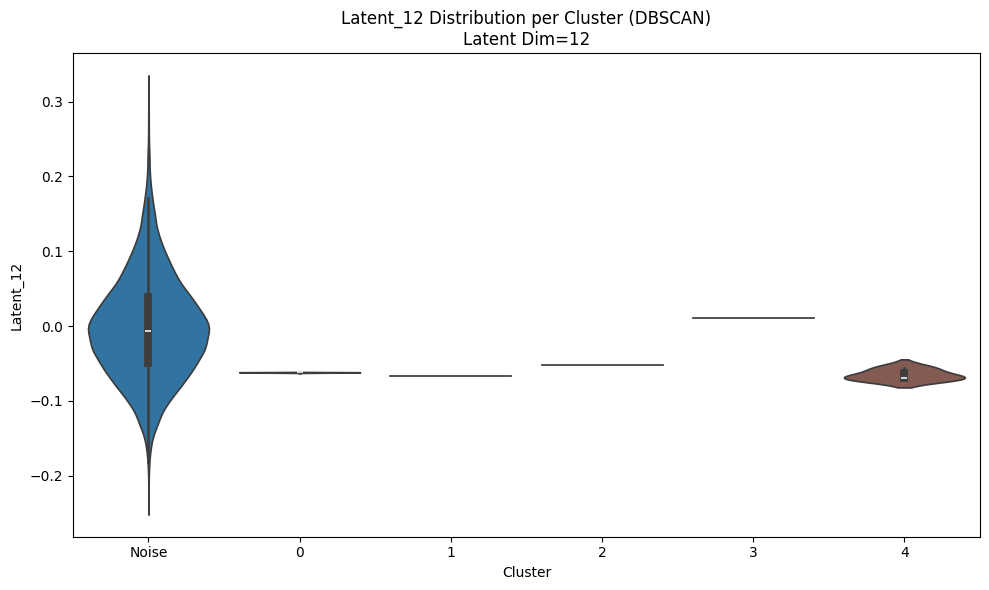

In [ ]:
def plot_violin_features_best_clusters(z_audio, best_results, cluster_results):
   
    for method_name, config in best_results.items():
        if config is None or "latent_dim" not in config:
            print(f"No valid config for {method_name}")
            continue

        best_ld = config["latent_dim"]
        labels = cluster_results[method_name]

        # Slice z_audio to the best latent dimension
        z_method = z_audio[:, :best_ld]

        # Convert clusters to string (handle DBSCAN noise)
        clusters_str = np.array([str(c) if c != -1 else "Noise" for c in labels])

        # Convert latent features to DataFrame
        latent_df = pd.DataFrame(z_method, columns=[f"Latent_{i+1}" for i in range(z_method.shape[1])])
        latent_df["Cluster"] = clusters_str

        # Plot each latent dimension
        for feat in latent_df.columns[:-1]:  
            plt.figure(figsize=(10,6))
            sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")
            plt.title(f"{feat} Distribution per Cluster ({method_name})\nLatent Dim={best_ld}")
            plt.xlabel("Cluster")
            plt.ylabel(feat)
            plt.tight_layout()
            plt.show()

# Apply the function
plot_violin_features_best_clusters(z_audio, best_results, cluster_results)

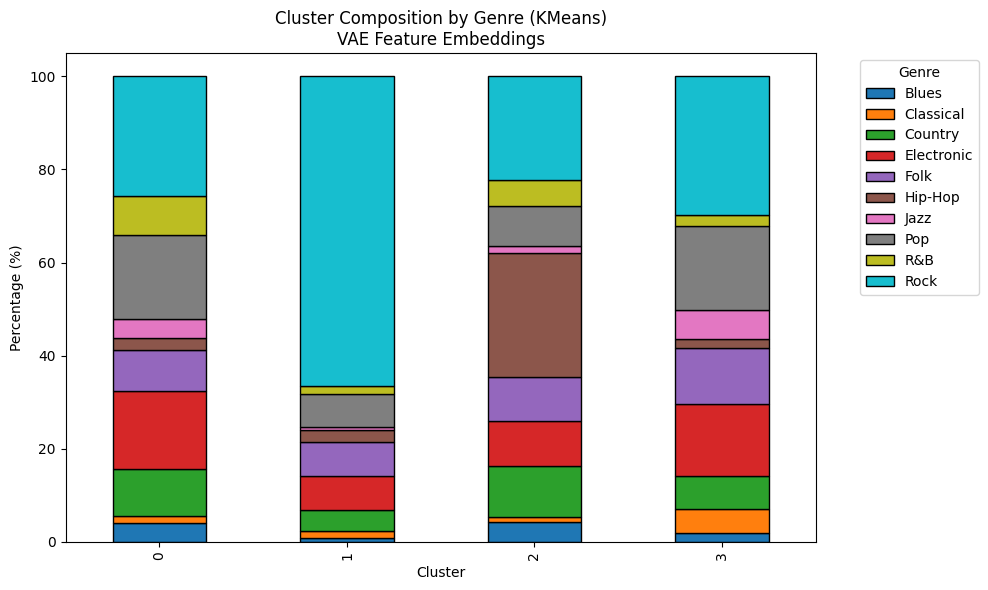


Cluster Composition Counts (KMeans):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          351        132      852        1441   754      220   348  1559   
1           56         93      271         454   452      159    32   437   
2          229         55      576         509   489     1399    87   452   
3           99        254      359         777   604       88   317   907   

Genre    R&B  Rock  
Cluster             
0        719  2200  
1        103  4098  
2        292  1166  
3        114  1496  

Cluster Composition Percentages (KMeans):
Genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
Cluster                                                                     
0        4.092817   1.539179   9.934701   16.802705   8.791978   2.565299   
1        0.909829   1.510967   4.402924    7.376117   7.343623   2.583266   
2        4.358584   1.

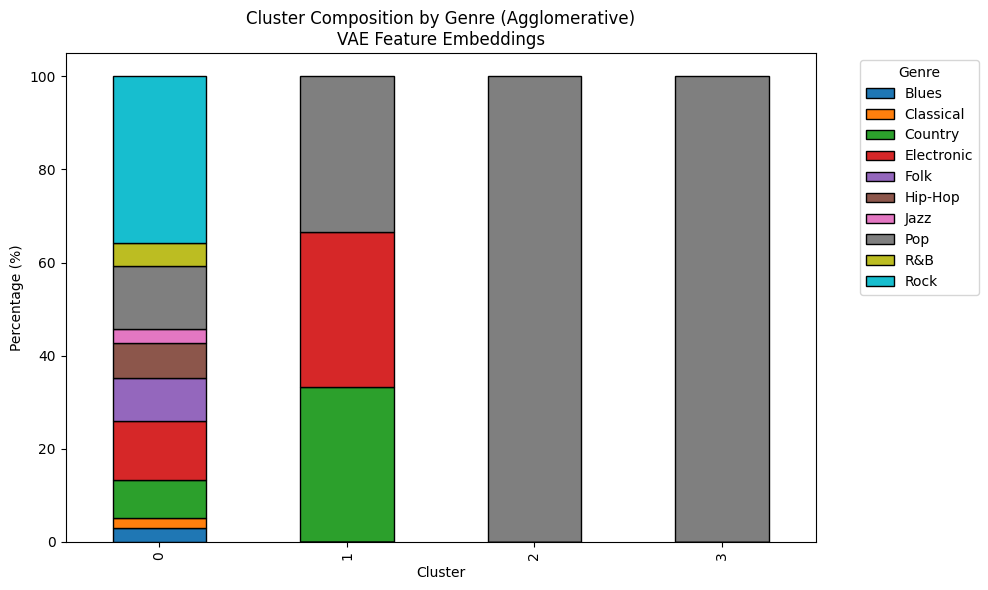


Cluster Composition Counts (Agglomerative):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          735        534     2057        3180  2299     1866   784  3352   
1            0          0        1           1     0        0     0     1   
2            0          0        0           0     0        0     0     1   
3            0          0        0           0     0        0     0     1   

Genre     R&B  Rock  
Cluster              
0        1228  8960  
1           0     0  
2           0     0  
3           0     0  

Cluster Composition Percentages (Agglomerative):
Genre       Blues  Classical    Country  Electronic     Folk   Hip-Hop  \
Cluster                                                                  
0        2.940588   2.136427   8.229646   12.722545  9.19784  7.465493   
1        0.000000   0.000000  33.333333   33.333333  0.00000  0.000000   
2        0.000

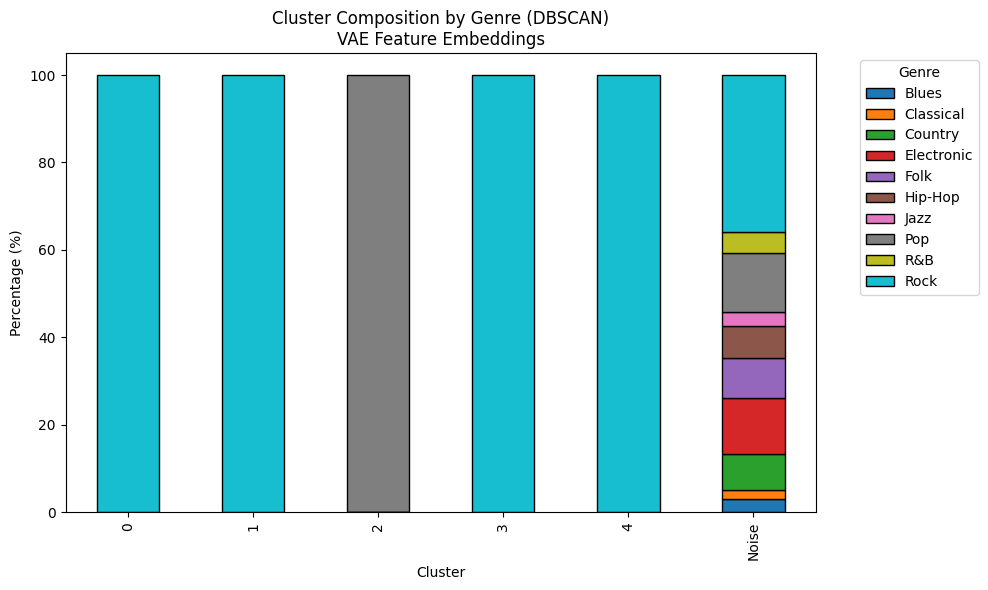


Cluster Composition Counts (DBSCAN):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0            0          0        0           0     0        0     0     0   
1            0          0        0           0     0        0     0     0   
2            0          0        0           0     0        0     0     3   
3            0          0        0           0     0        0     0     0   
4            0          0        0           0     0        0     0     0   
Noise      735        534     2058        3181  2299     1866   784  3352   

Genre     R&B  Rock  
Cluster              
0           0     3  
1           0     3  
2           0     0  
3           0     3  
4           0     3  
Noise    1228  8948  

Cluster Composition Percentages (DBSCAN):
Genre       Blues  Classical   Country  Electronic      Folk   Hip-Hop  \
Cluster                                             

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def cluster_composition_best_hyperparams(cluster_results, best_results, true_labels, le=None):
    
    for method_name, labels in cluster_results.items():
        config = best_results.get(method_name, None)
        if config is None or "latent_dim" not in config:
            print(f"No valid config for {method_name}, skipping.")
            continue
        
        # Convert clusters to string for consistent labeling
        clusters_str = np.array([str(c) if c != -1 else "Noise" for c in labels])
        
        # Map true labels to genre names if LabelEncoder is provided
        if le is not None:
            genres = le.inverse_transform(true_labels)
        else:
            genres = true_labels
        
        # Create DataFrame
        df_clusters = pd.DataFrame({
            "Genre": genres,
            "Cluster": clusters_str
        })
        
        # Compute counts per cluster
        cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
        
        # Compute percentages
        cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

        # Plot stacked bar chart
        cluster_percent.plot(kind='bar', stacked=True, figsize=(10,6),
                             colormap='tab10', edgecolor='black')
        plt.title(f"Cluster Composition by Genre ({method_name})\nVAE Feature Embeddings")
        plt.ylabel("Percentage (%)")
        plt.xlabel("Cluster")
        plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

        # Print tables
        print(f"\nCluster Composition Counts ({method_name}):")
        print(cluster_counts)
        print(f"\nCluster Composition Percentages ({method_name}):")
        print(cluster_percent)

# Apply to the best hyperparameter clusters
cluster_composition_best_hyperparams(cluster_results, best_results, true_labels, le=le)

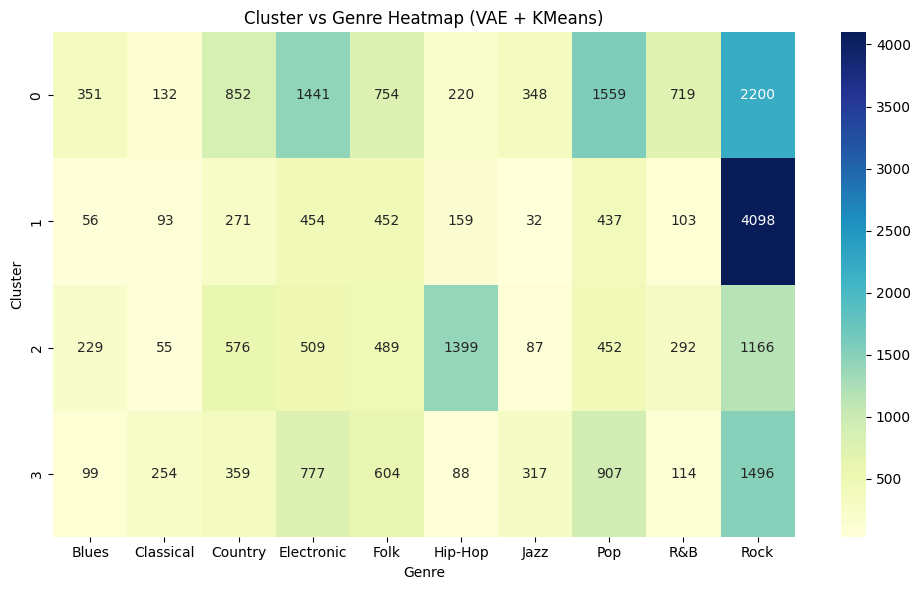


Cluster vs Genre Counts (VAE + KMeans):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          351        132      852        1441   754      220   348  1559   
1           56         93      271         454   452      159    32   437   
2          229         55      576         509   489     1399    87   452   
3           99        254      359         777   604       88   317   907   

Genre    R&B  Rock  
Cluster             
0        719  2200  
1        103  4098  
2        292  1166  
3        114  1496  


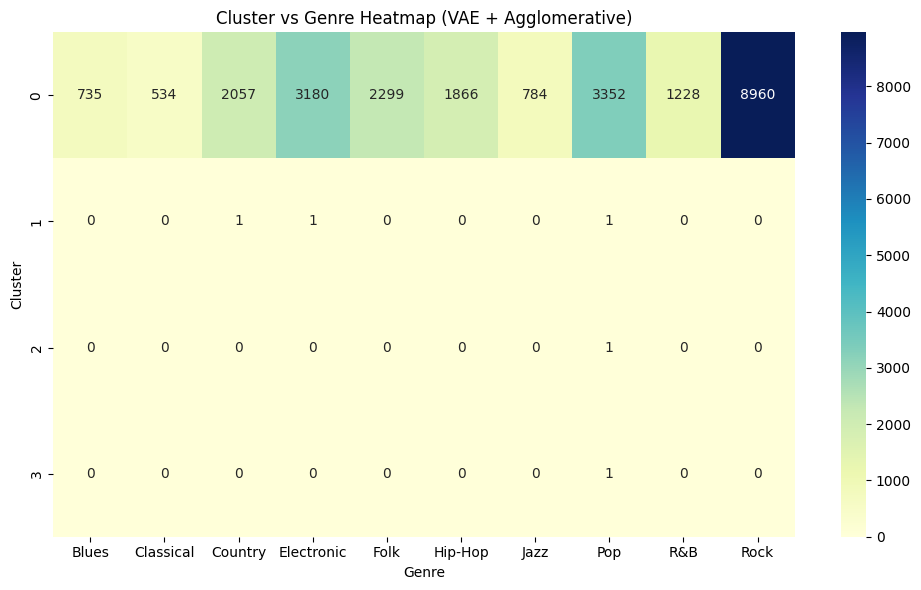


Cluster vs Genre Counts (VAE + Agglomerative):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          735        534     2057        3180  2299     1866   784  3352   
1            0          0        1           1     0        0     0     1   
2            0          0        0           0     0        0     0     1   
3            0          0        0           0     0        0     0     1   

Genre     R&B  Rock  
Cluster              
0        1228  8960  
1           0     0  
2           0     0  
3           0     0  


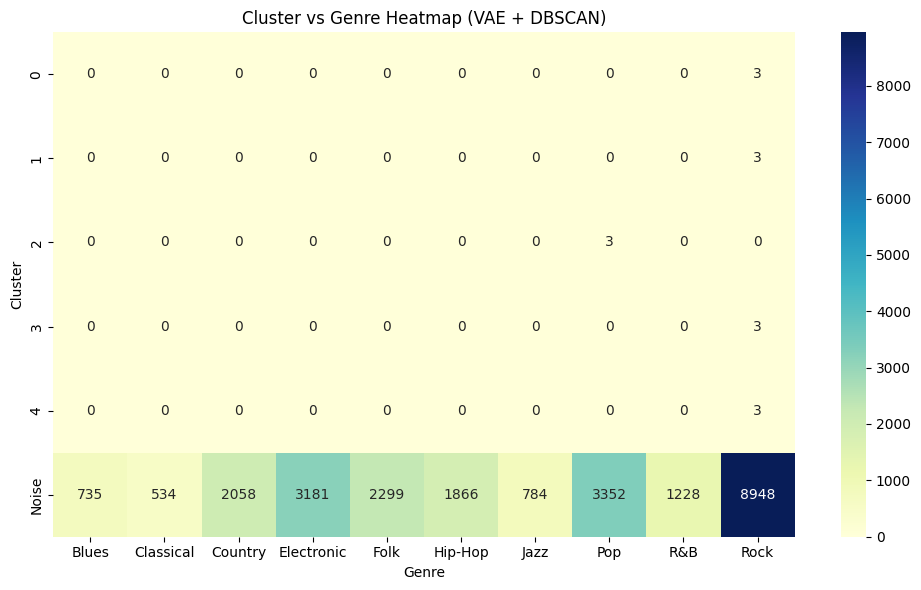


Cluster vs Genre Counts (VAE + DBSCAN):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0            0          0        0           0     0        0     0     0   
1            0          0        0           0     0        0     0     0   
2            0          0        0           0     0        0     0     3   
3            0          0        0           0     0        0     0     0   
4            0          0        0           0     0        0     0     0   
Noise      735        534     2058        3181  2299     1866   784  3352   

Genre     R&B  Rock  
Cluster              
0           0     3  
1           0     3  
2           0     0  
3           0     3  
4           0     3  
Noise    1228  8948  


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def cluster_heatmap_best_hyperparams(cluster_results, best_results, true_labels, le=None):
    
    for method_name, labels in cluster_results.items():
        config = best_results.get(method_name, None)
        if config is None or "latent_dim" not in config:
            print(f"No valid config for {method_name}, skipping.")
            continue
        
        # Convert clusters to string (handle DBSCAN noise)
        clusters_str = np.array([str(c) if c != -1 else "Noise" for c in labels])
        
        # Map true labels to genre names if LabelEncoder provided
        if le is not None:
            genres = le.inverse_transform(true_labels)
        else:
            genres = true_labels
        
        # Create DataFrame
        df = pd.DataFrame({
            "Cluster": clusters_str,
            "Genre": genres
        })
        
        # Crosstab: cluster vs genre counts
        ct = pd.crosstab(df['Cluster'], df['Genre'])
        
        # Plot heatmap
        plt.figure(figsize=(10,6))
        sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu", cbar=True)
        plt.title(f"Cluster vs Genre Heatmap (VAE + {method_name})")
        plt.ylabel("Cluster")
        plt.xlabel("Genre")
        plt.tight_layout()
        plt.show()
        
        print(f"\nCluster vs Genre Counts (VAE + {method_name}):")
        print(ct)

# Apply to the best hyperparameter clusters
cluster_heatmap_best_hyperparams(cluster_results, best_results, true_labels, le=le)

In [24]:
# Baseline: raw audio features (scaled)
scaler = StandardScaler()
X_audio_scaled = scaler.fit_transform(X_audio.reshape(X_audio.shape[0], -1))  # flatten if needed
pca = PCA(n_components=6, random_state=42)   
X_audio_pca = pca.fit_transform(X_audio_scaled)

# Scale lyrics embeddings
scaler = StandardScaler()
X_lyrics_scaled = scaler.fit_transform(X_lyrics)  # X_lyrics = lyrics embeddings
pca = PCA(n_components=10, random_state=42)
X_lyrics_pca = pca.fit_transform(X_lyrics_scaled)

In [44]:
# Baseline hybrid (audio+lyrics)
# Concatenate (Hybrid Feature)
X_hybrid = np.concatenate([X_audio_scaled, X_lyrics_scaled], axis=1)

# PCA (Important to reduce dimensionality)
pca = PCA(n_components=50, random_state=42)  
X_hybrid_baseline_pca = pca.fit_transform(X_hybrid)

print("Hybrid Explained Variance:", np.sum(pca.explained_variance_ratio_))

results_hybrid_baseline = {}

# KMeans
results_hybrid_baseline["KMeans"] = KMeans(
    n_clusters=4,
    n_init=10,
    random_state=42
).fit_predict(X_hybrid)

# Agglomerative
results_hybrid_baseline["Agglomerative"] = AgglomerativeClustering(
    n_clusters=4,
    linkage= 'average'
).fit_predict(X_hybrid)

# DBSCAN
results_hybrid_baseline["DBSCAN"] = DBSCAN(
    eps=1.5,
    min_samples=3
).fit_predict(X_hybrid_baseline_pca) # DBSCAN requires lower dimension, so use PCA

# Evaluation
for name, labels in results_hybrid_baseline.items():

    if name == "DBSCAN":
        mask = labels != -1
        n_clusters_alg = len(np.unique(labels[mask]))

        if np.sum(mask) > 1 and n_clusters_alg > 1:
            sil = silhouette_score(X_hybrid_baseline_pca[mask], labels[mask])
            dbi = davies_bouldin_score(X_hybrid_baseline_pca[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0

    else:
        n_clusters_alg = len(np.unique(labels))

        if n_clusters_alg > 1:
            sil = silhouette_score(X_hybrid_baseline_pca, labels)
            dbi = davies_bouldin_score(X_hybrid_baseline_pca, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"\nBaseline (Audio + Lyrics Raw Hybrid) - {name}")
    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")

Hybrid Explained Variance: 0.5394575236283863

Baseline (Audio + Lyrics Raw Hybrid) - KMeans
Silhouette Score: 0.059320
Davies-Bouldin Index: 3.549199
Adjusted Rand Index: 0.062948

Baseline (Audio + Lyrics Raw Hybrid) - Agglomerative
Silhouette Score: 0.074096
Davies-Bouldin Index: 1.316403
Adjusted Rand Index: -0.000022

Baseline (Audio + Lyrics Raw Hybrid) - DBSCAN
Silhouette Score: 0.968547
Davies-Bouldin Index: 0.050372
Adjusted Rand Index: 0.176525


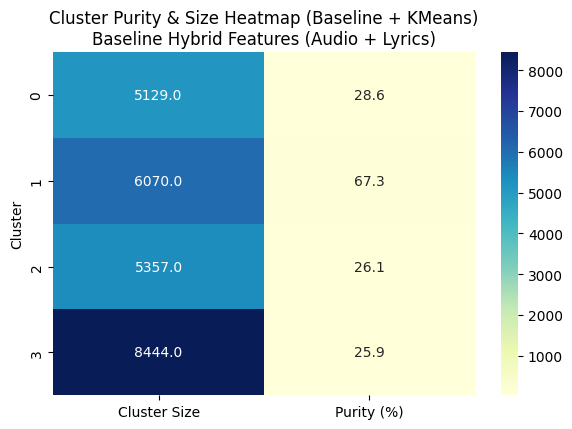


Cluster Purity & Size (Baseline + KMeans):
         Cluster Size  Purity (%)
Cluster                          
0                5129   28.563073
1                6070   67.265239
2                5357   26.096696
3                8444   25.888205


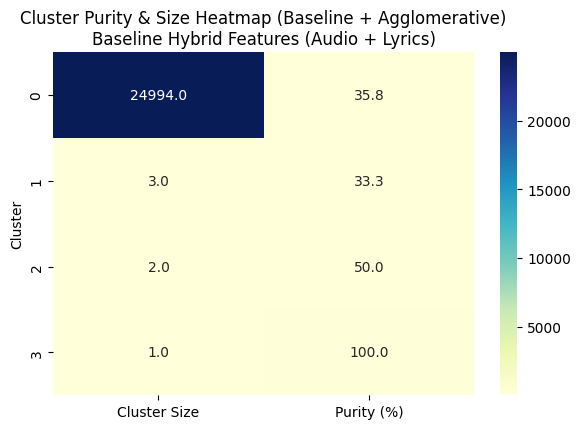


Cluster Purity & Size (Baseline + Agglomerative):
         Cluster Size  Purity (%)
Cluster                          
0               24994   35.840602
1                   3   33.333333
2                   2   50.000000
3                   1  100.000000


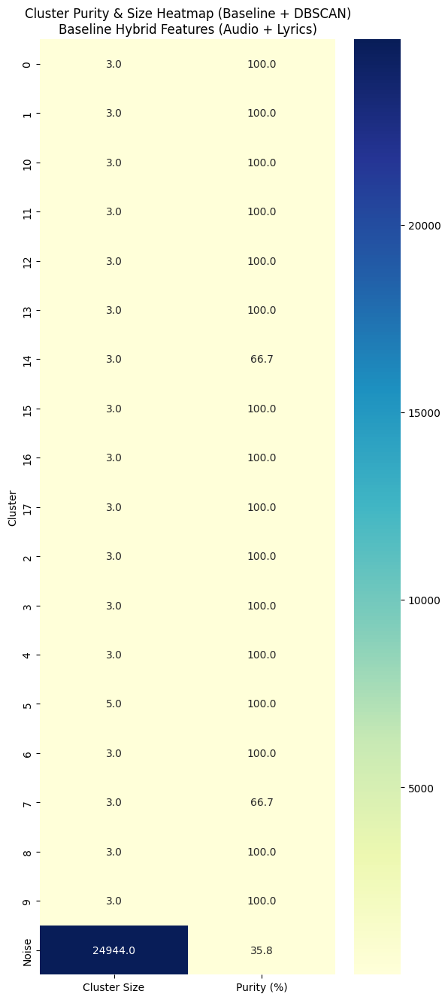


Cluster Purity & Size (Baseline + DBSCAN):
         Cluster Size  Purity (%)
Cluster                          
0                   3  100.000000
1                   3  100.000000
10                  3  100.000000
11                  3  100.000000
12                  3  100.000000
13                  3  100.000000
14                  3   66.666667
15                  3  100.000000
16                  3  100.000000
17                  3  100.000000
2                   3  100.000000
3                   3  100.000000
4                   3  100.000000
5                   5  100.000000
6                   3  100.000000
7                   3   66.666667
8                   3  100.000000
9                   3  100.000000
Noise           24944   35.824246


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples

def cluster_purity_baseline(X, clusters, true_labels, method_name="KMeans", le=None):
    # Handle DBSCAN noise
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true_labels to genre names
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels

    df = pd.DataFrame({"Cluster": clusters_str, "Genre": genres})
    
    # Cluster size                                                                  
    cluster_size = df.groupby("Cluster").size()
    
    # Purity per cluster (% of majority class)
    cluster_purity = df.groupby("Cluster")['Label'].apply(lambda x: x.value_counts().max() / len(x) * 100)
    
    # Combine metrics in one DataFrame
    metrics_df = pd.DataFrame({
        "Cluster Size": cluster_size,
        "Purity (%)": cluster_purity
    }).sort_index()
    
    # Plot heatmap
    plt.figure(figsize=(6, len(metrics_df)*0.6 + 2))
    sns.heatmap(metrics_df, annot=True, fmt=".1f", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster Purity & Size Heatmap ({method_name})\nBaseline Hybrid Features (Audio + Lyrics)")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Purity & Size ({method_name}):")
    print(metrics_df)


# Apply to all baseline hybrid clustering results 
for name, labels in results_hybrid_baseline.items():  # results_true = baseline clustering (KMeans, Agg, DBSCAN)
    cluster_purity_baseline(X_hybrid, labels, true_labels, method_name=f"Baseline + {name}", le=le)

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


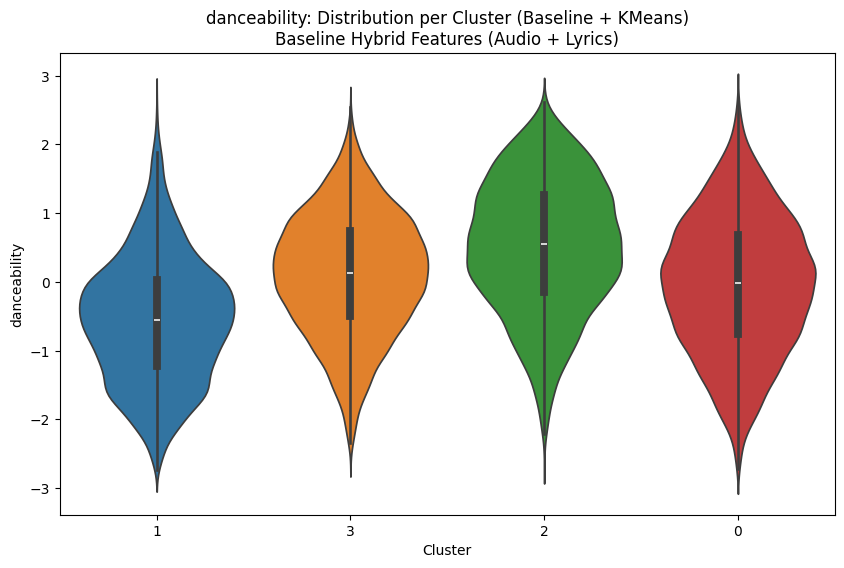

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


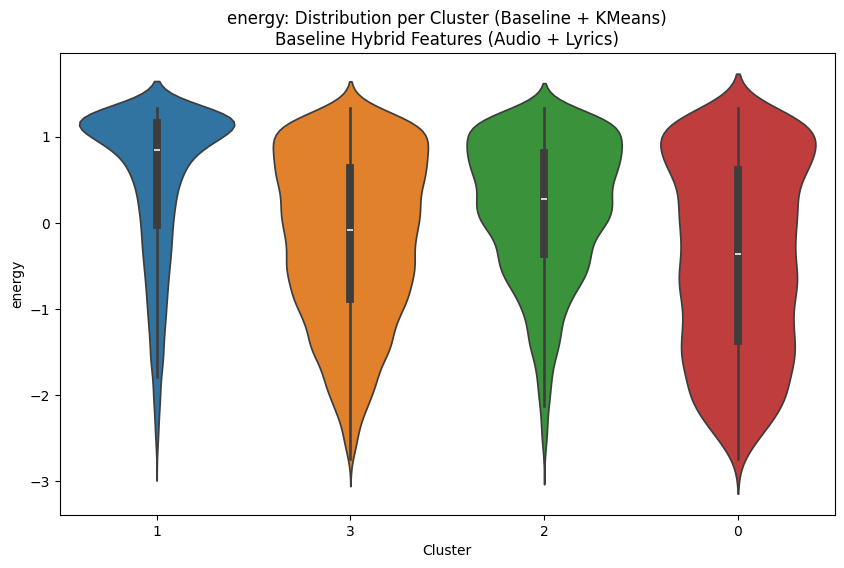

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


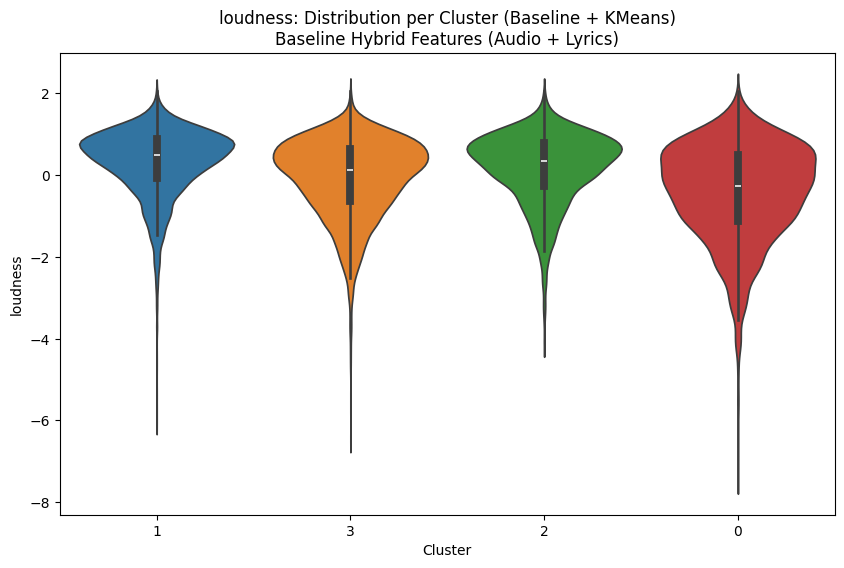

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


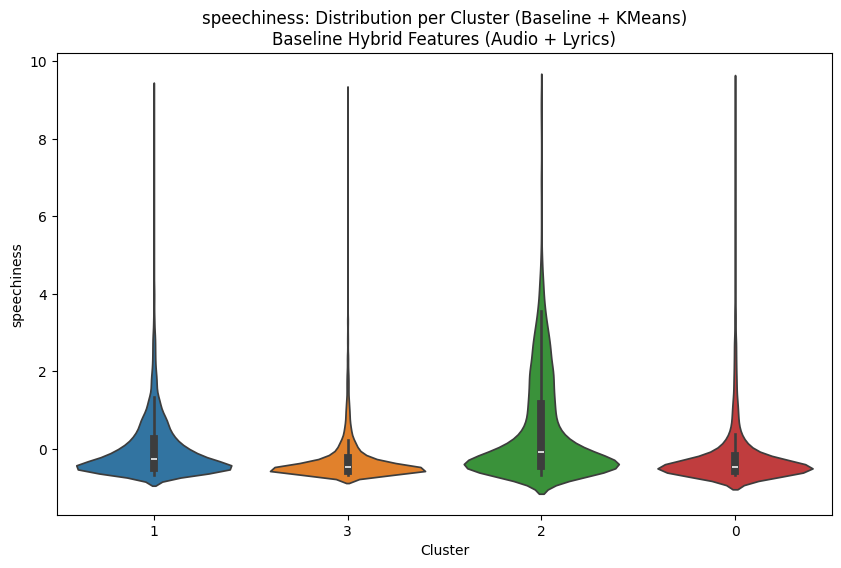

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


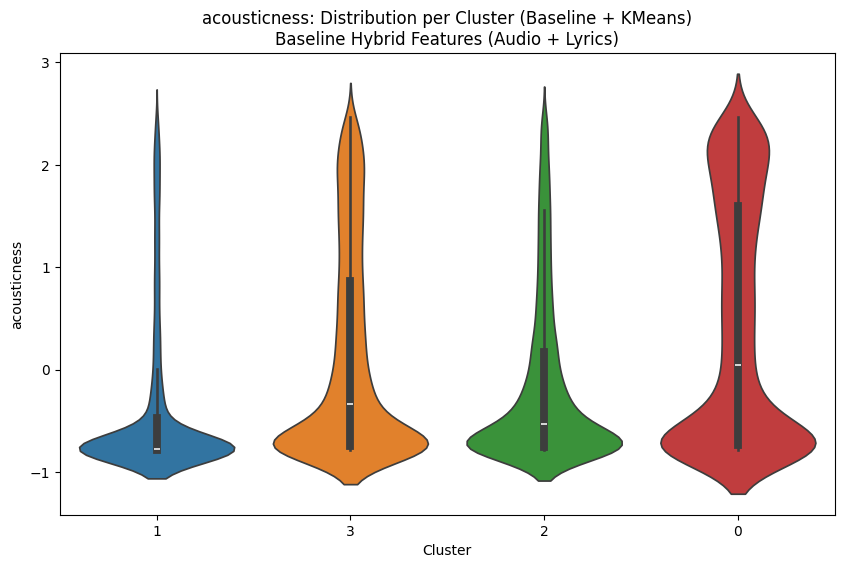

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


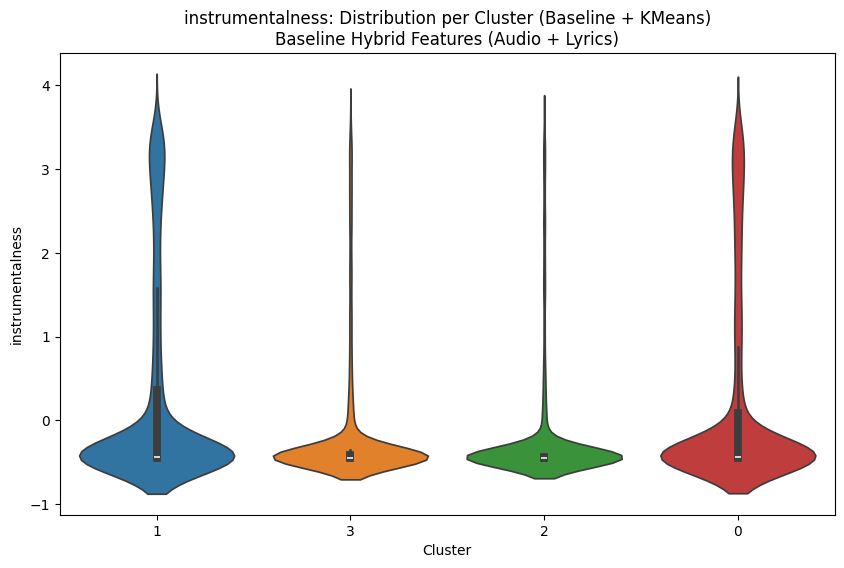

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


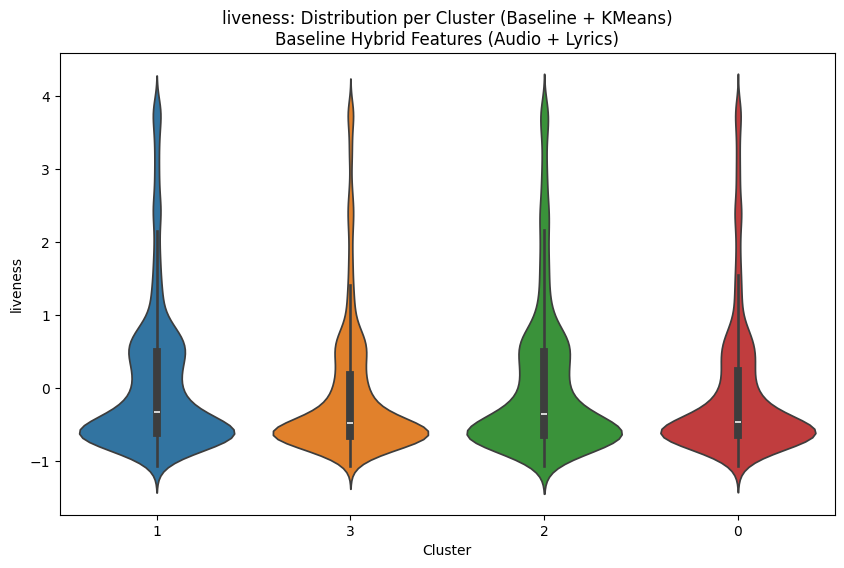

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


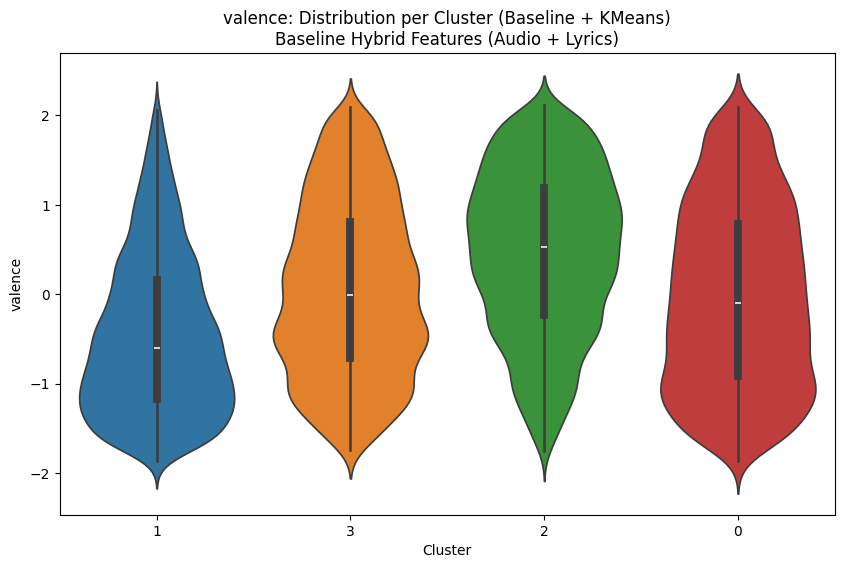

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


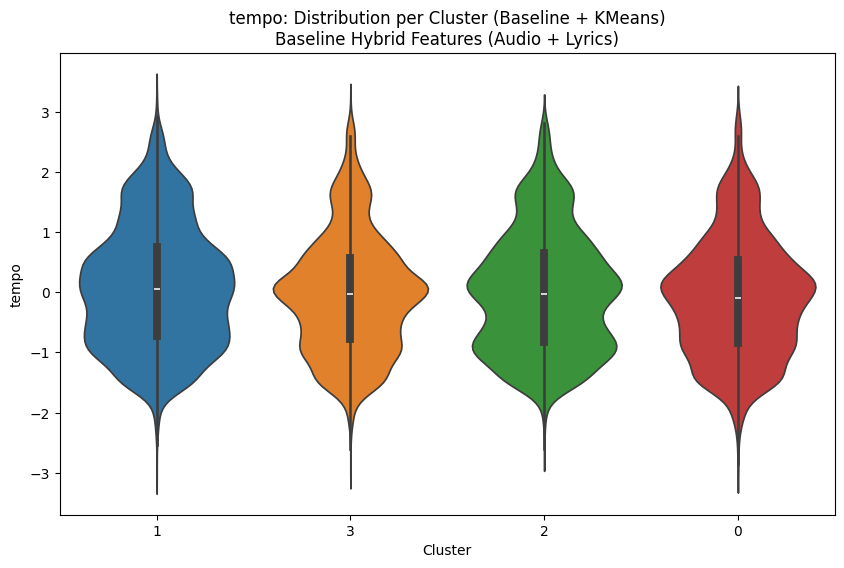

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


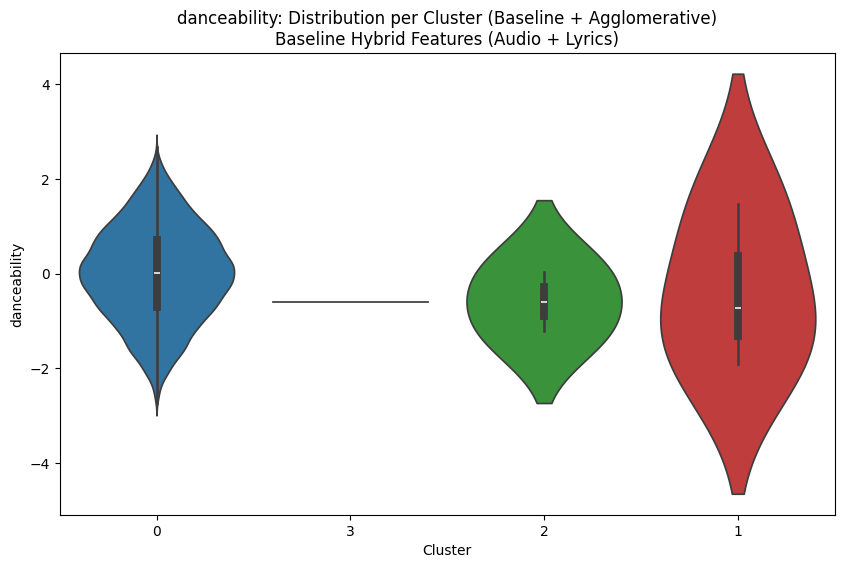

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


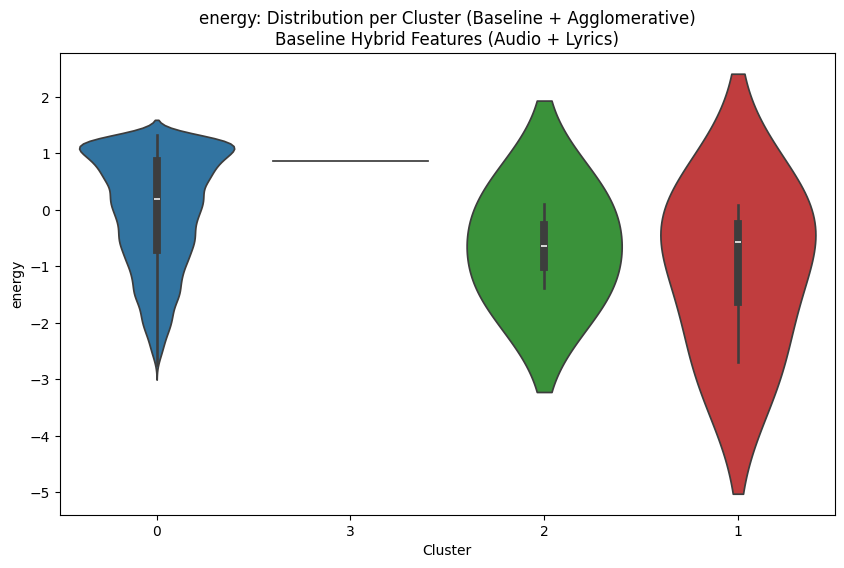

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


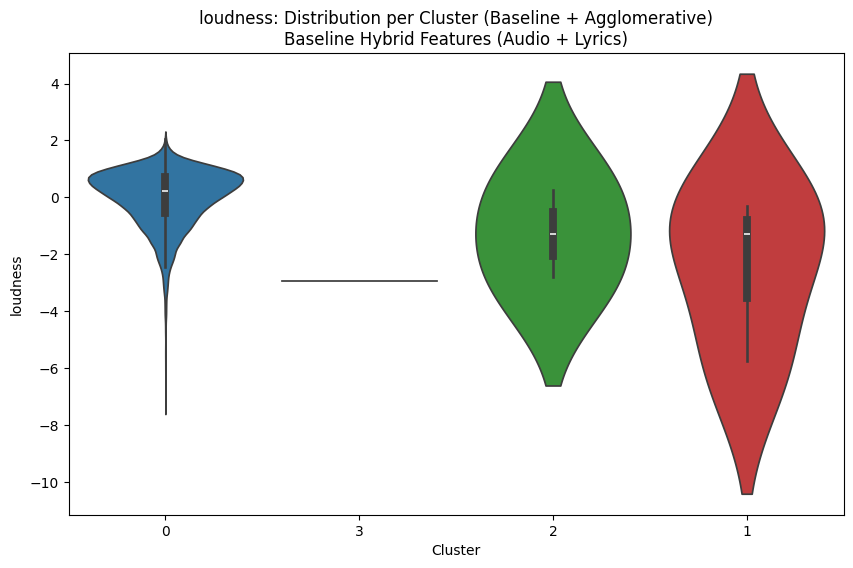

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


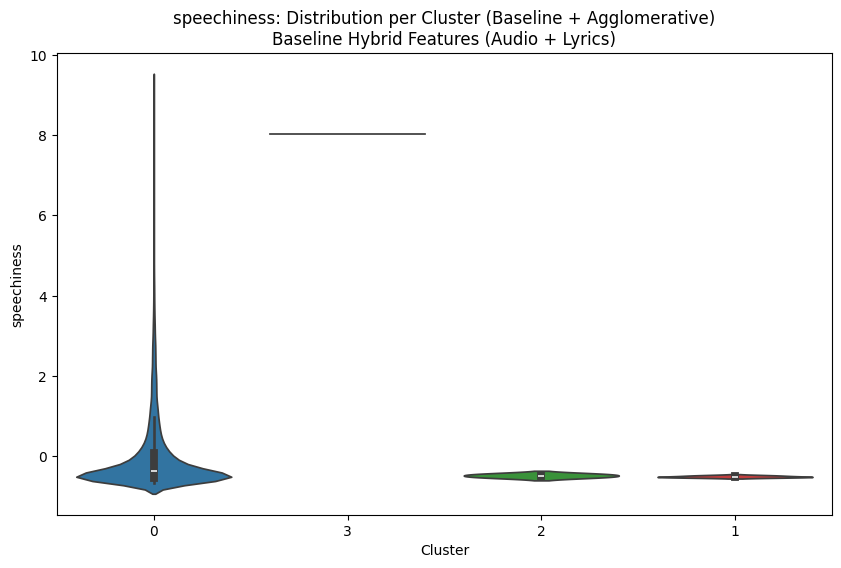

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


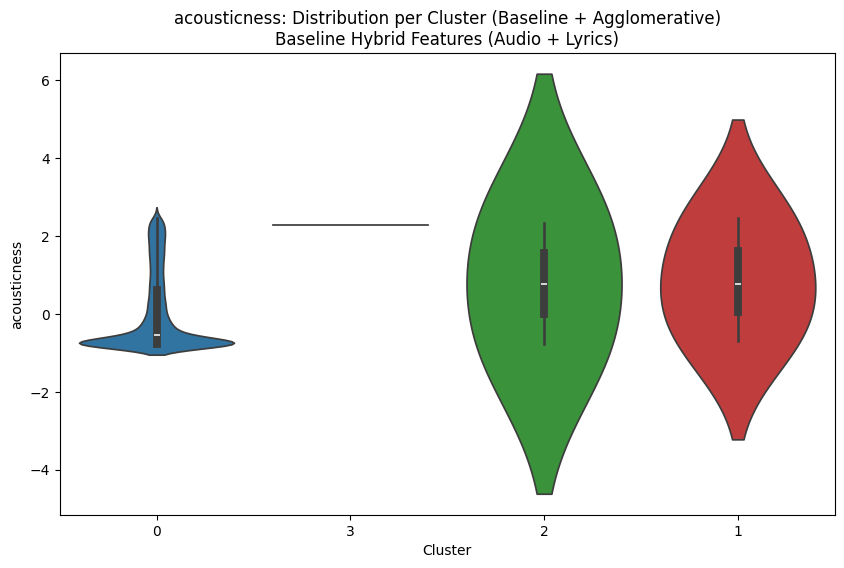

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


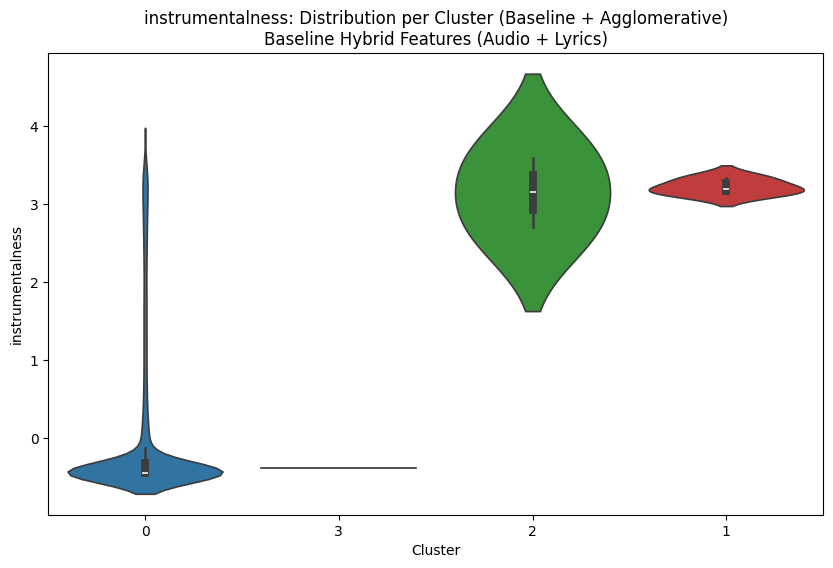

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


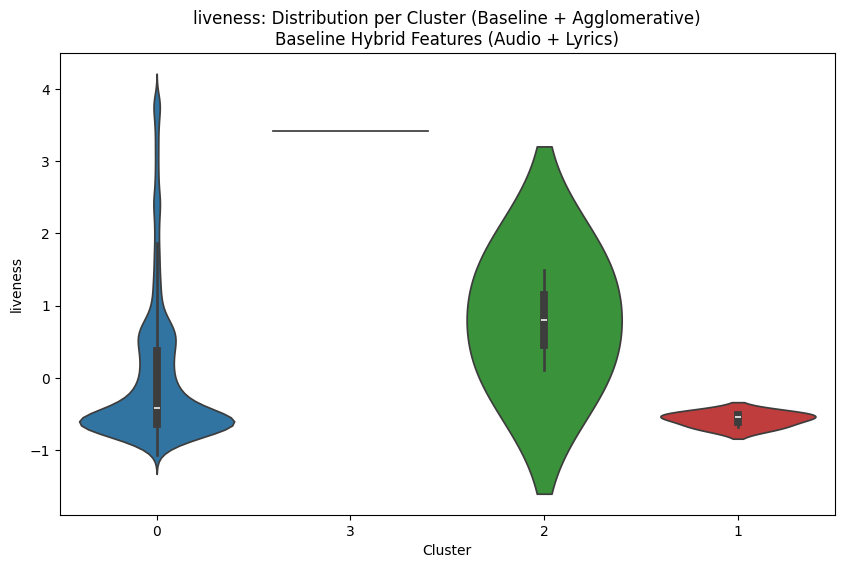

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


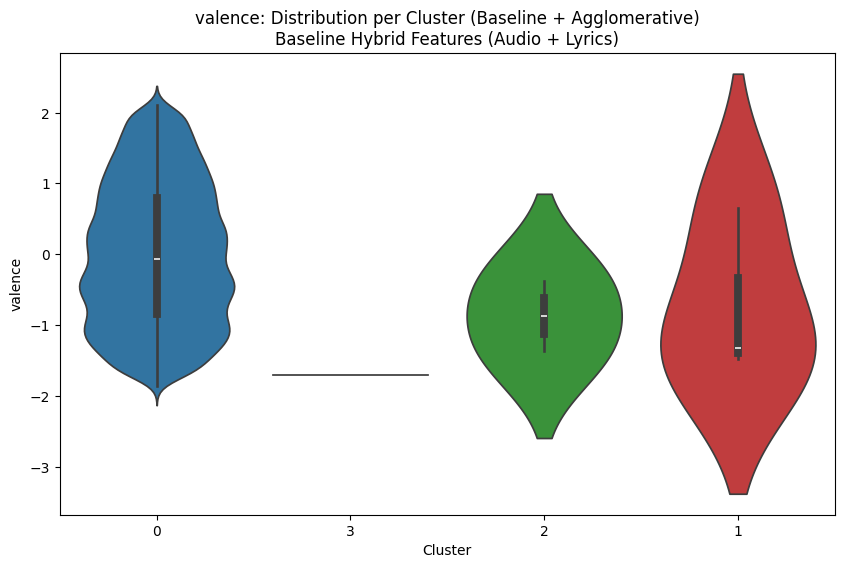

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


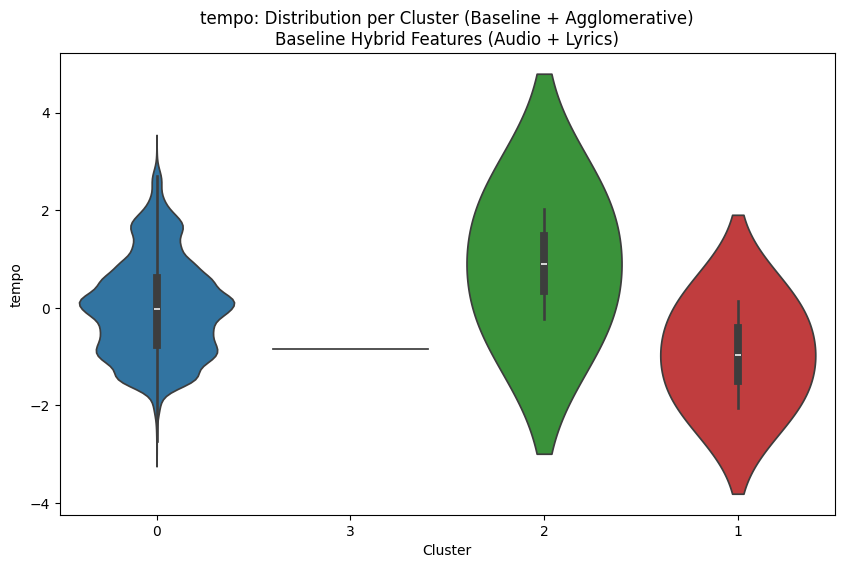

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


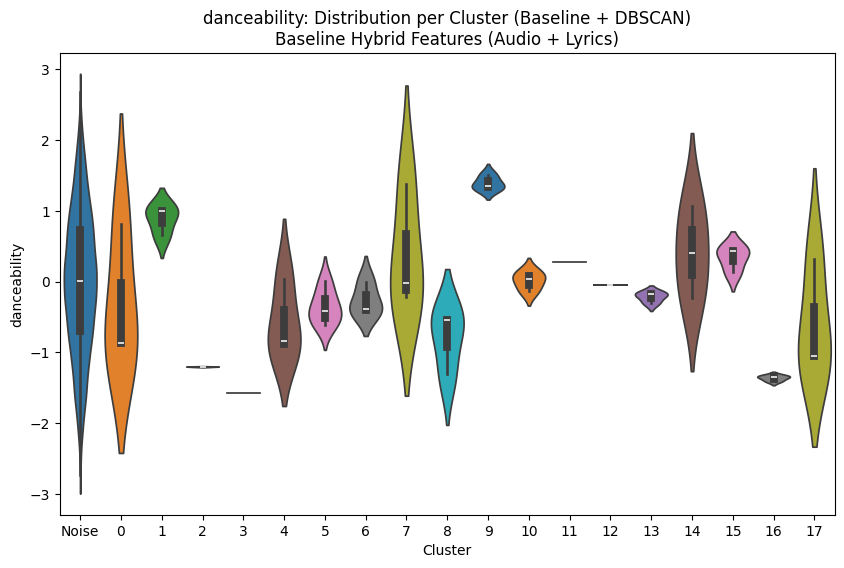

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


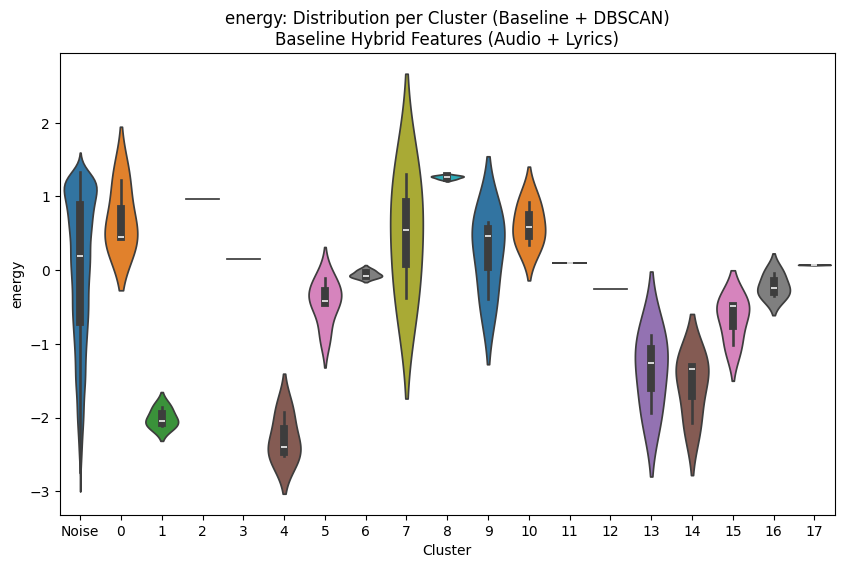

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


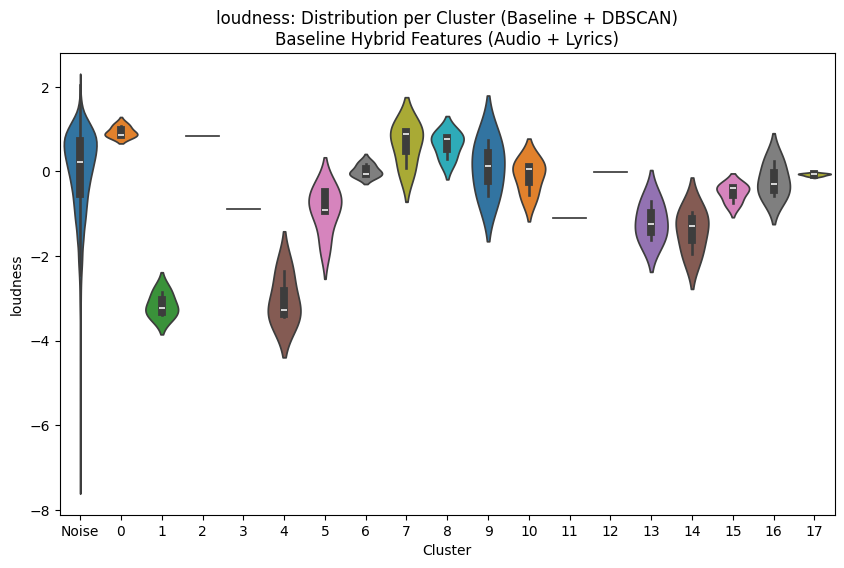

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


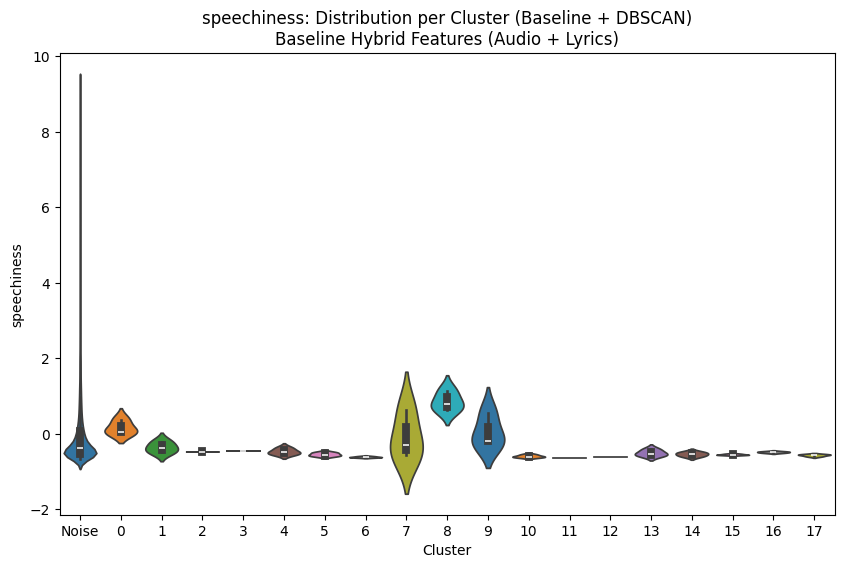

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


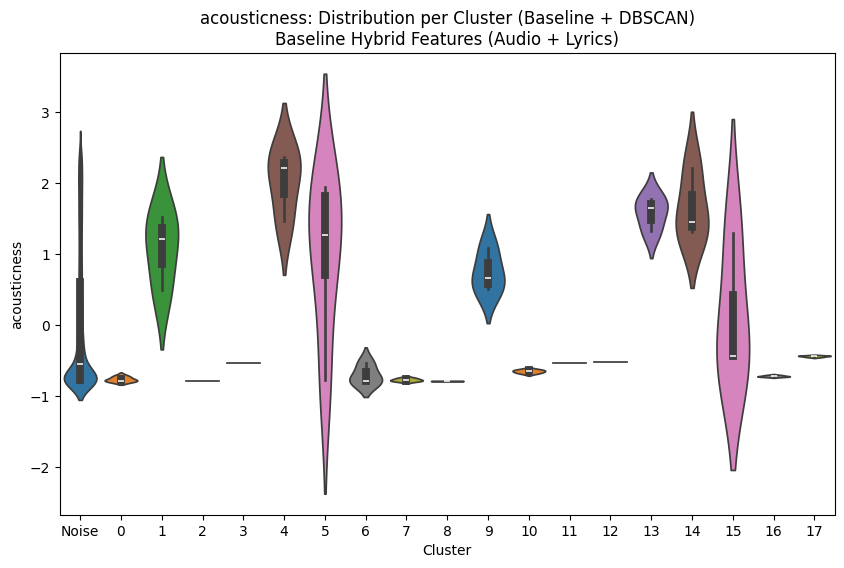

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


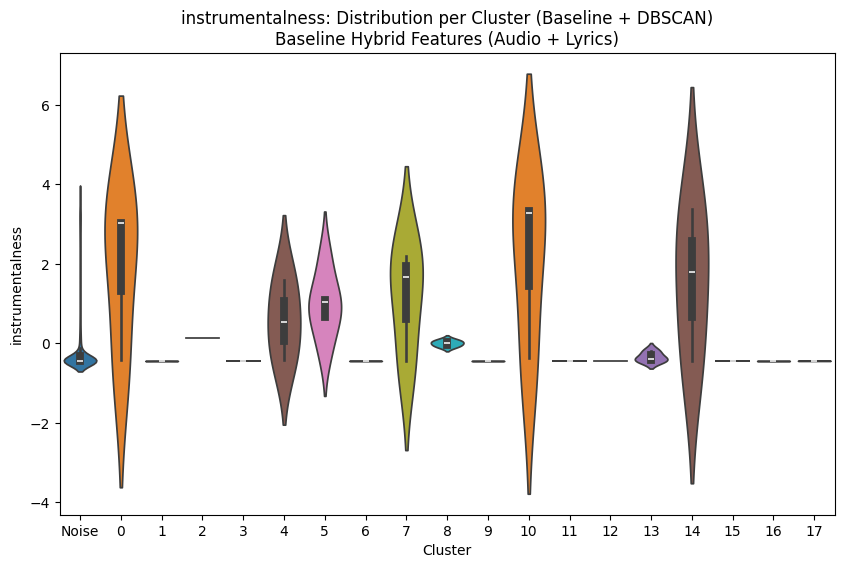

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


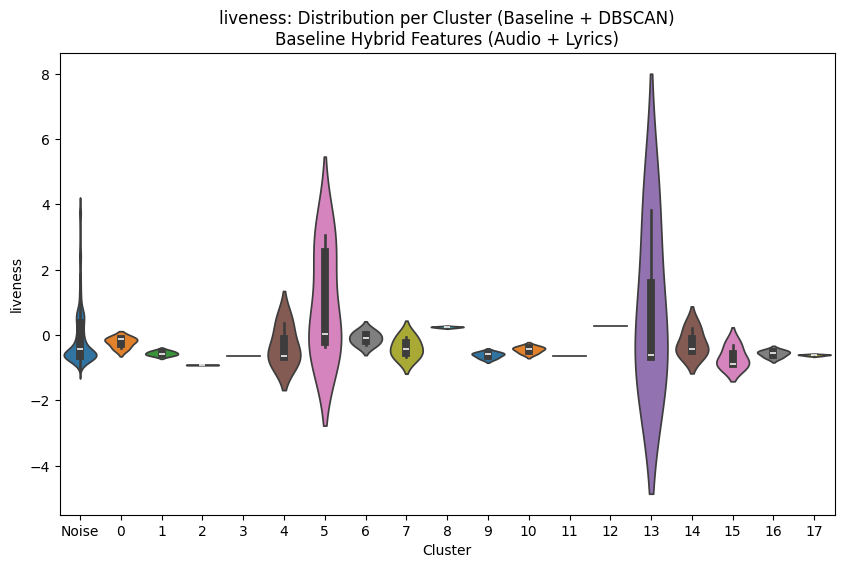

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


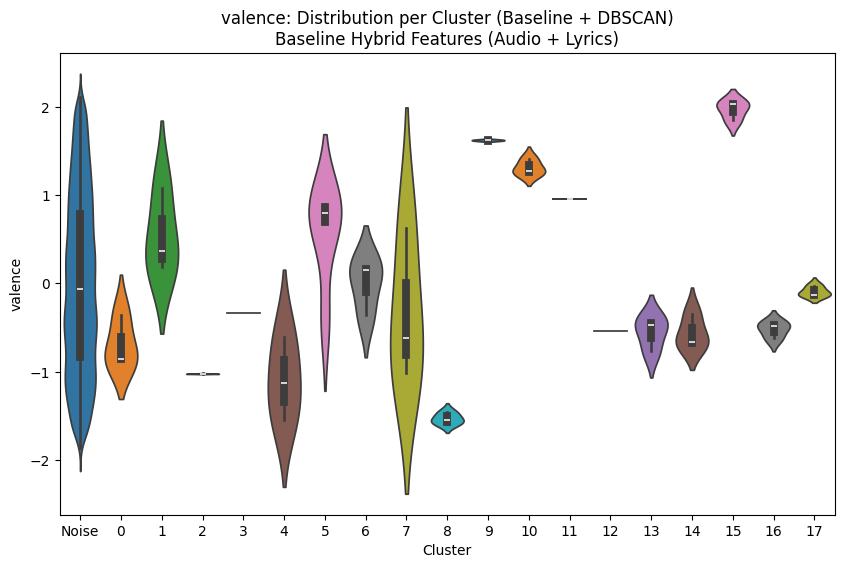

/tmp/ipykernel_55/3516360771.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")


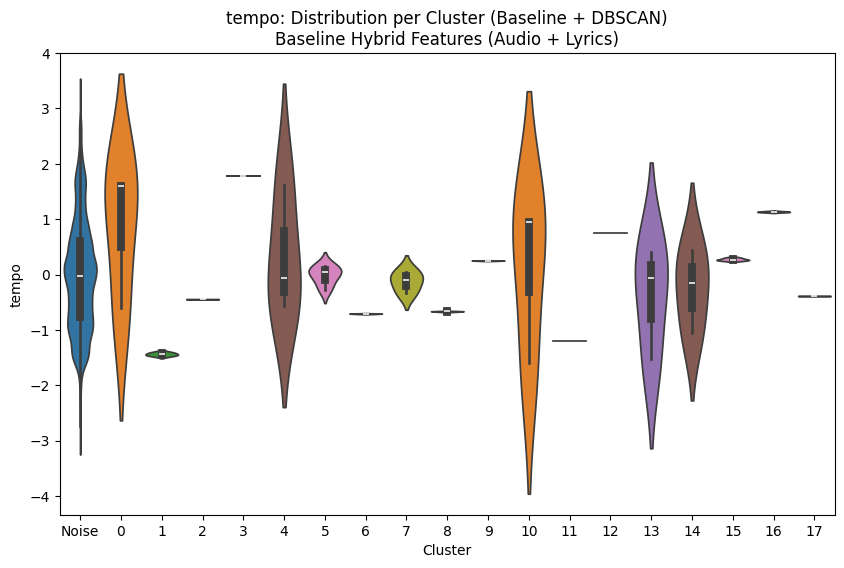

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_violin_feature_per_cluster(X_df, clusters, feature_name, method_name="KMeans"):
    
    # Convert clusters to string for plotting, handle DBSCAN noise
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    df_plot = X_df.copy()
    df_plot["Cluster"] = clusters_str
    
    plt.figure(figsize=(10,6))
    sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")
    plt.title(f"{feature_name}: Distribution per Cluster ({method_name})\nBaseline Hybrid Features (Audio + Lyrics)")
    plt.xlabel("Cluster")
    plt.ylabel(feature_name)
    plt.show()

X_features_df = pd.DataFrame(X_hybrid[:, :len(audio_cols)], columns=audio_cols)  # use raw values

# Apply violin plots for all clustering methods 
for method_name, labels in results_hybrid_baseline.items():  # results_true = baseline clusters
    for feat in audio_cols:  # plot each audio feature
        plot_violin_feature_per_cluster(
            X_features_df, 
            labels, 
            feature_name=feat, 
            method_name=f"Baseline + {method_name}"
        )

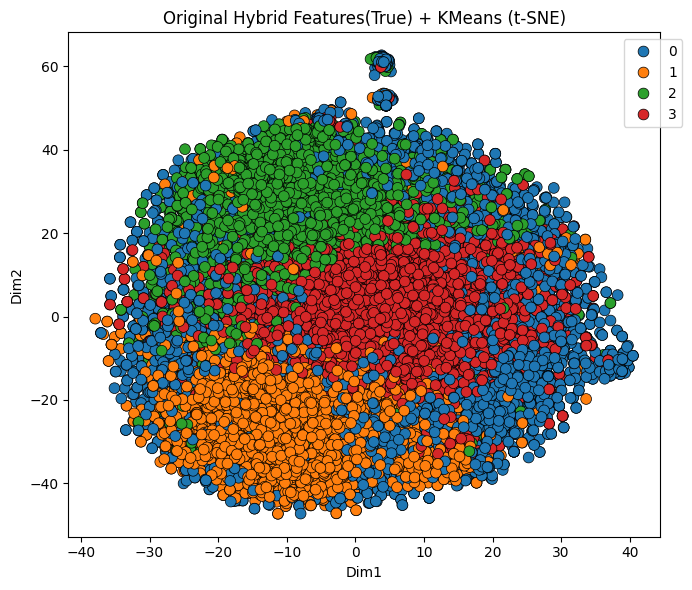

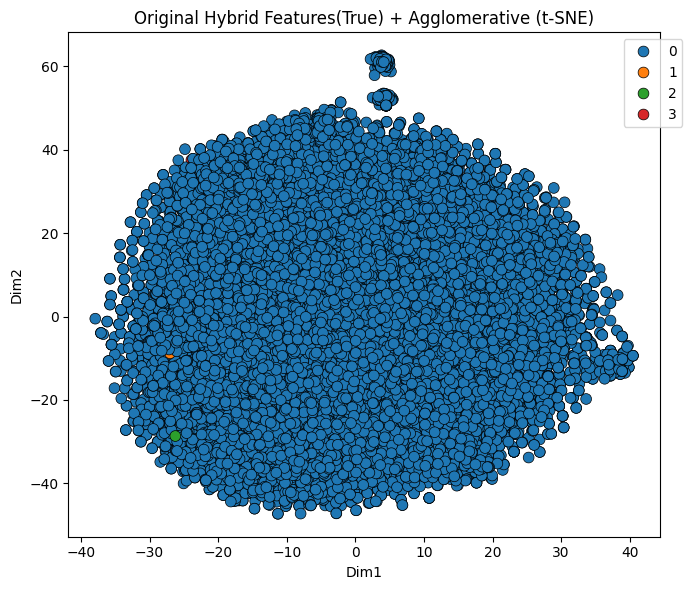

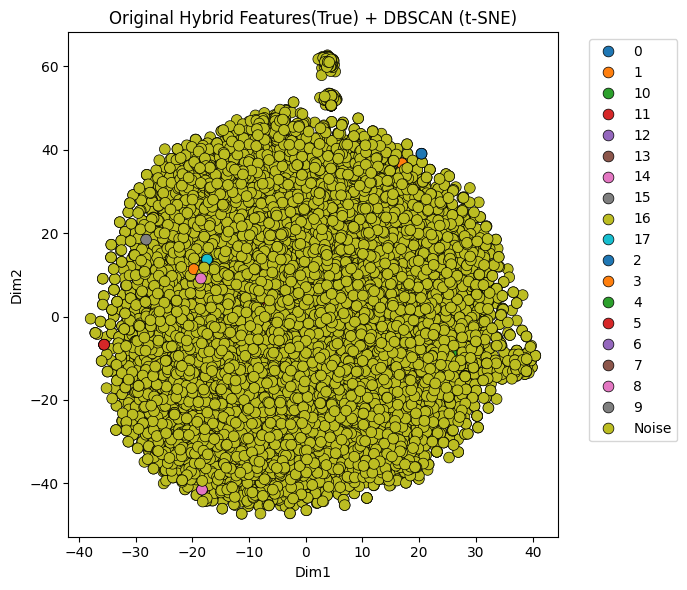

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


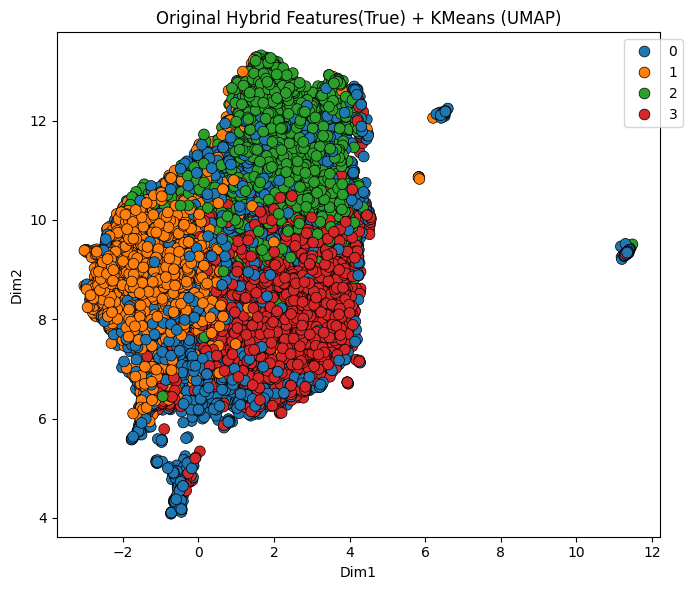

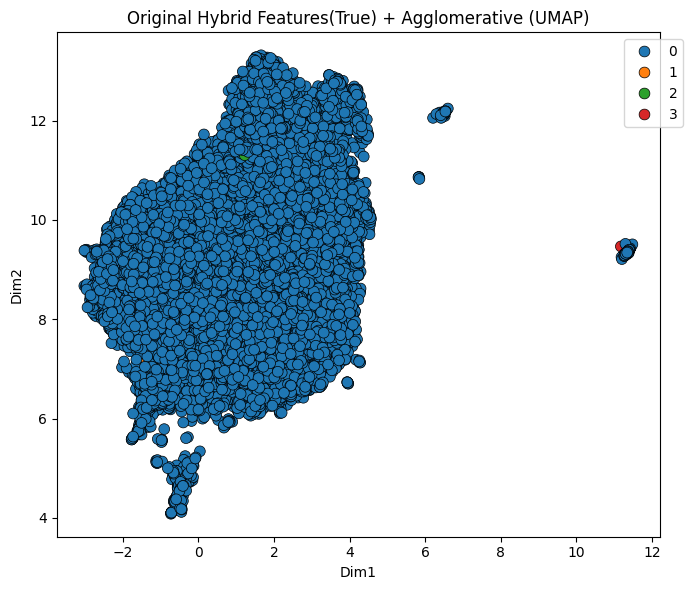

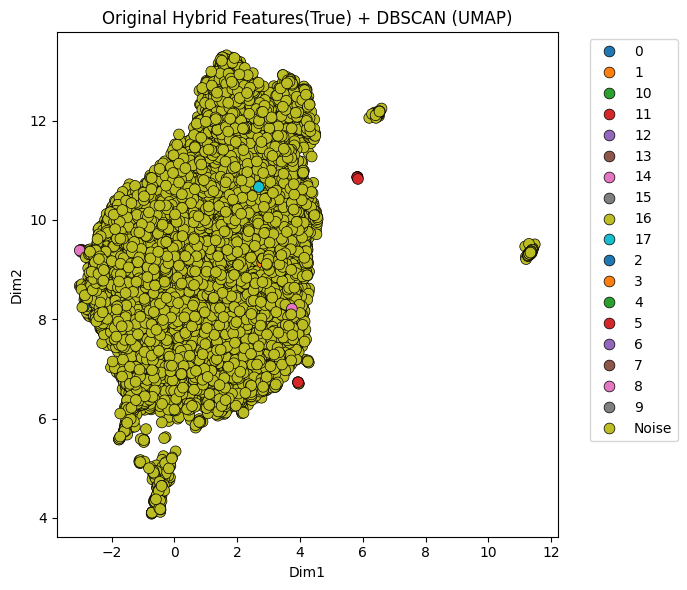

In [54]:
def plot_clusters(X_2d, labels, method_name, reducer_name):

    # Convert noise (-1) to "Noise"
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])

    # Sorted cluster labels for legend
    unique_labels = sorted(np.unique(labels_str))

    df_plot = pd.DataFrame({
        "Dim1": X_2d[:,0],
        "Dim2": X_2d[:,1],
        "Cluster": labels_str
    })

    plt.figure(figsize=(7,6))

    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Cluster",
        hue_order=unique_labels,
        palette="tab10",
        s=60,
        edgecolor="black",
        linewidth=0.5
    )

    plt.title(f"{method_name} ({reducer_name})")
    plt.legend(bbox_to_anchor=(1.05,1))
    plt.tight_layout()
    plt.show()

tsne = TSNE(n_components=2, perplexity=80, random_state=42)
X_tsne_true = tsne.fit_transform(X_hybrid)

# Plot for all algorithms
for name, labels in results_hybrid_baseline.items():
    plot_clusters(X_tsne_true, labels, f"Original Hybrid Features(True) + {name}", "t-SNE")
    
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
X_umap_true = reducer.fit_transform(X_hybrid)

# Plot for all algorithms
for name, labels in results_hybrid_baseline.items():
    plot_clusters(X_umap_true, labels, f"Original Hybrid Features(True) + {name}", "UMAP")

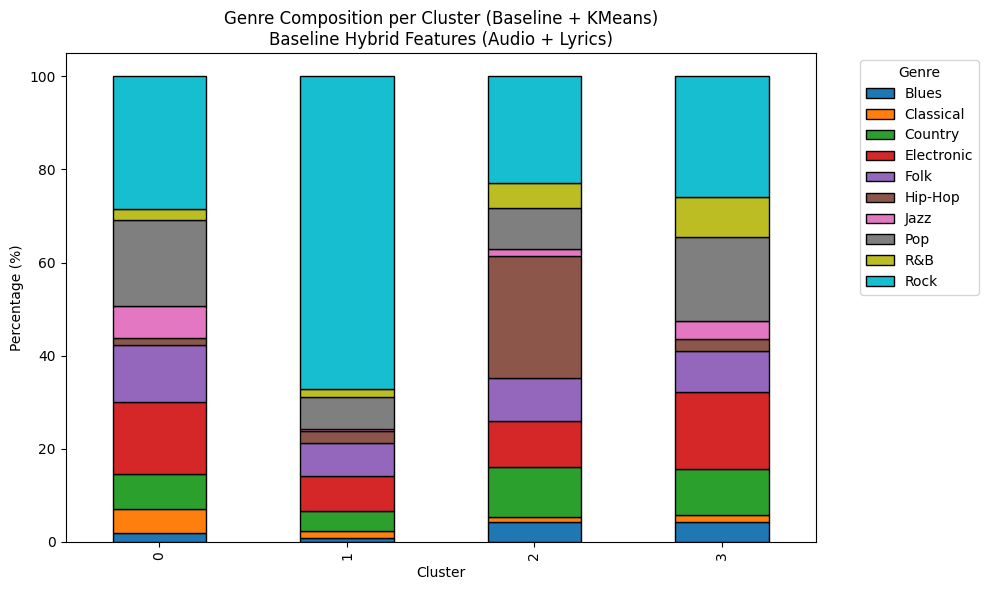


Cluster Counts (Baseline + KMeans):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          103        257      390         786   634       81   352   942   
1           51         88      258         466   422      162    28   412   
2          224         58      583         525   501     1398    87   465   
3          357        131      827        1404   742      225   317  1536   

Genre    R&B  Rock  
Cluster             
0        119  1465  
1        100  4083  
2        290  1226  
3        719  2186  

Cluster Percentages (Baseline + KMeans):
Genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
Cluster                                                                     
0        2.008189   5.010723   7.603821   15.324625  12.361084   1.579255   
1        0.840198   1.449753   4.250412    7.677100   6.952224   2.668863   
2        4.181445   1.08

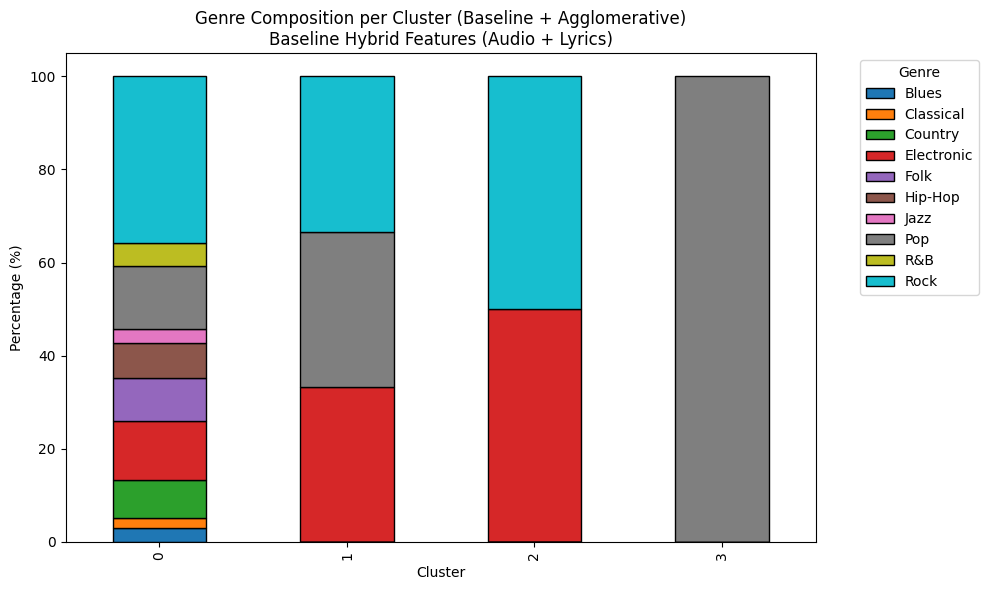


Cluster Counts (Baseline + Agglomerative):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          735        534     2058        3179  2299     1866   784  3353   
1            0          0        0           1     0        0     0     1   
2            0          0        0           1     0        0     0     0   
3            0          0        0           0     0        0     0     1   

Genre     R&B  Rock  
Cluster              
0        1228  8958  
1           0     1  
2           0     1  
3           0     0  

Cluster Percentages (Baseline + Agglomerative):
Genre       Blues  Classical   Country  Electronic      Folk   Hip-Hop  \
Cluster                                                                  
0        2.940706   2.136513  8.233976   12.719053  9.198208  7.465792   
1        0.000000   0.000000  0.000000   33.333333  0.000000  0.000000   
2        0.00000

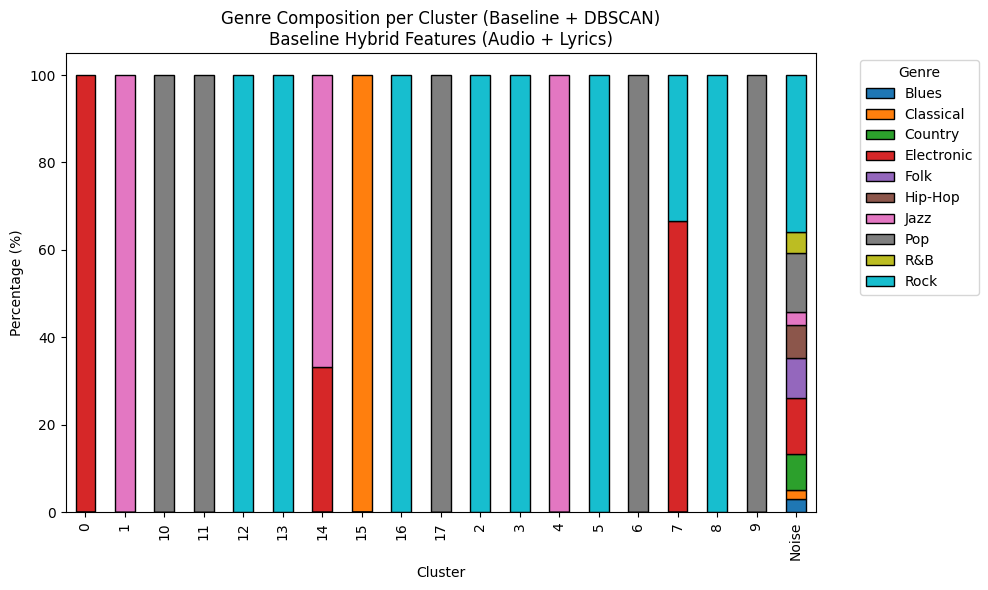


Cluster Counts (Baseline + DBSCAN):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0            0          0        0           3     0        0     0     0   
1            0          0        0           0     0        0     3     0   
10           0          0        0           0     0        0     0     3   
11           0          0        0           0     0        0     0     3   
12           0          0        0           0     0        0     0     0   
13           0          0        0           0     0        0     0     0   
14           0          0        0           1     0        0     2     0   
15           0          3        0           0     0        0     0     0   
16           0          0        0           0     0        0     0     0   
17           0          0        0           0     0        0     0     3   
2            0          0        0     

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def cluster_composition_baseline(clusters, method_name="KMeans", le=None):
    
    # Convert clusters to string for consistent labeling, handle DBSCAN noise
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder is provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels  
    
    # Create DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(10,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title(f"Genre Composition per Cluster ({method_name})\nBaseline Hybrid Features (Audio + Lyrics)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # Print counts and percentages
    print(f"\nCluster Counts ({method_name}):")
    print(cluster_counts)
    print(f"\nCluster Percentages ({method_name}):")
    print(cluster_percent)

# Apply to all baseline hybrid clustering results
for name, labels in results_hybrid_baseline.items():
    cluster_composition_baseline(labels, method_name=f"Baseline + {name}", le=le)

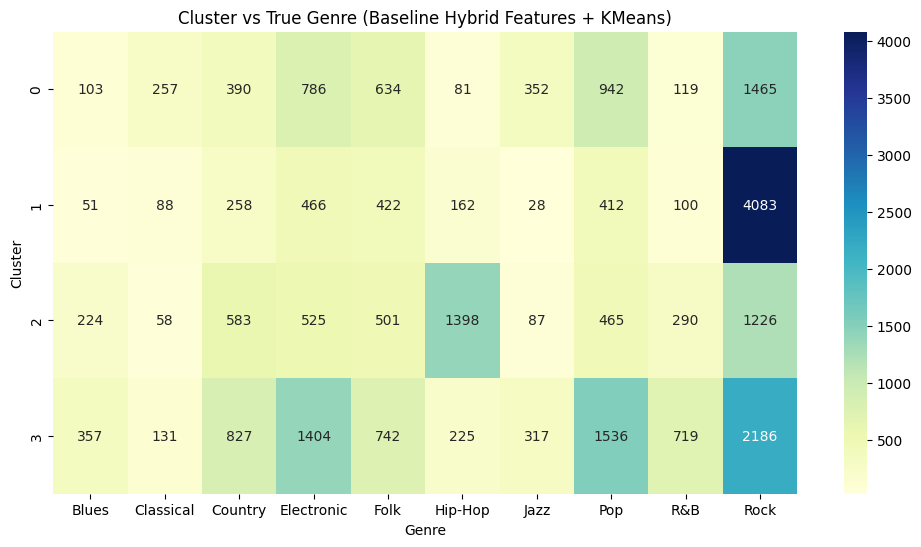

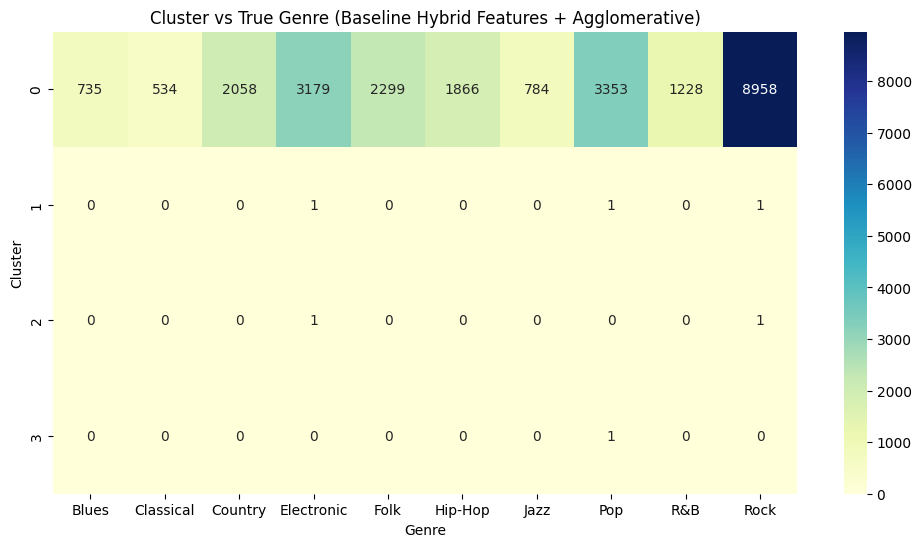

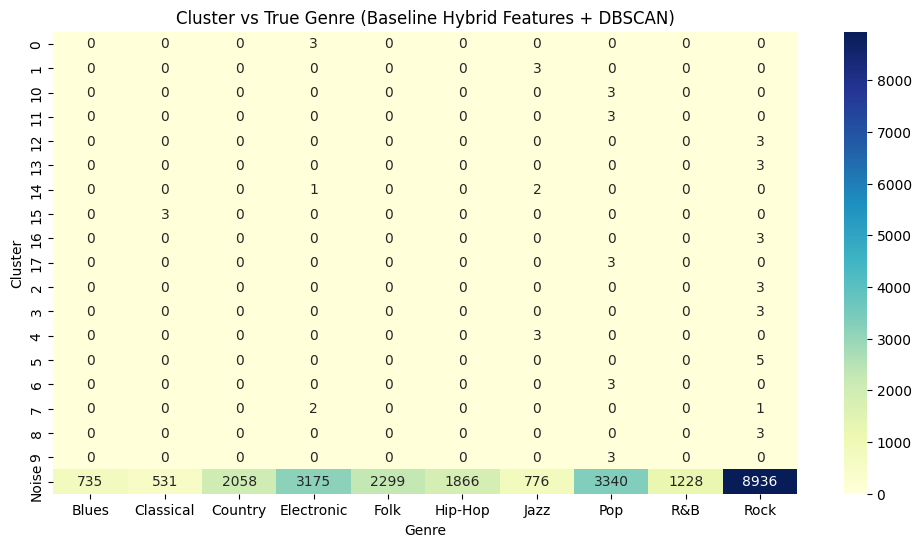

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    plt.figure(figsize=(12,6))
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Cluster vs True Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()

for name, labels in results_hybrid_baseline.items():
    cluster_heatmap(labels, f"Baseline Hybrid Features + {name}")

In [26]:
results_baseline_audio = {}

# KMeans
results_baseline_audio["KMeans"] = KMeans(n_clusters=4, n_init = 10, random_state=42).fit_predict(X_audio_pca)

# Agglomerative
results_baseline_audio["Agglomerative"] = AgglomerativeClustering(n_clusters=4, linkage= 'average').fit_predict(X_audio_pca)

# DBSCAN
results_baseline_audio["DBSCAN"] = DBSCAN(eps=1.5, min_samples=3).fit_predict(X_audio_pca)

# Evaluate
for name, labels in results_baseline_audio.items():
    if name == "DBSCAN":
        X_eval = X_audio_pca  # PCA-reduced data
        mask = labels != -1
        n_clusters_alg = len(np.unique(labels[mask]))
        if np.sum(mask) > 1 and n_clusters_alg > 1:
            sil = silhouette_score(X_eval[mask], labels[mask])
            dbi = davies_bouldin_score(X_eval[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0
    else:  # KMeans / Agg
        X_eval = X_audio_scaled
        n_clusters_alg = len(np.unique(labels))
        if n_clusters_alg > 1:
            sil = silhouette_score(X_eval, labels)
            dbi = davies_bouldin_score(X_eval, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"\nBaseline (Audio only) - {name}")
    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")



Baseline (Audio only) - KMeans
Silhouette Score: 0.186694
Davies-Bouldin Index: 1.693339
Adjusted Rand Index: 0.095325

Baseline (Audio only) - Agglomerative
Silhouette Score: 0.284183
Davies-Bouldin Index: 1.282946
Adjusted Rand Index: 0.005080

Baseline (Audio only) - DBSCAN
Silhouette Score: 0.400950
Davies-Bouldin Index: 0.735051
Adjusted Rand Index: 0.001027


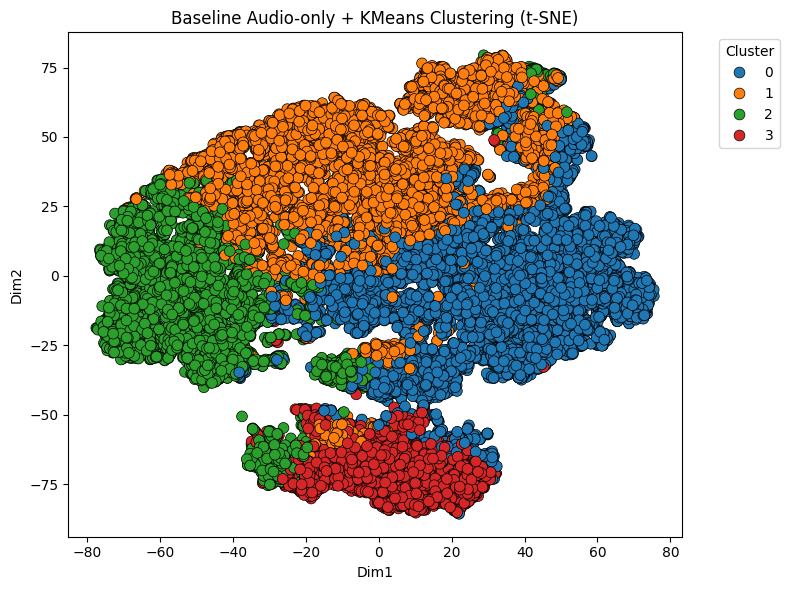

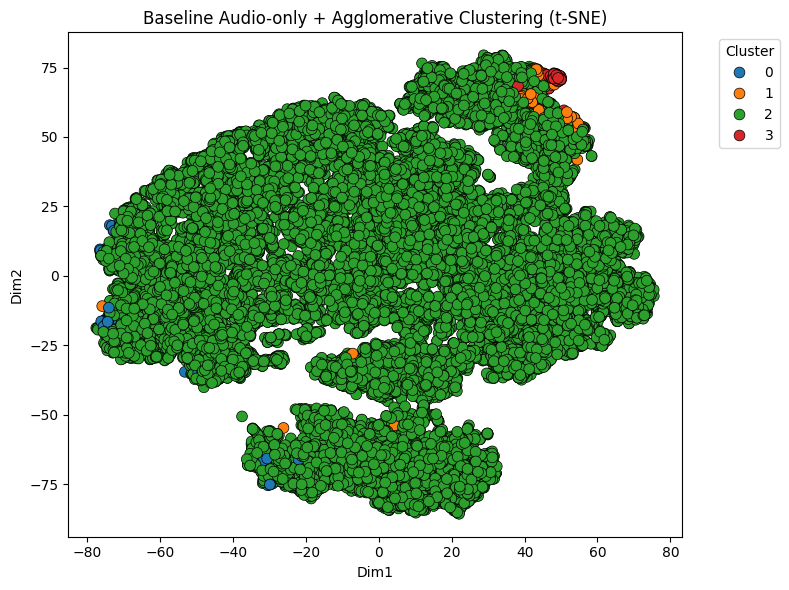

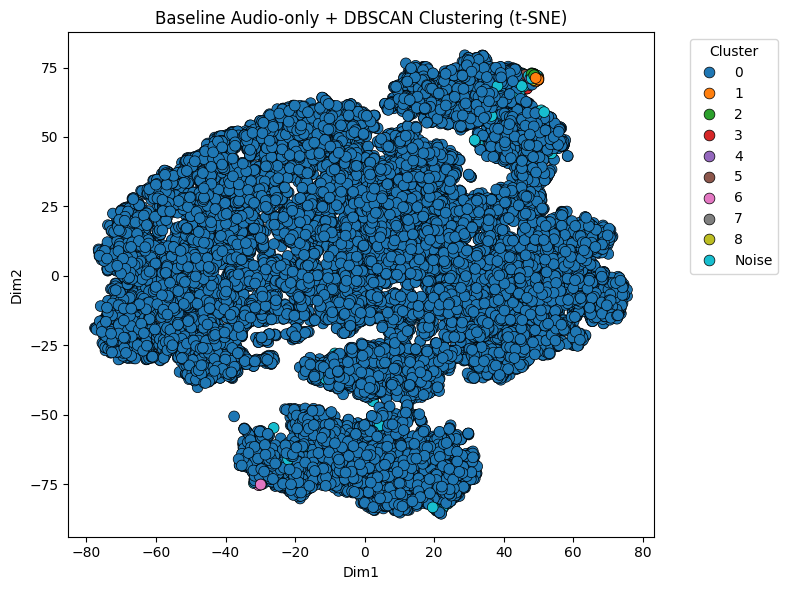

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


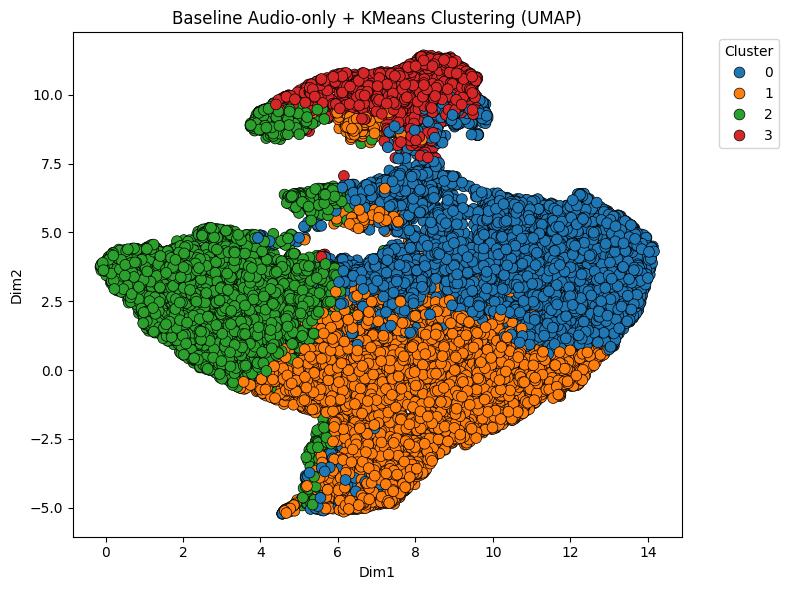

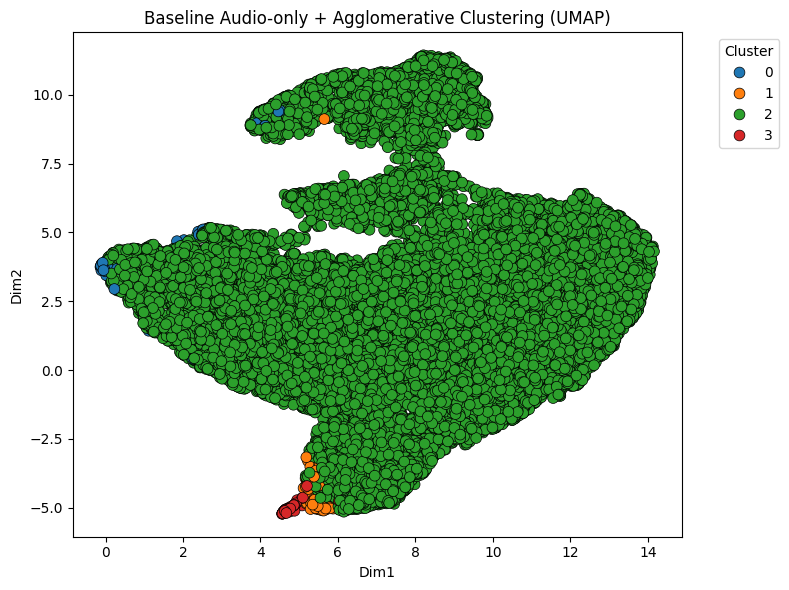

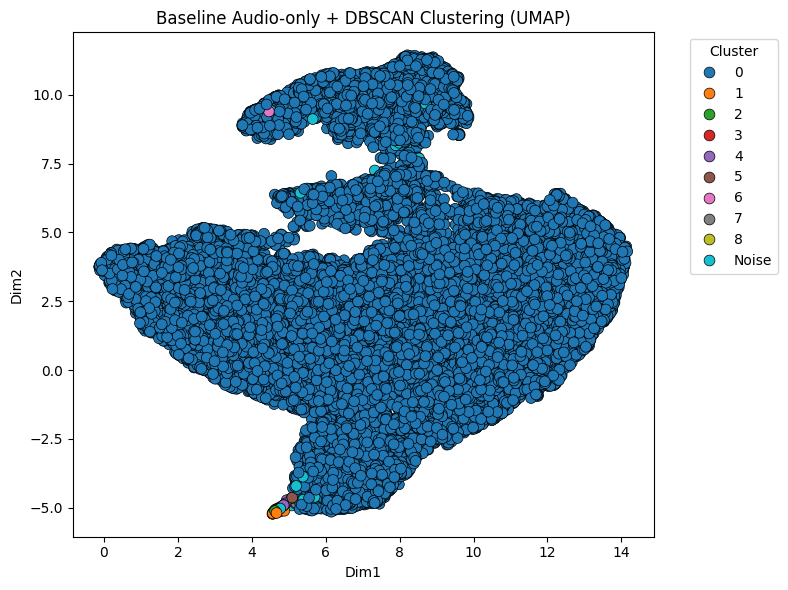

In [28]:
def plot_scatter_baseline_audio(X_2d, labels, method_name, reducer_name="t-SNE"):
    # Convert labels to string for discrete hue, handle DBSCAN noise
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])
    unique_labels = sorted(np.unique(labels_str))
    
    df_plot = pd.DataFrame({
        "Dim1": X_2d[:, 0],
        "Dim2": X_2d[:, 1],
        "Cluster": labels_str
    })
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Cluster",
        hue_order=unique_labels,
        palette="tab10",
        edgecolor="black",
        linewidth=0.5,
        s=60
    )
    plt.title(f"Baseline Audio-only + {method_name} Clustering ({reducer_name})")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Prepare features for t-SNE / UMAP
X_cluster_dict = {
    "KMeans": X_audio_pca,
    "Agglomerative": X_audio_pca,
    "DBSCAN": X_audio_pca
}

# t-SNE visualization
tsne = TSNE(n_components=2, perplexity=80, random_state=42)
for name, labels in results_baseline_audio.items():
    X_2d = tsne.fit_transform(X_cluster_dict[name])
    plot_scatter_baseline_audio(X_2d, labels, name, reducer_name="t-SNE")

# UMAP visualization
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
for name, labels in results_baseline_audio.items():
    X_2d = reducer.fit_transform(X_cluster_dict[name])
    plot_scatter_baseline_audio(X_2d, labels, name, reducer_name="UMAP")


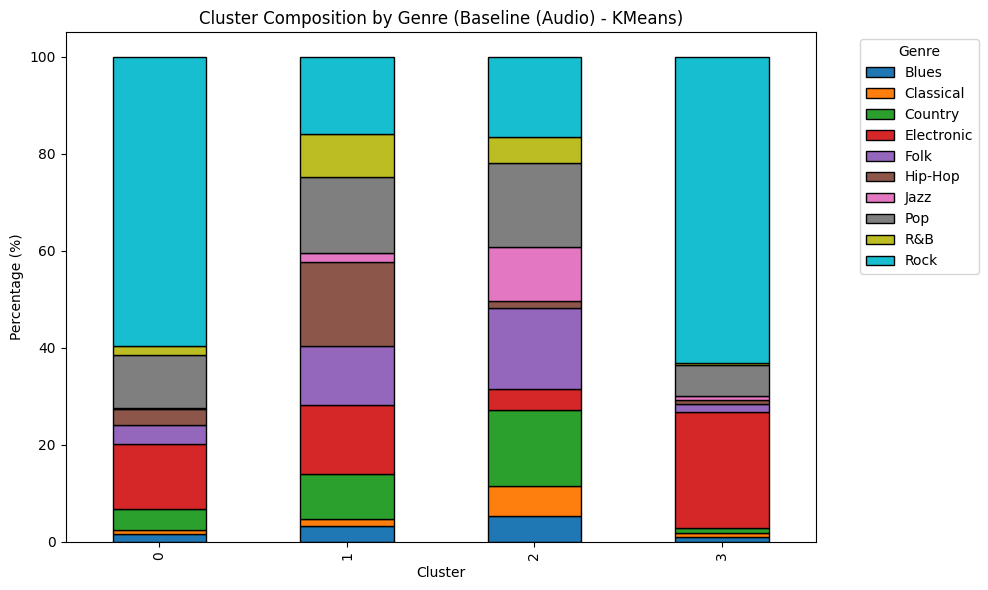


 Cluster Composition Counts (Baseline (Audio) - KMeans) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          141         59      385        1135   337      286    17   930   
1          279        123      790        1202  1016     1480   142  1325   
2          288        332      855         233   905       79   602   937   
3           27         20       28         611    41       21    23   163   

Genre    R&B  Rock  
Cluster             
0        166  5092  
1        761  1348  
2        287   903  
3         14  1617  

 Cluster Composition Percentages (Baseline (Audio) - KMeans) 
Genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
Cluster                                                                     
0        1.649509   0.690220   4.503978   13.277960   3.942443   3.345812   
1        3.295535   1.452870   9.331443   14.197968  12.000

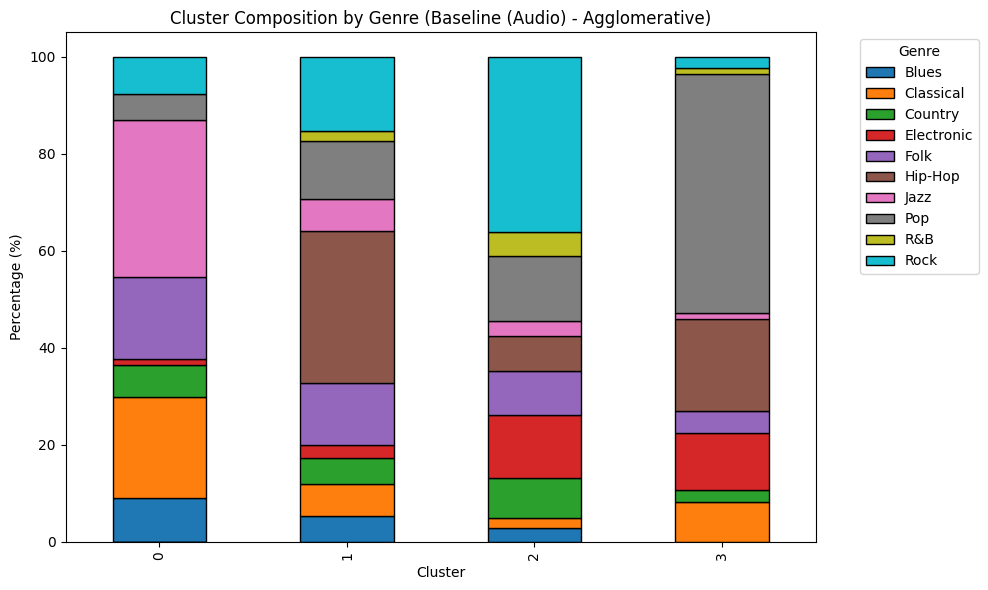


 Cluster Composition Counts (Baseline (Audio) - Agglomerative) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0            7         16        5           1    13        0    25     4   
1            8         10        8           4    19       47    10    18   
2          720        501     2043        3166  2263     1803   748  3291   
3            0          7        2          10     4       16     1    42   

Genre     R&B  Rock  
Cluster              
0           0     6  
1           3    23  
2        1224  8929  
3           1     2  

 Cluster Composition Percentages (Baseline (Audio) - Agglomerative) 
Genre       Blues  Classical   Country  Electronic       Folk    Hip-Hop  \
Cluster                                                                    
0        9.090909  20.779221  6.493506    1.298701  16.883117   0.000000   
1        5.333333   6.666667  5.333333    

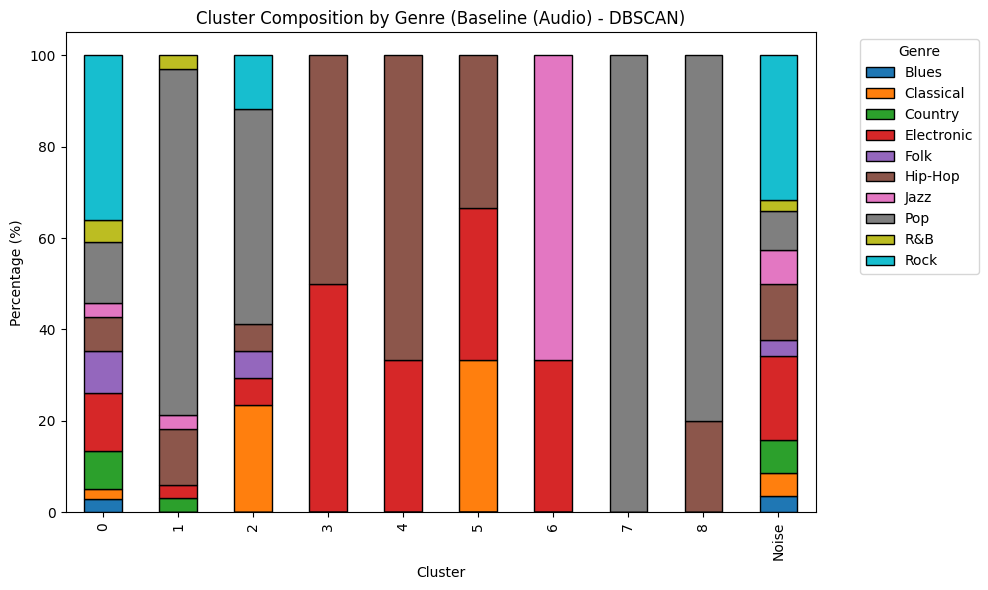


 Cluster Composition Counts (Baseline (Audio) - DBSCAN) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          732        525     2051        3159  2295     1845   775  3308   
1            0          0        1           1     0        4     1    25   
2            0          4        0           1     1        1     0     8   
3            0          0        0           2     0        2     0     0   
4            0          0        0           1     0        2     0     0   
5            0          1        0           1     0        1     0     0   
6            0          0        0           1     0        0     2     0   
7            0          0        0           0     0        0     0     3   
8            0          0        0           0     0        1     0     4   
Noise        3          4        6          15     3       10     6     7   

Genre     R&B  Ro

In [ ]:
import pandas as pd
import numpy as np

def cluster_composition(clusters, method_name="KMeans", le=None):
    # Convert clusters to string for consistent labeling
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels  
    
    # Make a DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot
    cluster_percent.plot(kind='bar', stacked=True, figsize=(10,6), colormap='tab10', edgecolor='black')
    plt.title(f"Cluster Composition by Genre ({method_name})")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(f"\n Cluster Composition Counts ({method_name}) ")
    print(cluster_counts)
    print(f"\n Cluster Composition Percentages ({method_name}) ")
    print(cluster_percent)

# Cluster composition for baseline (Audio-only)
for name, labels in results_baseline_audio.items():
    cluster_composition(labels, method_name=f"Baseline (Audio) - {name}", le=le)


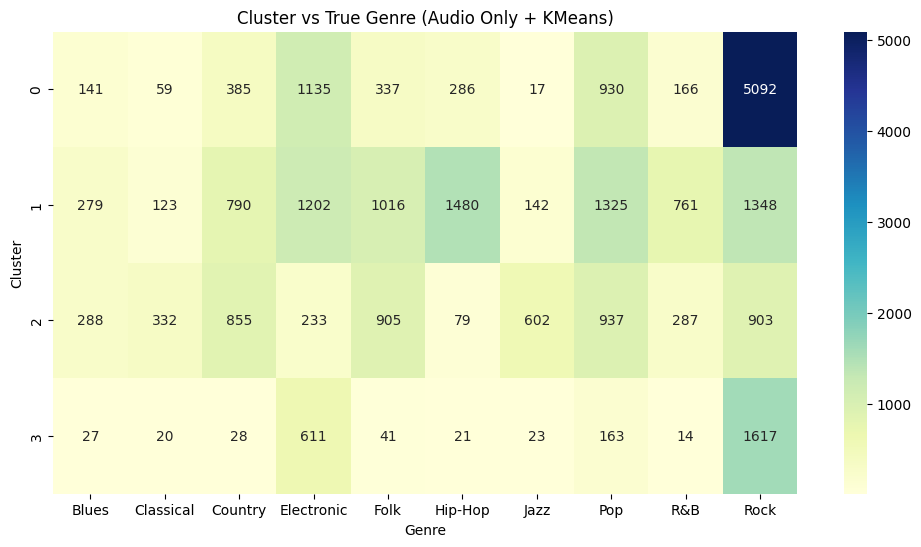

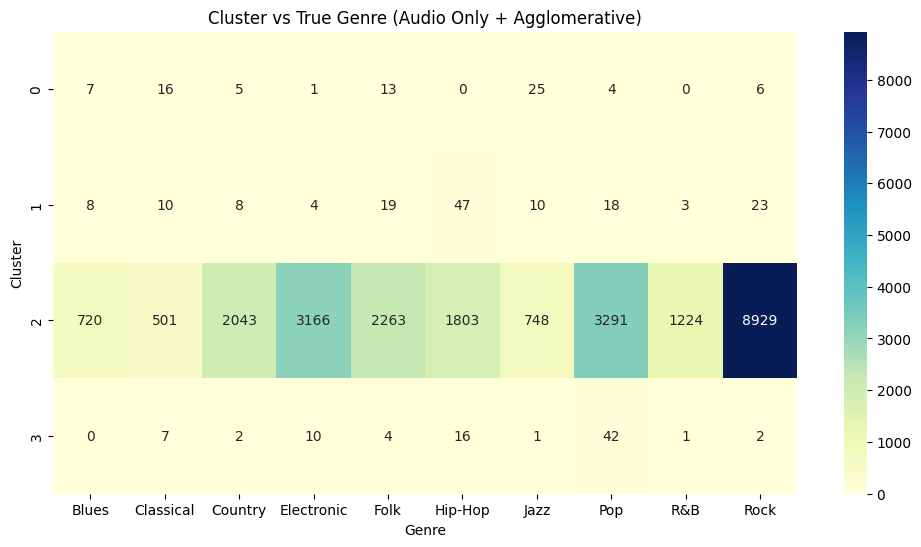

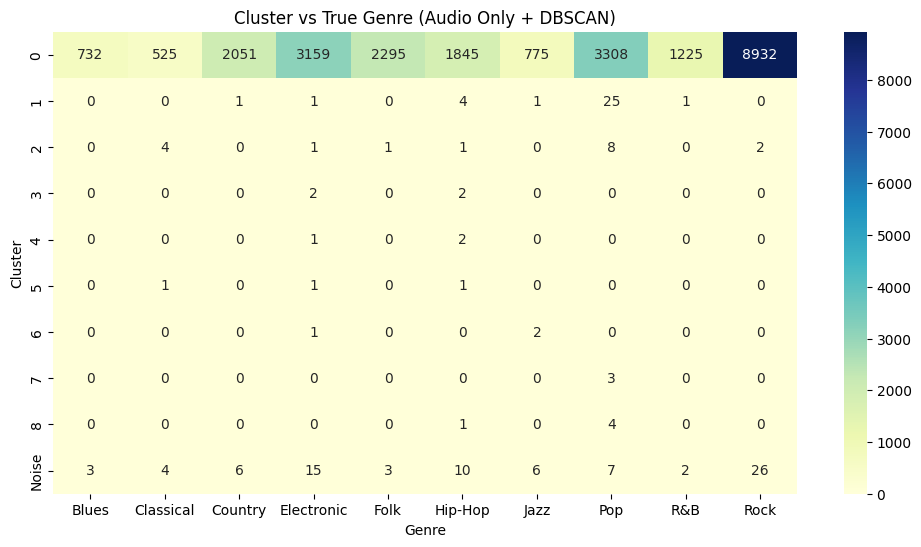

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    plt.figure(figsize=(12,6))
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster vs True Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()


for name, labels in results_baseline_audio.items():
    cluster_heatmap(labels, f"Audio Only + {name}")

In [37]:
# Prepare dictionary to store clustering results
results_lyrics = {}

# KMeans
results_lyrics["KMeans"] = KMeans(n_clusters=4, n_init = 10, random_state=42).fit_predict(X_lyrics_pca)

# Agglomerative
results_lyrics["Agglomerative"] = AgglomerativeClustering(n_clusters=4, linkage= 'average').fit_predict(X_lyrics_pca)

# DBSCAN requires lower dimension for high-D data
pca = PCA(n_components=6, random_state=42)
X_dbscan_lyrics = pca.fit_transform(X_lyrics_scaled)

results_lyrics["DBSCAN"] = DBSCAN(eps=1.5, min_samples=3).fit_predict(X_dbscan_lyrics)

# Evaluate
for name, labels in results_lyrics.items():
    if name == "DBSCAN":
        X_eval = X_dbscan_lyrics
        mask = labels != -1
        n_clusters_alg = len(np.unique(labels[mask]))
        if np.sum(mask) > 1 and n_clusters_alg > 1:
            sil = silhouette_score(X_eval[mask], labels[mask])
            dbi = davies_bouldin_score(X_eval[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0
    else:
        X_eval = X_lyrics_scaled
        n_clusters_alg = len(np.unique(labels))
        if n_clusters_alg > 1:
            sil = silhouette_score(X_eval, labels)
            dbi = davies_bouldin_score(X_eval, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"\nBaseline (Lyrics-only) - {name}")
    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")


Baseline (Lyrics-only) - KMeans
Silhouette Score: 0.026324
Davies-Bouldin Index: 4.997196
Adjusted Rand Index: 0.057558

Baseline (Lyrics-only) - Agglomerative
Silhouette Score: 0.070050
Davies-Bouldin Index: 1.883168
Adjusted Rand Index: -0.000156

Baseline (Lyrics-only) - DBSCAN
Silhouette Score: 0.251555
Davies-Bouldin Index: 0.887359
Adjusted Rand Index: 0.001435


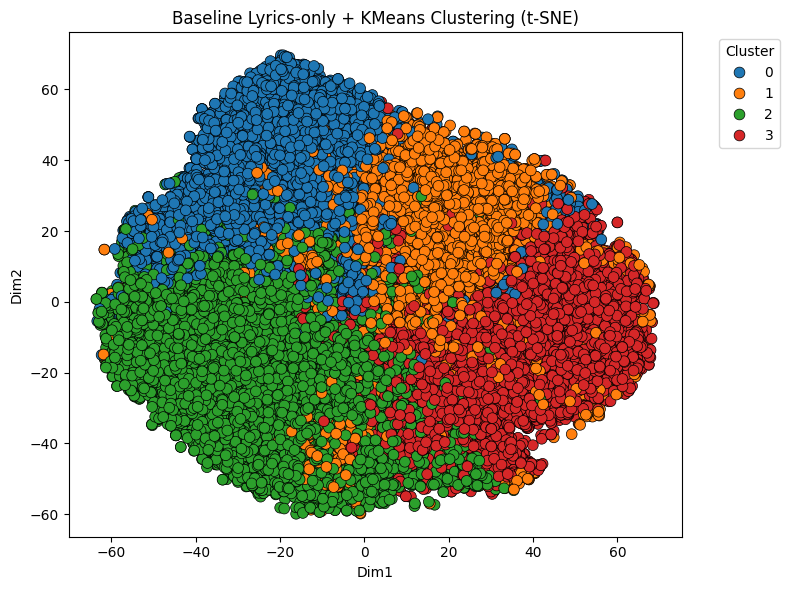

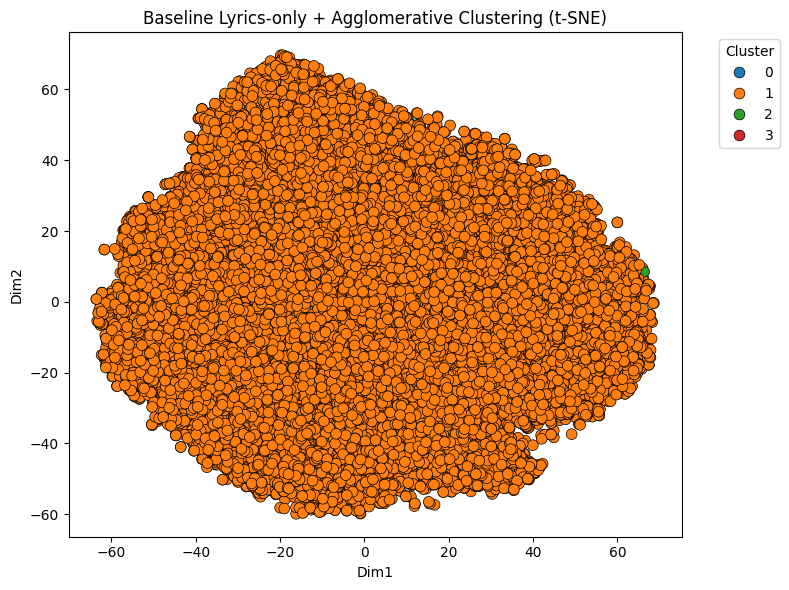

/tmp/ipykernel_55/3833957293.py:27: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


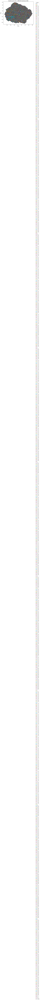

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


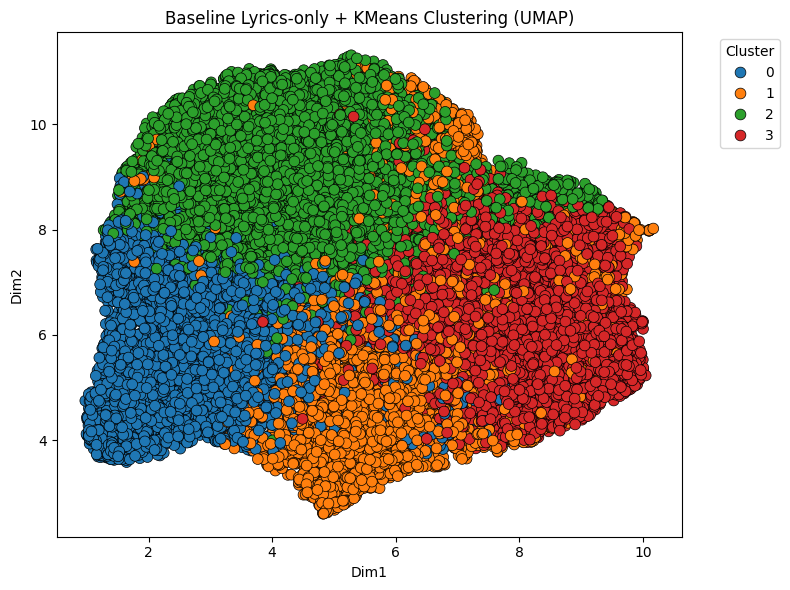

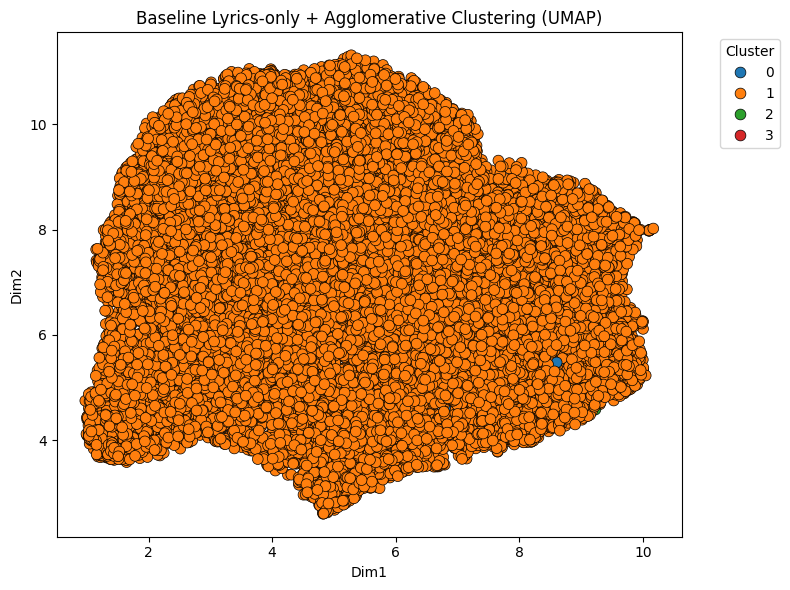

/tmp/ipykernel_55/3833957293.py:27: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


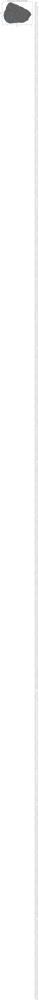

In [38]:
def plot_scatter_lyrics(X_2d, labels, method_name, reducer_name="t-SNE"):
   
    # Convert labels to string for discrete hue, handle DBSCAN noise
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])
    unique_labels = sorted(np.unique(labels_str))
    
    df_plot = pd.DataFrame({
        "Dim1": X_2d[:, 0],
        "Dim2": X_2d[:, 1],
        "Cluster": labels_str
    })
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Cluster",
        hue_order=unique_labels,
        palette="tab10",
        edgecolor="black",
        linewidth=0.5,
        s=60
    )
    plt.title(f"Baseline Lyrics-only + {method_name} Clustering ({reducer_name})")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Prepare features for t-SNE / UMAP

X_lyrics_dict = {
    "KMeans": X_lyrics_pca,
    "Agglomerative": X_lyrics_pca,
    "DBSCAN": PCA(n_components=6, random_state=42).fit_transform(X_lyrics_scaled)
}

# t-SNE visualization
tsne = TSNE(n_components=2, perplexity=80, random_state=42)
for name, labels in results_lyrics.items():
    X_2d = tsne.fit_transform(X_lyrics_dict[name])
    plot_scatter_lyrics(X_2d, labels, name, reducer_name="t-SNE")

# UMAP visualization
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
for name, labels in results_lyrics.items():
    X_2d = reducer.fit_transform(X_lyrics_dict[name])
    plot_scatter_lyrics(X_2d, labels, name, reducer_name="UMAP")


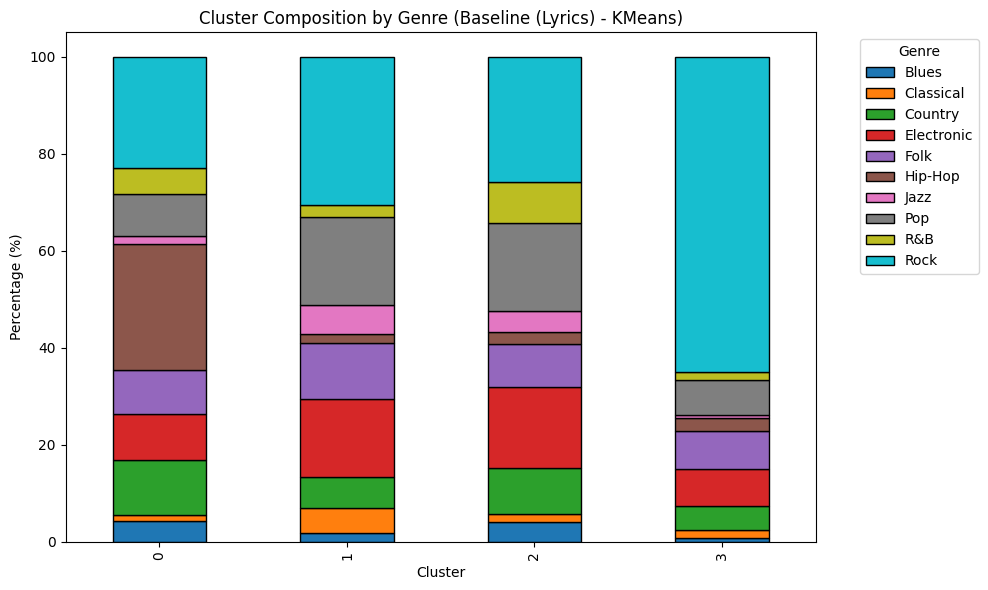


 Cluster Composition Counts (Baseline (Lyrics) - KMeans) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          235         56      609         509   488     1380    90   462   
1           91        244      315         769   558       97   289   878   
2          354        133      835        1434   763      224   365  1577   
3           55        101      299         469   490      165    40   438   

Genre    R&B  Rock  
Cluster             
0        282  1231  
1        118  1476  
2        718  2237  
3        110  4016  

 Cluster Composition Percentages (Baseline (Lyrics) - KMeans) 
Genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
Cluster                                                                     
0        4.399101   1.048297  11.400225    9.528267   9.135155  25.833021   
1        1.882110   5.046536   6.514995   15.904860  11.5

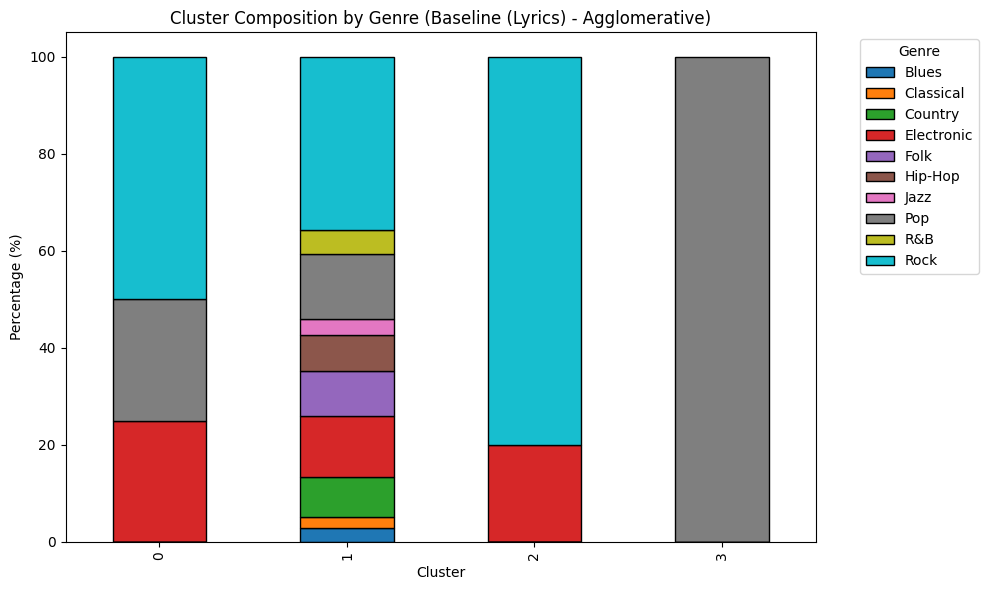


 Cluster Composition Counts (Baseline (Lyrics) - Agglomerative) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0            0          0        0           1     0        0     0     1   
1          735        534     2058        3179  2299     1866   784  3353   
2            0          0        0           1     0        0     0     0   
3            0          0        0           0     0        0     0     1   

Genre     R&B  Rock  
Cluster              
0           0     2  
1        1228  8954  
2           0     4  
3           0     0  

 Cluster Composition Percentages (Baseline (Lyrics) - Agglomerative) 
Genre       Blues  Classical   Country  Electronic     Folk   Hip-Hop  \
Cluster                                                                 
0        0.000000   0.000000  0.000000   25.000000  0.00000  0.000000   
1        2.941176   2.136855  8.235294   12.72108

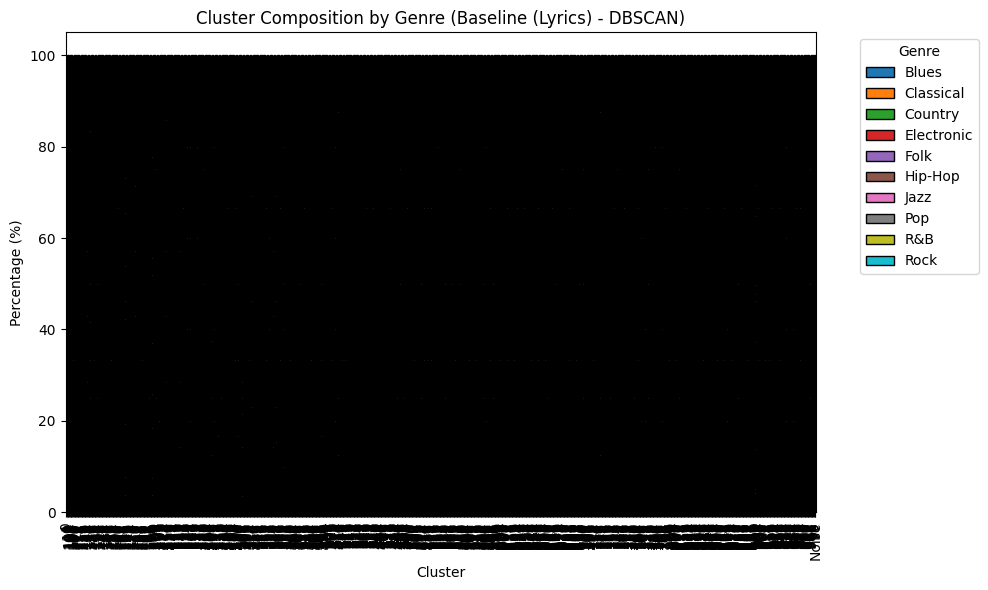


 Cluster Composition Counts (Baseline (Lyrics) - DBSCAN) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0            0          0        1           0     0        0     1     0   
1            0          0        1           0     3        0     0     0   
10           0          1        0           0     0        0     0     1   
100          0          0        0           0     0        1     0     3   
101          1          0        0           6     0        0     1     1   
...        ...        ...      ...         ...   ...      ...   ...   ...   
966          0          0        1           0     0        0     0     1   
97           0          0        0           0     0        0     1     0   
98           1          0        1           3     1        0     1     5   
99           0          0        1           0     1        0     0     0   
Noise      579   

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def cluster_composition(clusters, method_name="KMeans", le=None, true_labels_array=None):
    # Convert clusters to string for consistent labeling (Noise for -1)
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    elif true_labels_array is not None:
        genres = true_labels_array
    else:
        genres = clusters  
    
    # Make a DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar', stacked=True, figsize=(10,6), colormap='tab10', edgecolor='black'
    )
    plt.title(f"Cluster Composition by Genre ({method_name})")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(f"\n Cluster Composition Counts ({method_name}) ")
    print(cluster_counts)
    print(f"\n Cluster Composition Percentages ({method_name}) ")
    print(cluster_percent)

# for Lyrics-only baseline
for name, labels in results_lyrics.items():
    cluster_composition(labels, method_name=f"Baseline (Lyrics) - {name}", le=le)


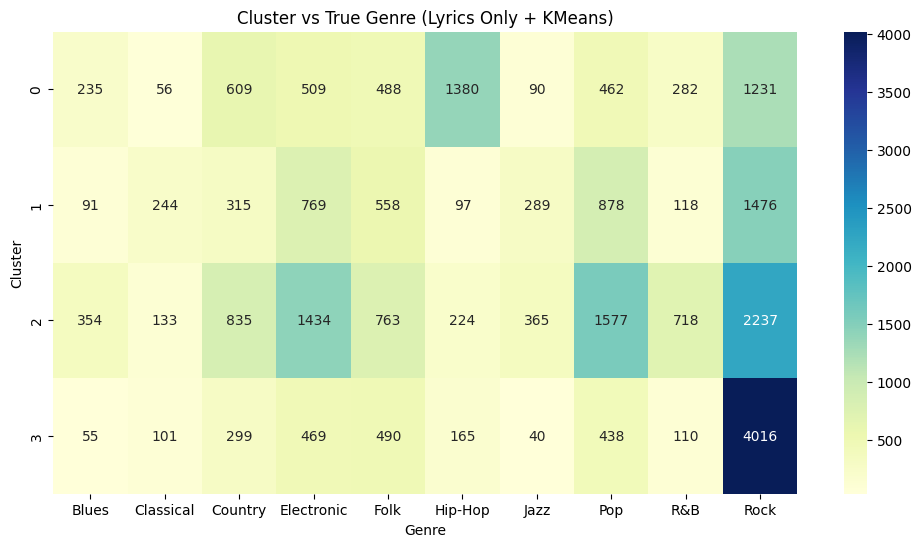

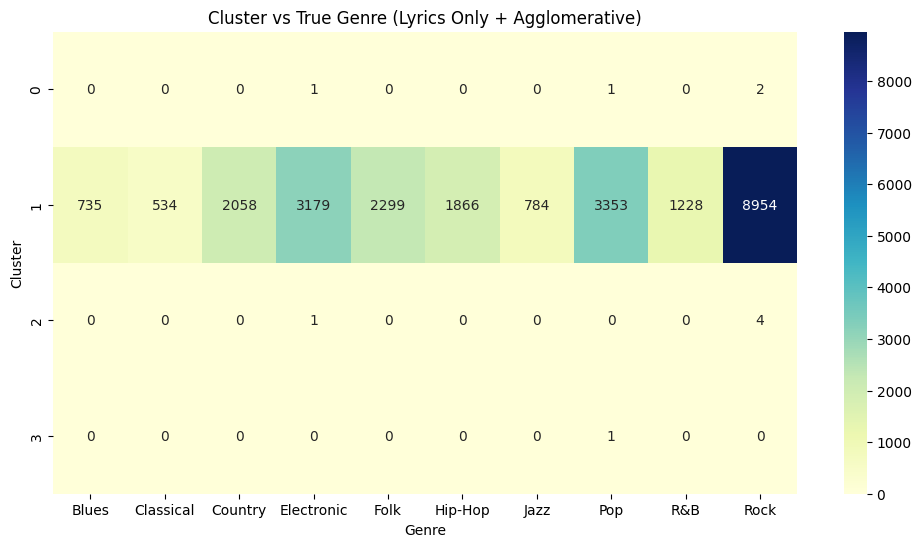

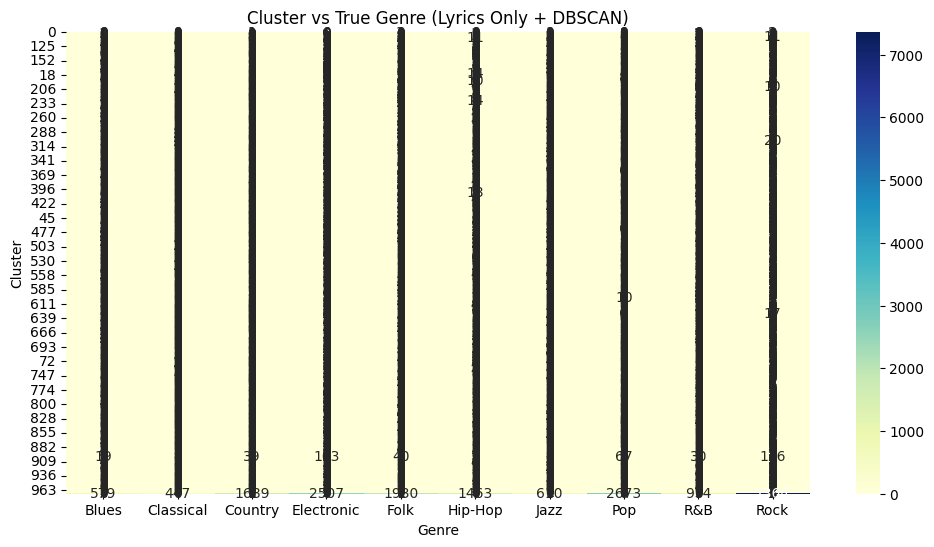

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    plt.figure(figsize=(12,6))
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Cluster vs True Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()

for name, labels in results_lyrics.items():
    cluster_heatmap(labels, f"Lyrics Only + {name}")